In [1]:
!unzip data_carozzi.zip

Archive:  data_carozzi.zip
   creating: data/
  inflating: data/data.csv           
  inflating: data/oil.csv            
  inflating: data/stores.csv         


In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

#Carga datos seteando sus tipos

In [9]:
dtypes = {'id':'uint32', 'item_nbr':'int32', 'store_nbr':'int8', 'onpromotion':str, 'sales':'float64'}
df = pd.read_csv('/content/data/data.csv', dtype=dtypes, parse_dates=['date'])
#setea el campo date como indice
df = df.set_index('date')
#crea los campos de tiempo
df['sales']=df['sales'] / 1000 #escalamos para manejar numeros mas pequeños
df['anio'] = df.index.year
df['mes'] = df.index.month
df['dia'] = df.index.day
df['dia_semana'] = df.index.day_name()
df.head()

,id,store_nbr,family,sales,onpromotion,anio,mes,dia,dia_semana
date,,,,,,,,,
2013-01-01,0,1,AUTOMOTIVE,0.0,0,2013,1,1,Tuesday
2013-01-01,1,1,BABY CARE,0.0,0,2013,1,1,Tuesday
2013-01-01,2,1,BEAUTY,0.0,0,2013,1,1,Tuesday
2013-01-01,3,1,BEVERAGES,0.0,0,2013,1,1,Tuesday
2013-01-01,4,1,BOOKS,0.0,0,2013,1,1,Tuesday


In [10]:
df[df.sales>0].describe()

,id,store_nbr,sales,anio,mes,dia
count,2.061758e+06,2.061758e+06,2.061758e+06,2.061758e+06,2.061758e+06,2.061758e+06
mean,1.663906e+06,2.704459e+01,5.207425e-01,2.015081e+03,6.310223e+00,1.565951e+01
std,8.429519e+05,1.581967e+01,1.297187e+00,1.318442e+00,3.391761e+00,8.783902e+00
min,5.630000e+02,1.000000e+00,1.220000e-04,2.013000e+03,1.000000e+00,1.000000e+00
25%,9.868242e+05,1.300000e+01,9.000000e-03,2.014000e+03,3.000000e+00,8.000000e+00
50%,1.752784e+06,2.700000e+01,7.846250e-02,2.015000e+03,6.000000e+00,1.600000e+01
75%,2.384994e+06,4.100000e+01,3.880000e-01,2.016000e+03,9.000000e+00,2.300000e+01
max,3.000887e+06,5.400000e+01,1.247170e+02,2.017000e+03,1.200000e+01,3.100000e+01


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3000888 entries, 2013-01-01 to 2017-08-15
Data columns (total 9 columns):
 #   Column       Dtype  
---  ------       -----  
 0   id           uint32 
 1   store_nbr    int8   
 2   family       object 
 3   sales        float64
 4   onpromotion  object 
 5   anio         int32  
 6   mes          int32  
 7   dia          int32  
 8   dia_semana   object 
dtypes: float64(1), int32(3), int8(1), object(3), uint32(1)
memory usage: 163.1+ MB


In [12]:
#Ceros por año, solo considerarremos desde el año 2015 para nuestro analisis
df.groupby('anio')['sales'].apply(lambda x: str(round((x == 0).sum() / len(x) * 100, 2))+'%')

,sales
anio,
2013,50.45%
2014,37.17%
2015,29.26%
2016,18.44%
2017,15.09%


In [13]:
#restringimos a los ultimos tres años
df_data = df[(df.anio >= 2015)]

**Normalizar los Datos para Manejar Escalas Grandes de Ventas**:Esto es útil para normalizar los datos y hacerlos más manejables, especialmente cuando hay valores muy altos que pueden distorsionar las métricas y análisis.

**Reduce la variabilidad**: Los modelos de ML tienden a ajustarse mejor a datos con menor variabilidad y que se acercan a una distribución más simétrica.


<ipython-input-455-102e82096668>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_data['log_sales'] = np.log1p(df_data['sales'])


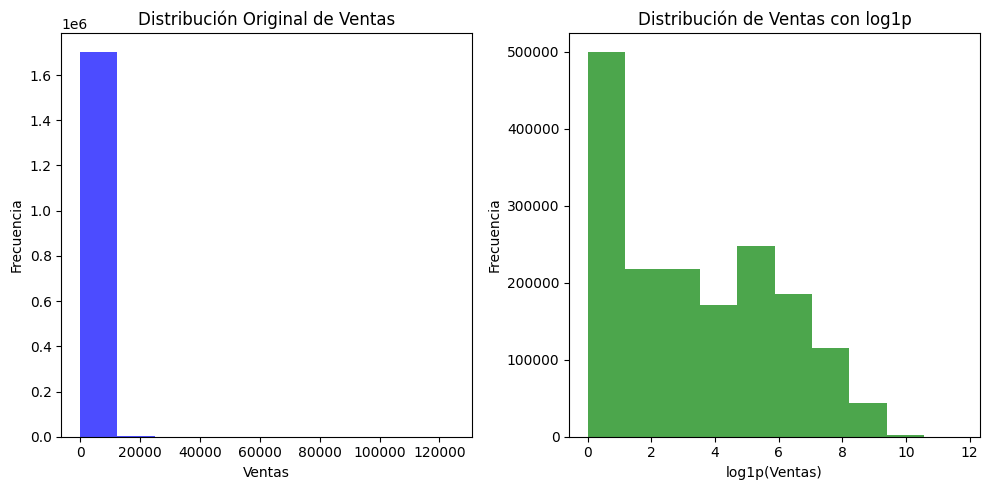

Varianza original: 1537031.5
Varianza con log1p: 6.94
Skew original: 7.04
Skew con log1p: 0.27
Kurtosis original: 152.05
Kurtosis con log1p: -1.13


In [455]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Histograma de los datos originales
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.hist(df_data['sales'], bins=10, color='blue', alpha=0.7)
plt.title("Distribución Original de Ventas")
plt.xlabel("Ventas")
plt.ylabel("Frecuencia")

# Aplicar log1p y mostrar el histograma transformado
df_data['log_sales'] = np.log1p(df_data['sales'])
# Reversar transformacion log1
#original_x = np.expm1(log_x)
#print(f"Valor original: {x}, Transformado: {log_x}, Revertido: {original_x}")
plt.subplot(1, 2, 2)
plt.hist(df_data['log_sales'], bins=10, color='green', alpha=0.7)
plt.title("Distribución de Ventas con log1p")
plt.xlabel("log1p(Ventas)")
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()

# Calcular la varianza antes y después de la transformación
original_variance = df_data['sales'].var()
log_variance = df_data['log_sales'].var()
original_skew = df_data['sales'].skew()
log_skew = df_data['log_sales'].skew()
original_kurt = df_data['sales'].kurt()
log_kurt = df_data['log_sales'].kurt()
print("Varianza original:", round(original_variance,2))
print("Varianza con log1p:", round(log_variance,2))
print("Skew original:", round(original_skew,2))
print("Skew con log1p:", round(log_skew,2))
print("Kurtosis original:", round(original_kurt,2))
print("Kurtosis con log1p:", round(log_kurt,2))

**Varianza**
- La reducción significativa en la varianza tras la transformación muestra que los datos están más concentrados y son menos variables.
- Un valor de 7.26 indica que los valores están ahora más concentrados alrededor de la media, haciendo que los datos sean más estables y menos afectados por valores extremadamente altos.

**Asimetría (Skew)**
- La transformación reduce la asimetría de la distribución, logrando una forma más simétrica y equilibrada.
- Un valor de **0.41** significa que la distribución ahora es mucho más simétrica, lo que implica que los valores extremos tienen menos influencia en la distribución transformada.

**Curtosis**
- La caída de la curtosis significa que los datos transformados tienen colas menos extremas, con menos influencia de los valores fuera del rango común.
- Una Curtosis de **-1.15** indica que las colas de la distribución ahora son mucho menos pronunciadas y que los valores están distribuidos de manera más uniforme. En términos prácticos, los valores extremos tienen mucho menos impacto en los datos transformados, lo que sugiere que los datos son más similares a una distribución normal.

Se mantienen las filas con venta igual a cero para Mantener la Continuidad Temporal o Predecir Probabilidad de Venta.

In [62]:
#Clase para almacenar el forecast de cada store
class Stores:
    def __init__(self, id, data):
        self.id = id
        self.name = None
        self.data = data
        self.forecast = None
        self.metrics = {}

    def set_forecast_data(self, forecast):
        self.forecast = forecast
        self.set_metrics()

    def set_metrics(self):
        y_hat = self.forecast[-1*weeks:][['yhat']]
        y = self.data[-1*weeks:]['y']
        y_hat = np.expm1(y_hat)*1000
        #revertimos la transformacion y reescalamos
        y = np.expm1(y)*1000
        mae = mean_absolute_error(y, y_hat)
        rmse = np.sqrt(mean_squared_error(y, y_hat))
        self.metrics = {'MAE':round(mae,2), 'RMSE':round(rmse,2)}

    def get_metrics(self, verbose=False):
        if self.forecast is None:
          print("No hay forecast para esta tienda")
          return None
        if verbose:
          print(f"Data Store Id {self.id}")
          print(f"MAE: {self.metrics['MAE']} \nRMSE {self.metrics['RMSE']}")
        return self.metrics

    def setGrowth(self, weeks=26):
      years = list(self.data.ds.dt.year.unique())
      years.sort(reverse=True)
      last_day = self.data['ds'].iloc[-1].day
      last_month = self.data['ds'].iloc[-1].month
      growths = {}
      for year in years:
        #filtrado por año
        data_tmp = self.data[self.data.ds.dt.year == year]
        #considera desde el mismo mes
        last_date = data_tmp[(data_tmp.ds.dt.month == last_month)]
        last_current_period = last_date['y'].iloc[-1]  # Último valor de ventas registrado
        last_forecast = pd.date_range(start=last_date.iloc[-1].ds, periods=26 + 1, freq='W')[-1]
        last_forecast_period = self.forecast[self.forecast['ds'] == last_forecast]['yhat'].values[0]  # Último valor proyectado
        # Calcular el % de crecimiento proyectado
        growth_projected = ((last_forecast_period - last_current_period) / last_current_period) * 100
        growths[year] = growth_projected
      self.metrics['growths'] = growths


In [17]:
def create_store(data, label='sales'):
  '''
  Crea una instancia de stores para un id de tienda especifico
  asociado a su data especifica, eliminando la ultima semana ya que esta incompleta
  '''
  store_nbr = data.store_nbr.unique()[0]
  data_tmp = data.resample('W').sum()[label].reset_index().rename(columns={'date': 'ds', label: 'y'}).iloc[:-1]
  data_tmp['y'] = np.log1p(data_tmp['y'])
  store = Stores(id=store_nbr, data=data_tmp)
  return store

##Crea una lista de objetos Store

In [130]:
stores = df_data.store_nbr.unique()#stores acrear
stores.sort()
data_by_store = [create_store(df_data[df_data.store_nbr == store], 'sales') for store in stores]

In [19]:
!pip install prophet

In [86]:
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np


class Forecast:
    '''
      Clase para realizar el forecast con Prophet
    '''

    def __init__(self, **kwargs):
        self.model = Prophet(**kwargs)

    def init(self, **kwargs):
        print(f"modelo inicializado con los siguientes parametros {kwargs}")

    def fit(self, data):
        print(f"data desde {data.ds.min()}  {data.ds.max()}")
        self.model.fit(data)

    def predict(self, regresors=None, **kwargs):
        df_future = self.model.make_future_dataframe(**kwargs)
        if regresors is not None:
          for column in list(regresors.columns):
            df_future[column] = regresors[column].values
        df_future.fillna(0,inplace=True)
        print(f"df_future: de {df_future.ds.min()} hasta {df_future.ds.max()}")
        return self.model.predict(df_future)

    def plot(self, forecast, store_id=0):
        fig = self.model.plot(forecast, xlabel='Date', ylabel='Sales by Week')
        plt.title(f"Store_Id {store_id}")
        plt.show()

    def plot_components(self, forecast):
        self.model.plot_components(forecast)


#Probamos con el store_nbr = 1 y sacamos 26 semanas al set de datos para validar

###Modelo por defecto

###Set cantidad de semanas a predecir

In [49]:
weeks = 12 # #semanas a predecir
test_results = {}

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/nwdp2czi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/bxoa06db.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28349', 'data', 'file=/tmp/tmplthkugb_/nwdp2czi.json', 'init=/tmp/tmplthkugb_/bxoa06db.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelgxfldz8i/prophet_model-20241112122542.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:25:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:25:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


data desde 2015-01-04 00:00:00  2017-05-21 00:00:00
df_future: de 2015-01-04 00:00:00 hasta 2017-08-13 00:00:00
Data Store Id 1
MAE: 5069.39 
RMSE 5777.68


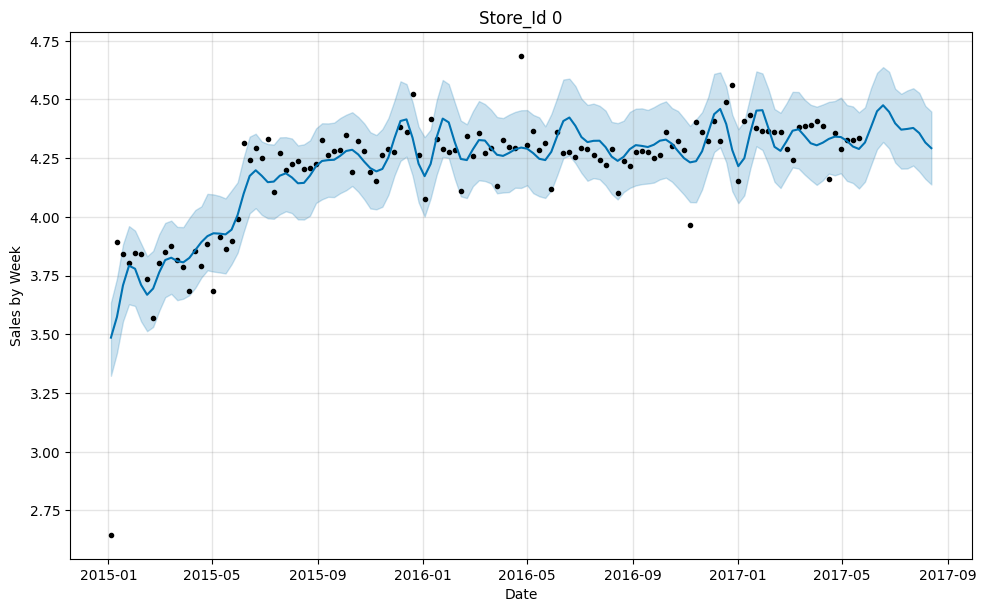

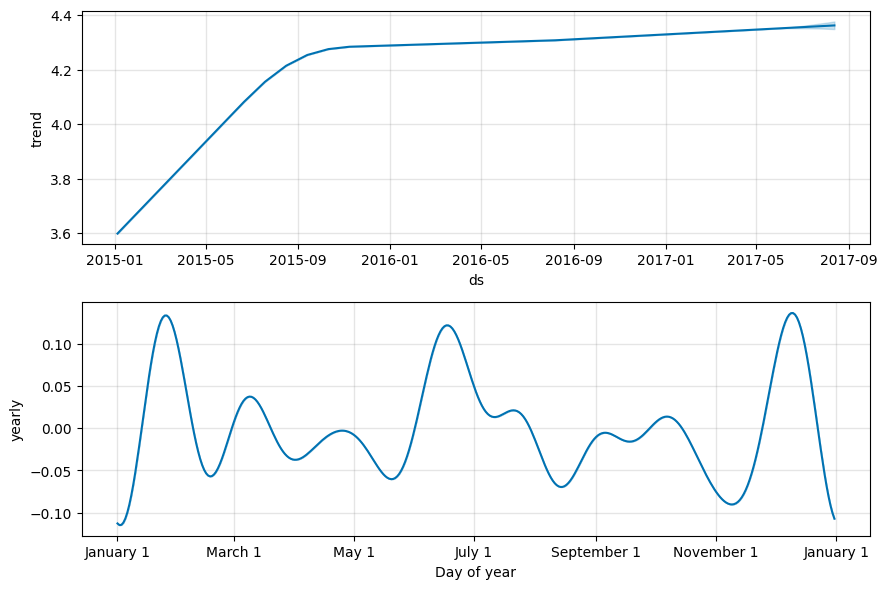

In [64]:
df_store = data_by_store[0]
model = Forecast()
model.fit(df_store.data[:-1*weeks])#entrenar con todos los datos excepto las ultimas n semanas a predecir
forecast = model.predict(periods=weeks, freq='W')
df_store.set_forecast_data(forecast)
#metrics
test_results['Modelo Default'] = df_store.get_metrics(verbose=True)
model.plot(forecast)
model.plot_components(forecast)

###Modelo por defecto añadiendo holidays

In [39]:
df_holidays = pd.read_csv("/content/holidays_events.csv")
df_holidays.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [40]:
df_holidays = df_holidays[df_holidays['transferred'] == False][['description', 'date']]
df_holidays.columns = ['holiday', 'ds']

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/vlpdjf3x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/f_a0qync.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76384', 'data', 'file=/tmp/tmplthkugb_/vlpdjf3x.json', 'init=/tmp/tmplthkugb_/f_a0qync.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelkna64i3b/prophet_model-20241112122553.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:25:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:25:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


data desde 2015-01-04 00:00:00  2017-05-21 00:00:00
df_future: de 2015-01-04 00:00:00 hasta 2017-08-13 00:00:00
Data Store Id 1
MAE: 10038.76 
RMSE 10401.18


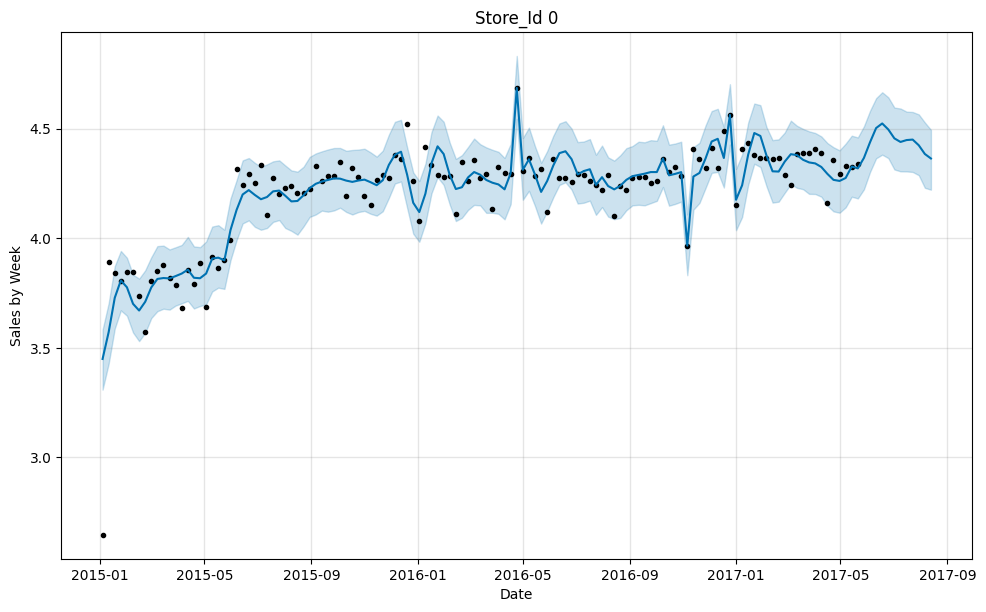

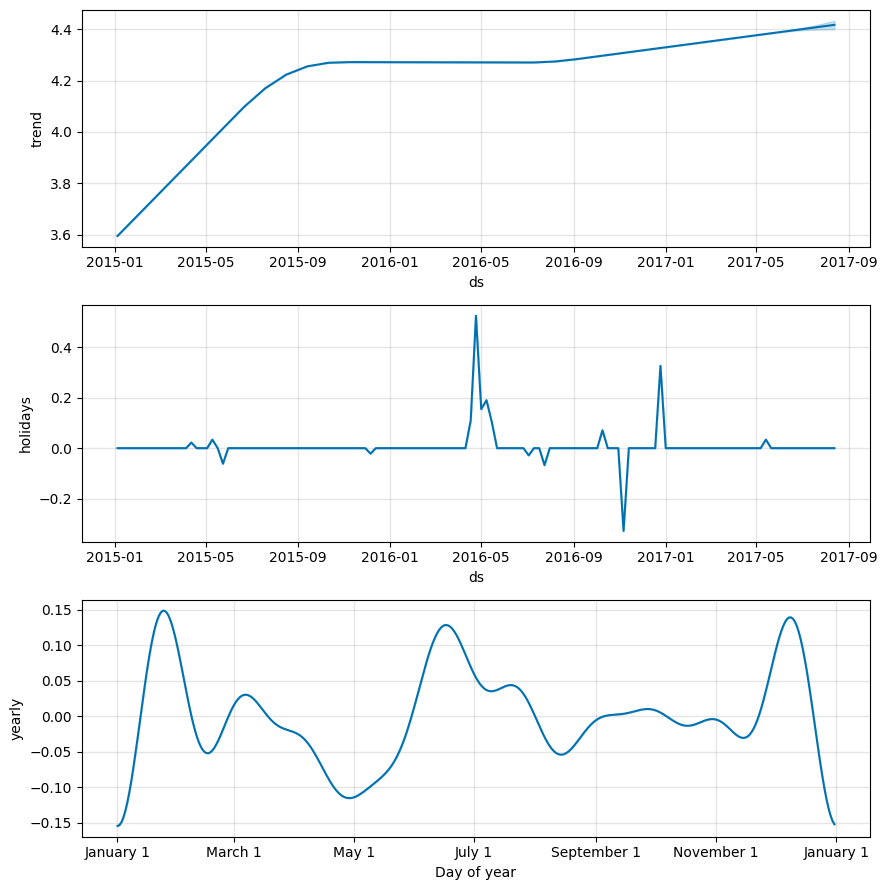

In [65]:
df_store = data_by_store[0]
model = Forecast(holidays=df_holidays)
model.fit(df_store.data[:-1*weeks])#entrenar con todos los datos excepto las ultimas n semanas a predecir
forecast = model.predict(periods=weeks, freq='W')
df_store.set_forecast_data(forecast)
test_results['Modelo Holidays file'] = df_store.get_metrics(verbose=True)
model.plot(forecast)
model.plot_components(forecast)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/_s4_y840.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/26l1upik.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69725', 'data', 'file=/tmp/tmplthkugb_/_s4_y840.json', 'init=/tmp/tmplthkugb_/26l1upik.json', 'output', 'file=/tmp/tmplthkugb_/prophet_model779jgn56/prophet_model-20241112122604.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:26:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:26:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


data desde 2015-01-04 00:00:00  2017-05-21 00:00:00
df_future: de 2015-01-04 00:00:00 hasta 2017-08-13 00:00:00
Data Store Id 1
MAE: 4979.9 
RMSE 5670.35


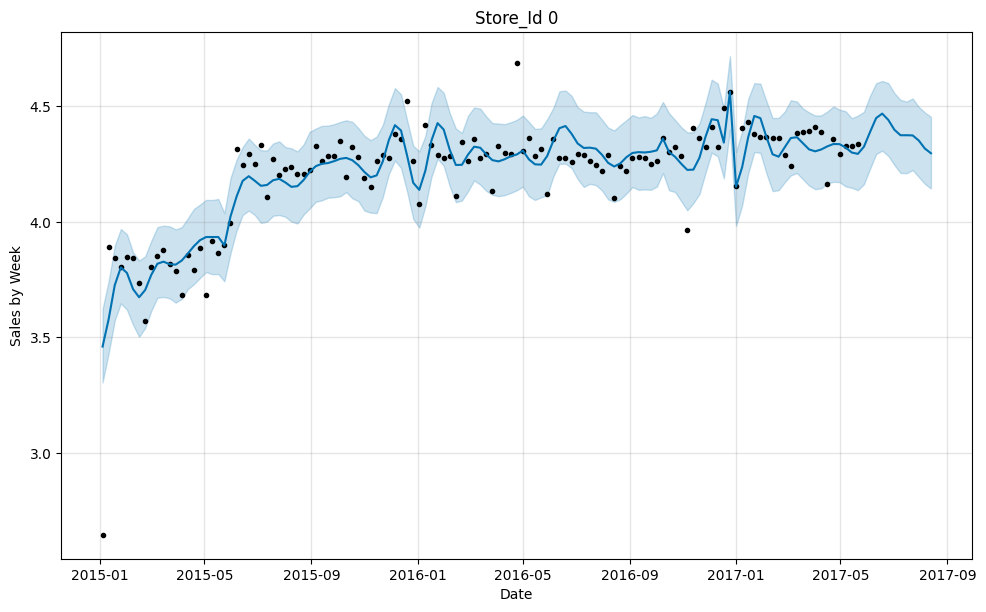

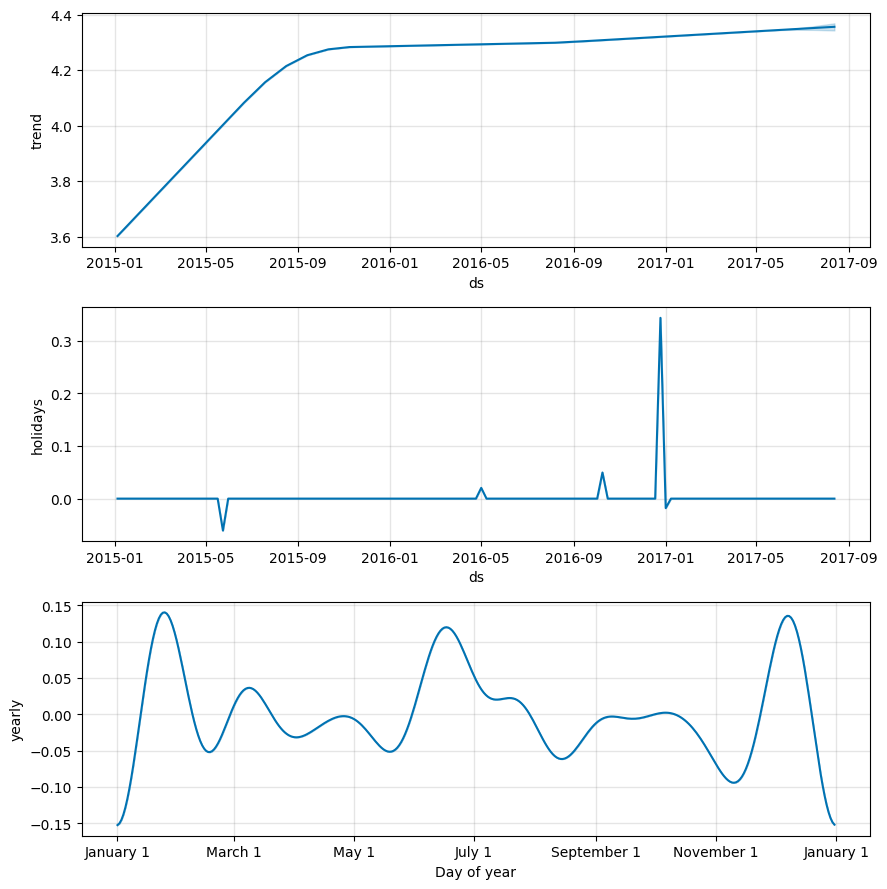

In [66]:
df_store = data_by_store[0]
model = Forecast()
model.model.add_country_holidays(country_name='EC')
model.fit(df_store.data[:-1*weeks])#entrenar con todos los datos excepto las ultimas n semanas a predecir
forecast = model.predict(periods=weeks, freq='W')
df_store.set_forecast_data(forecast)
test_results['Modelo Holidays EC'] = df_store.get_metrics(verbose=True)
model.plot(forecast)
model.plot_components(forecast)

###No se detecta mayor variabilidad al incluir los holidays, la mejora es minima

#Modelo con hiperparametros

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/0pu6oyi_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/l7_007st.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26561', 'data', 'file=/tmp/tmplthkugb_/0pu6oyi_.json', 'init=/tmp/tmplthkugb_/l7_007st.json', 'output', 'file=/tmp/tmplthkugb_/prophet_model9x8e9s_p/prophet_model-20241112122920.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:29:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:29:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


data desde 2015-01-04 00:00:00  2017-05-21 00:00:00
df_future: de 2015-01-04 00:00:00 hasta 2017-08-13 00:00:00
Data Store Id 1
MAE: 4591.89 
RMSE 5355.43


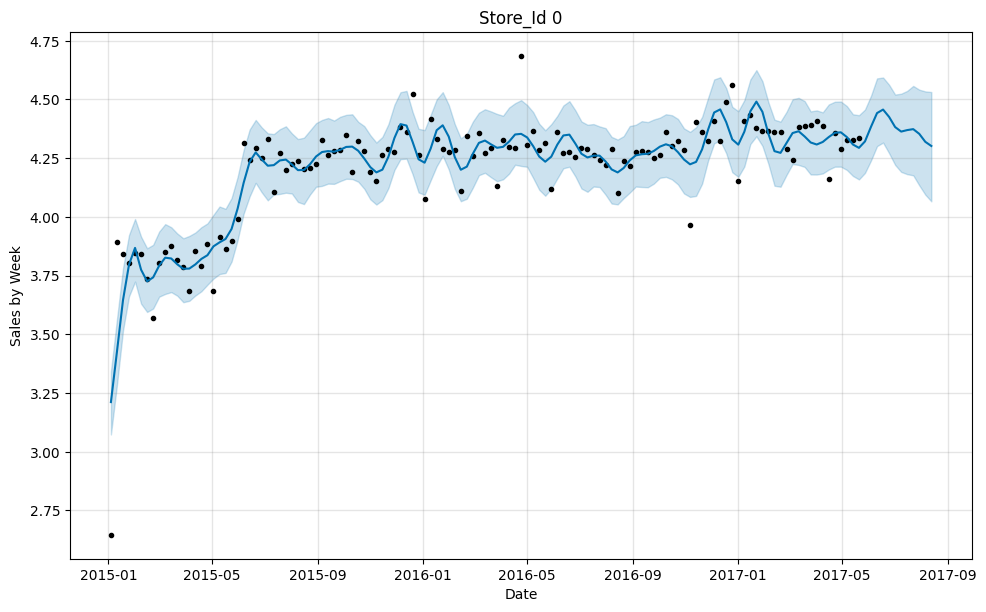

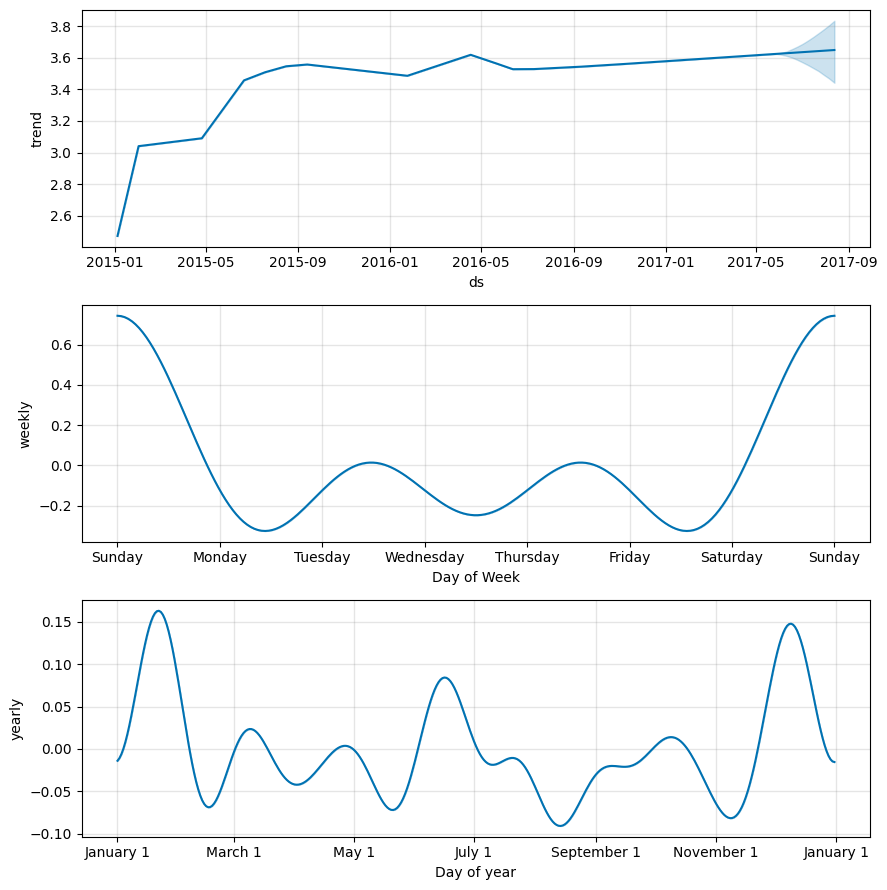

In [80]:
df_store = data_by_store[0]
model = Forecast(weekly_seasonality=True, yearly_seasonality=True, changepoint_prior_scale=0.9)
model.fit(df_store.data[:-1*weeks])#entrenar con todos los datos excepto las ultimas n semanas a predecir
forecast = model.predict(periods=weeks, freq='W')
df_store.set_forecast_data(forecast)
test_results['Modelo Hiperparams'] = df_store.get_metrics(verbose=True)
model.plot(forecast)
model.plot_components(forecast)

###Mejora el rendimiento del modelo al incluir hiperparametros

#Modelo con hiperparametros añadiendo estacionalidad mensual y definiendo el orden de los componentes de Fourier

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/o8iknyin.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/lsakxje8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44595', 'data', 'file=/tmp/tmplthkugb_/o8iknyin.json', 'init=/tmp/tmplthkugb_/lsakxje8.json', 'output', 'file=/tmp/tmplthkugb_/prophet_model0l0k997q/prophet_model-20241112122916.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:29:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-02-12 00:00:00


12:29:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2017-08-13 00:00:00
Data Store Id 1
MAE: 7163.04 
RMSE 8119.87


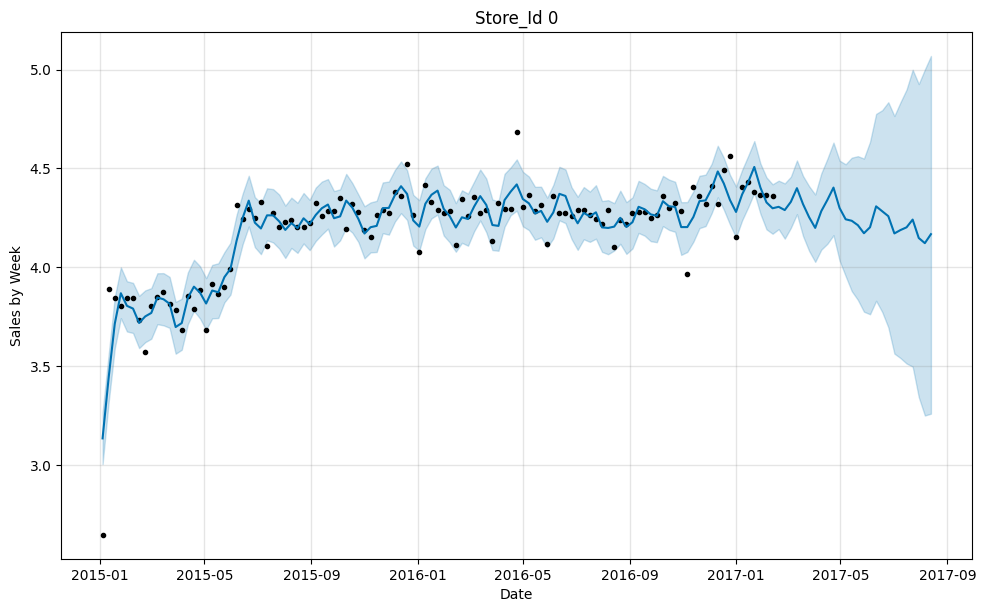

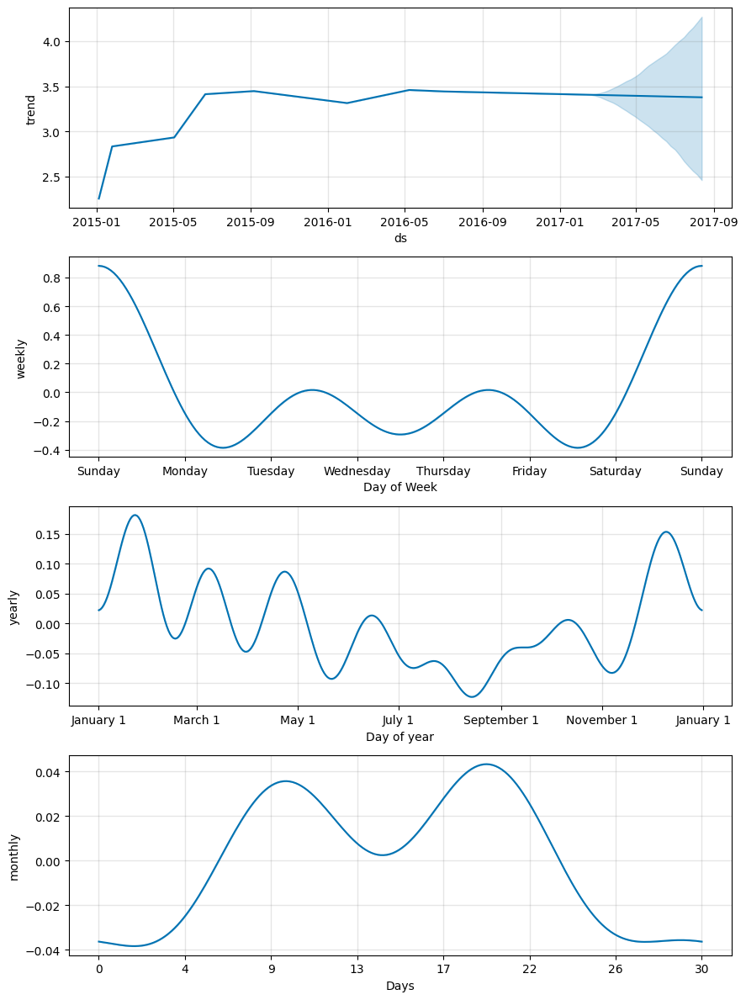

In [79]:
df_store = data_by_store[0]
model = Forecast(weekly_seasonality=True, yearly_seasonality=True, changepoint_prior_scale=0.9)
model.model.add_seasonality(name='monthly', period=30.5, fourier_order=3)
model.fit(df_store.data[:-1*weeks])#entrenar con todos los datos excepto las ultimas n semanas a predecir
#model.fit(df_store.data)#entrenar con todos los datos excepto las ultimas 26 semanas a predecir
forecast = model.predict(periods=weeks, freq='W')
df_store.set_forecast_data(forecast)
test_results['Modelo Hiperparams And Montly Fourier'] = df_store.get_metrics(verbose=True)
model.plot(forecast)
model.plot_components(forecast)

###Vemos una leve mejora al agregar esta estacionalidad y definicion del orden de los componentes de fourier.

#Añadiendo regresores, feature engineering

In [81]:
periodos = [2,4,8,12]
decay_rate = 0.9
for data_ in data_by_store:
  data_.data[f'q2'] = df_store.data['y'].quantile(0.5)
  data_.data[f'q3'] = df_store.data['y'].quantile(0.75)
  for i in periodos:
    data_.data[f'sales_{i}_decay'] = df_store.data['y'].rolling(window=i).apply(lambda x: np.sum(x * np.power(decay_rate, np.arange(len(x))[::-1])))
    data_.data[f'mean_{i}'] = df_store.data['y'].diff(i).mean()
    data_.data[f'var_{i}'] = df_store.data['y'].rolling(window=i).var()
    data_.data[f'skew_{i}'] = df_store.data['y'].rolling(window=i).skew()
    data_.data[f'kurt_{i}'] = df_store.data['y'].rolling(window=i).kurt()
    data_.data.fillna(0, inplace=True)
    data_.data = data_.data.round(2)

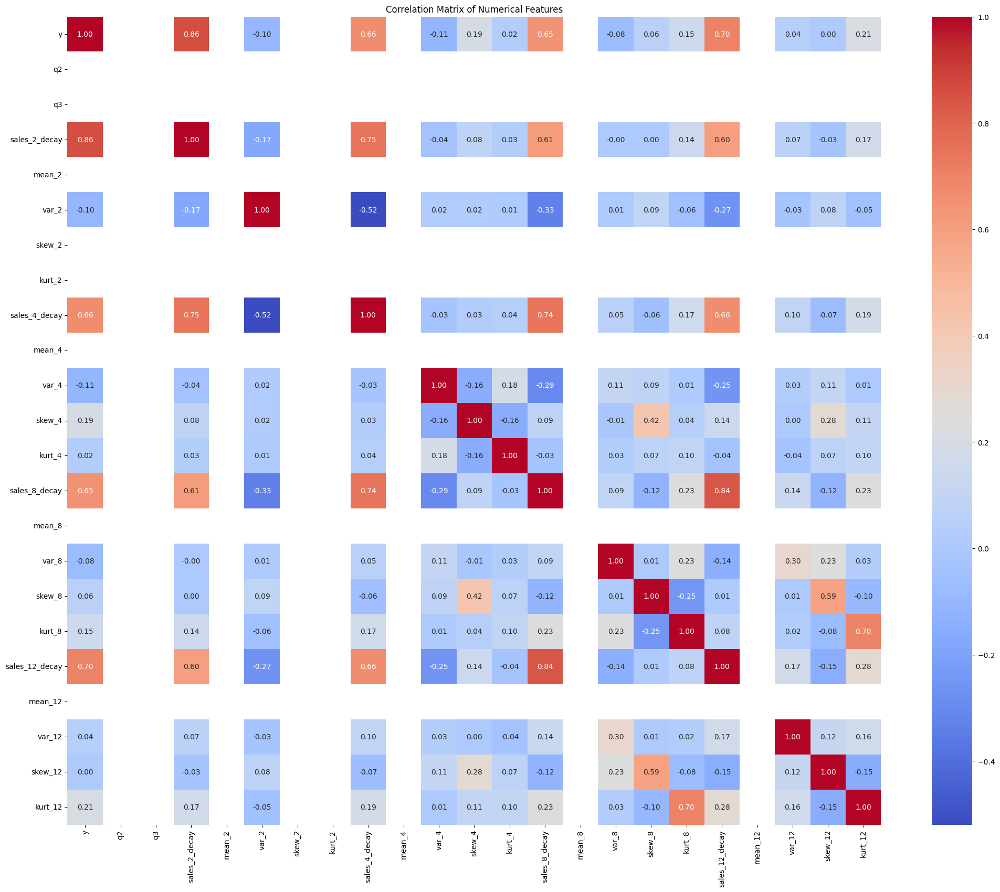

In [82]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df_data' is your DataFrame and you want the correlation matrix for numerical features
# Select numerical columns for correlation analysis
numerical_cols = data_by_store[0].data.select_dtypes(include=np.number).columns

# Calculate the correlation matrix
correlation_matrix = data_by_store[0].data[numerical_cols].corr()

# Create the heatmap
plt.figure(figsize=(25, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numerical Features')
plt.show()

In [129]:
#Realiza el forecast para cada tienda de forma separada
#si es train es false entonces se entrena con todo el set
def GetCompleteForecast(data_by_store, weeks, istrain=True):
  for data_store in data_by_store:
    model = Forecast(weekly_seasonality=True, yearly_seasonality=True, changepoint_prior_scale=0.9)
    #model.model.add_seasonality(name='monthly', period=30.5, fourier_order=3)
    columns = list(data_store.data.columns)
    for col in columns:
      if col not in ['ds', 'y']:
        model.model.add_regressor(col)
        print(f"columna {col} añadida como regresor")
    if istrain:
      model.fit(data_store.data[:-1*weeks][columns])
    else:
      model.fit(data_store.data[columns])
    columns.remove('ds')
    columns.remove('y')
    reg = pd.DataFrame(data_store.data[columns]) if len(columns) > 0 else None
    forecast = model.predict(regresors=reg, periods=weeks, freq='W')
    data_store.set_forecast_data(forecast)
    if istrain:
      data_store.get_metrics(verbose=True)
    else: data_store.setGrowth()
    model.plot(forecast, data_store.id)
    model.plot_components(forecast)
  return data_by_store

#Modelo con hiperparametros, estacionalidad y regresores

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/_zadq0dt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/2slqto8s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66025', 'data', 'file=/tmp/tmplthkugb_/_zadq0dt.json', 'init=/tmp/tmplthkugb_/2slqto8s.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelawqiypcu/prophet_model-20241112123935.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:39:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


columna q2 añadida como regresor
columna q3 añadida como regresor
columna sales_2_decay añadida como regresor
columna mean_2 añadida como regresor
columna var_2 añadida como regresor
columna skew_2 añadida como regresor
columna kurt_2 añadida como regresor
columna sales_4_decay añadida como regresor
columna mean_4 añadida como regresor
columna var_4 añadida como regresor
columna skew_4 añadida como regresor
columna kurt_4 añadida como regresor
columna sales_8_decay añadida como regresor
columna mean_8 añadida como regresor
columna var_8 añadida como regresor
columna skew_8 añadida como regresor
columna kurt_8 añadida como regresor
columna sales_12_decay añadida como regresor
columna mean_12 añadida como regresor
columna var_12 añadida como regresor
columna skew_12 añadida como regresor
columna kurt_12 añadida como regresor
data desde 2015-01-04 00:00:00  2017-05-21 00:00:00


12:39:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2017-08-13 00:00:00
Data Store Id 1
MAE: 19231.25 
RMSE 20867.83


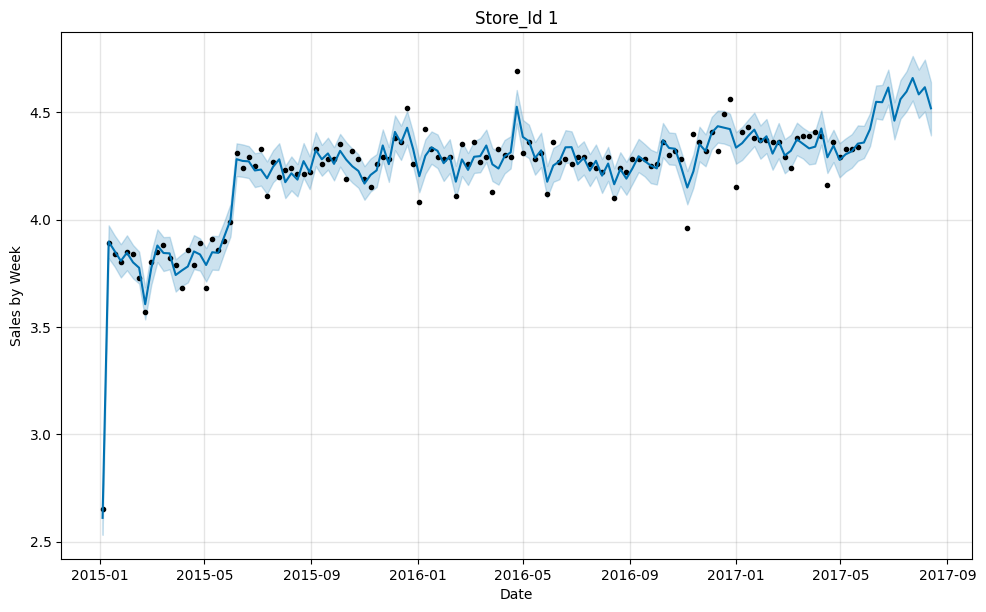

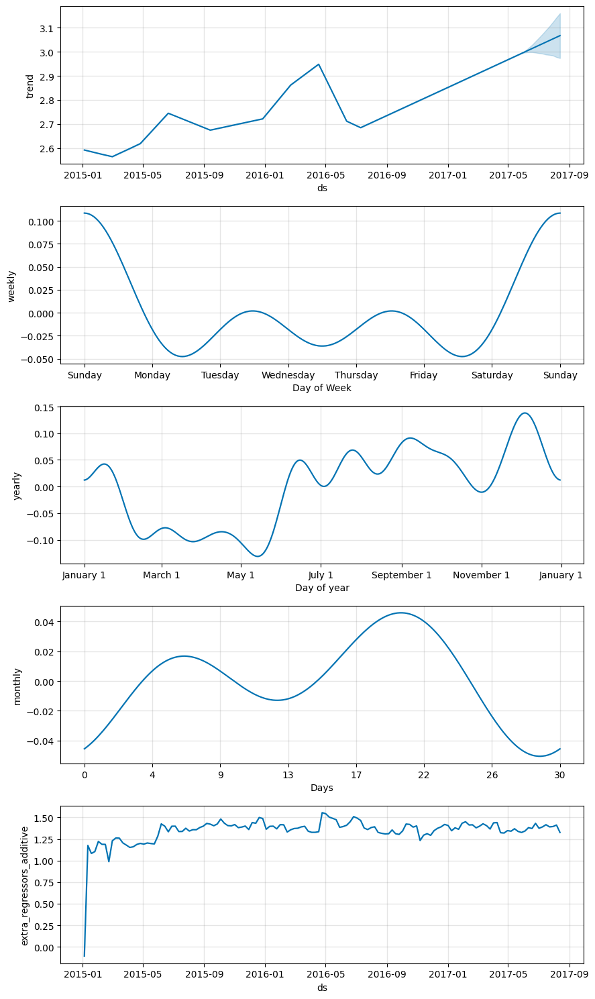

In [92]:
df_store = data_by_store[0]
tmp = GetCompleteForecast([df_store], weeks, istrain=True)
test_results['Modelo con Regresores'] = tmp[0].metrics

###el resultado se ve bastante degradado ya que al parecer se sobreajusta a los datos.

In [96]:
df_oil = pd.read_csv('/content/data/oil.csv', parse_dates=['date'])
df_oil.fillna(0, inplace=True)
df_oil.head()

,date,dcoilwtico
0,2013-01-01,0.00
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


In [99]:
weekly_oil = df_oil.set_index('date').resample('W').mean()['dcoilwtico']
weekly_oil.head()

,dcoilwtico
date,
2013-01-06,69.8075
2013-01-13,93.3800
2013-01-20,94.5820
2013-01-27,76.3300
2013-02-03,97.3320


In [110]:
# Análisis de correlación entre ventas y precio del petróleo
weekly_sales = df_data.resample('W').sum()['sales']
weekly_data = pd.DataFrame({'sales': weekly_sales, 'oil_price': weekly_oil})
weekly_data = weekly_data[weekly_data.index.year >= 2015]
weekly_data.head()

,sales,oil_price
date,,
2015-01-04,2050.341472,42.754
2015-01-11,3662.996663,48.774
2015-01-18,3332.458054,47.066
2015-01-25,3269.002809,37.166
2015-02-01,3397.417535,45.326


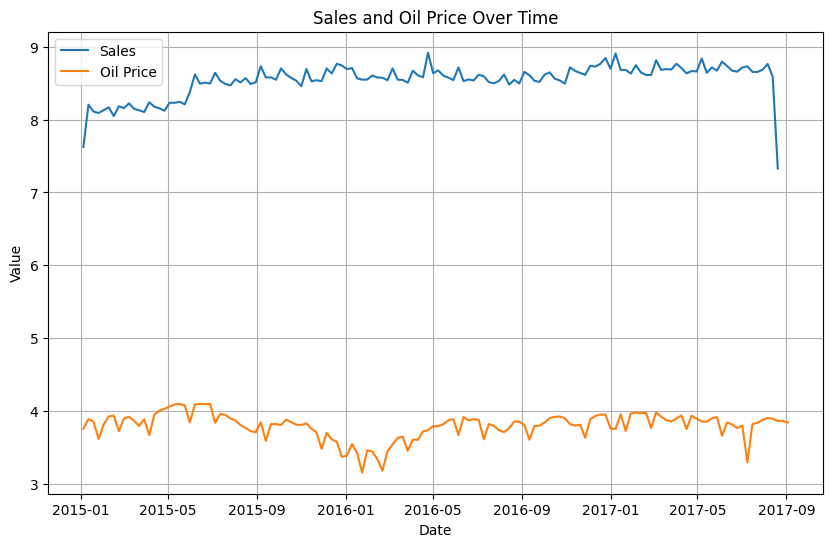

In [120]:
# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(weekly_data.index, np.log(weekly_data['sales']), label='Sales')
plt.plot(weekly_data.index, np.log(weekly_data['oil_price']), label='Oil Price')

plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Sales and Oil Price Over Time')
plt.legend()
plt.grid(True)
plt.show()

In [111]:
correlation = weekly_data.corr().loc['sales', 'oil_price']
print("Correlación entre ventas y precio del petróleo:", round(correlation,2))

Correlación entre ventas y precio del petróleo: -0.18


In [125]:
df_store = data_by_store[0]
df_store.data['oil_price'] = weekly_data.oil_price[:137].values

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/kzl0r0p0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/8qksn1ld.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20402', 'data', 'file=/tmp/tmplthkugb_/kzl0r0p0.json', 'init=/tmp/tmplthkugb_/8qksn1ld.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelm4tbawts/prophet_model-20241112130356.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:03:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:03:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


columna oil_price añadida como regresor
data desde 2015-01-04 00:00:00  2017-05-21 00:00:00
df_future: de 2015-01-04 00:00:00 hasta 2017-08-13 00:00:00
Data Store Id 1
MAE: 5741.84 
RMSE 6602.36


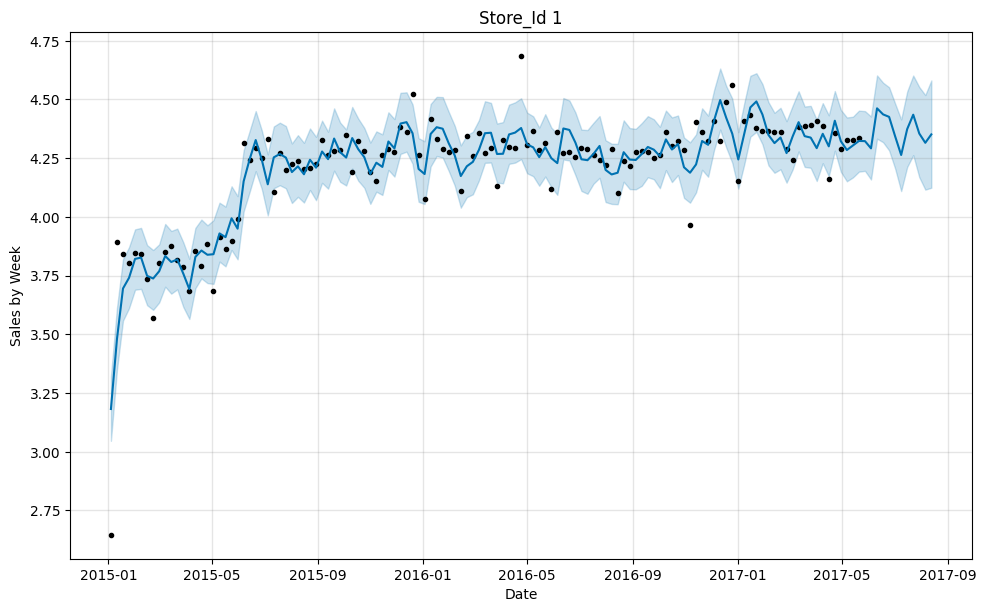

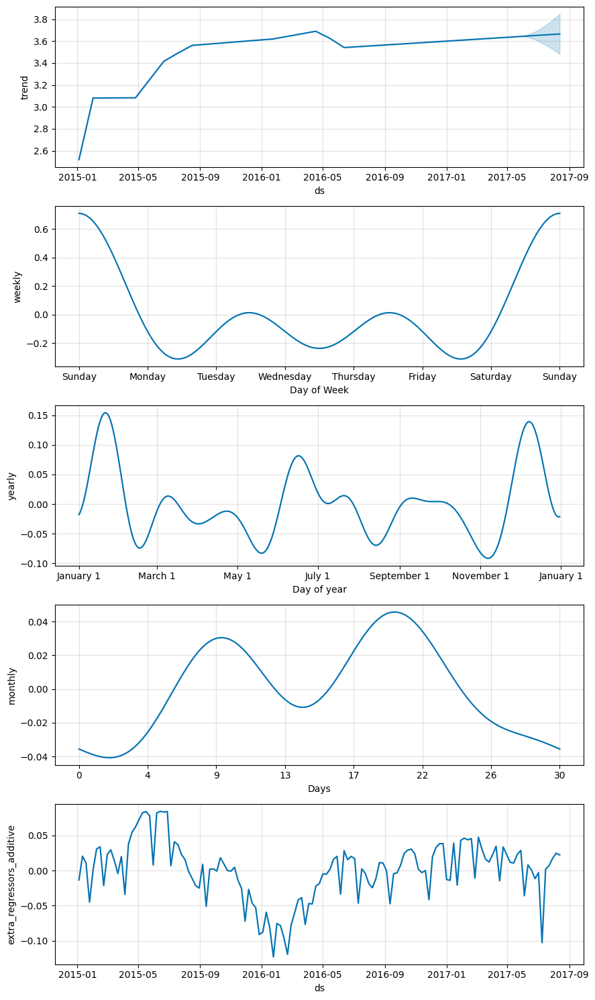

In [126]:
tmp = GetCompleteForecast([df_store], weeks, istrain=True)
test_results['Modelo con Regresor Oil Price'] = tmp[0].metrics

In [128]:
for k,v in test_results.items():
  print(f"{k} MAE {v.get('MAE')} RMSE {v.get('RMSE')}")

Modelo Default MAE 5069.39 RMSE 5777.68
Modelo Holidays file MAE 10038.76 RMSE 10401.18
Modelo Holidays EC MAE 4979.9 RMSE 5670.35
Modelo Hiperparams MAE 4591.89 RMSE 5355.43
Modelo Hiperparams And Montly Fourier MAE 7163.04 RMSE 8119.87
Modelo con Regresores MAE 19231.25 RMSE 20867.83
Modelo con Regresor Oil Price MAE 5741.84 RMSE 6602.36


###Finalmente el mejor modelo fue el con hiperparametros

#Forecast 26 semanas

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/0pen5qj7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/qbtr502d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59500', 'data', 'file=/tmp/tmplthkugb_/0pen5qj7.json', 'init=/tmp/tmplthkugb_/qbtr502d.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelhtvak59k/prophet_model-20241112130946.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:09:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:09:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00
df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


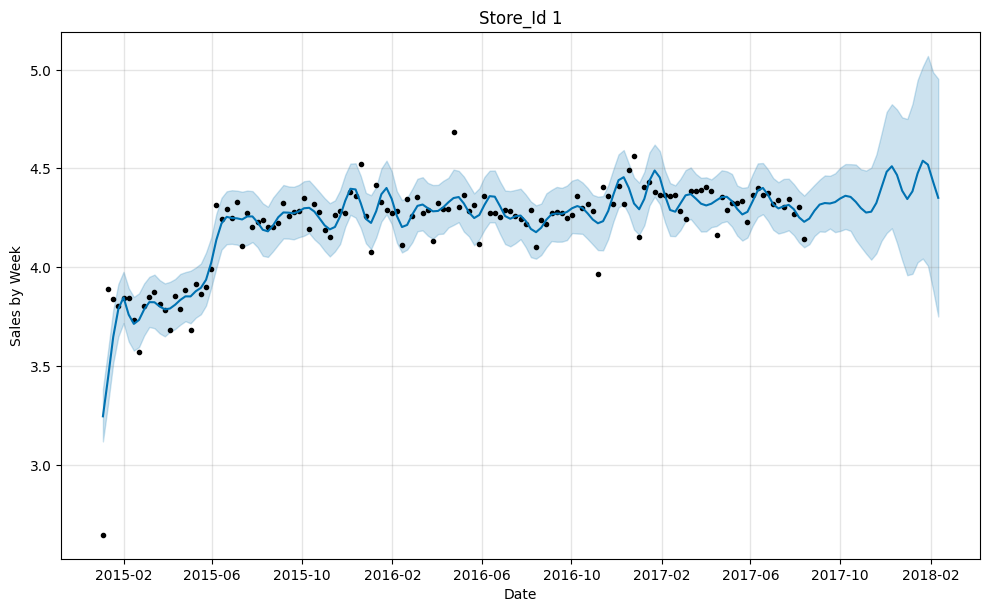

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/tx2zdb3g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/mp7bo_wy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51557', 'data', 'file=/tmp/tmplthkugb_/tx2zdb3g.json', 'init=/tmp/tmplthkugb_/mp7bo_wy.json', 'output', 'file=/tmp/tmplthkugb_/prophet_model_ku3to5v/prophet_model-20241112130947.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:09:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:09:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


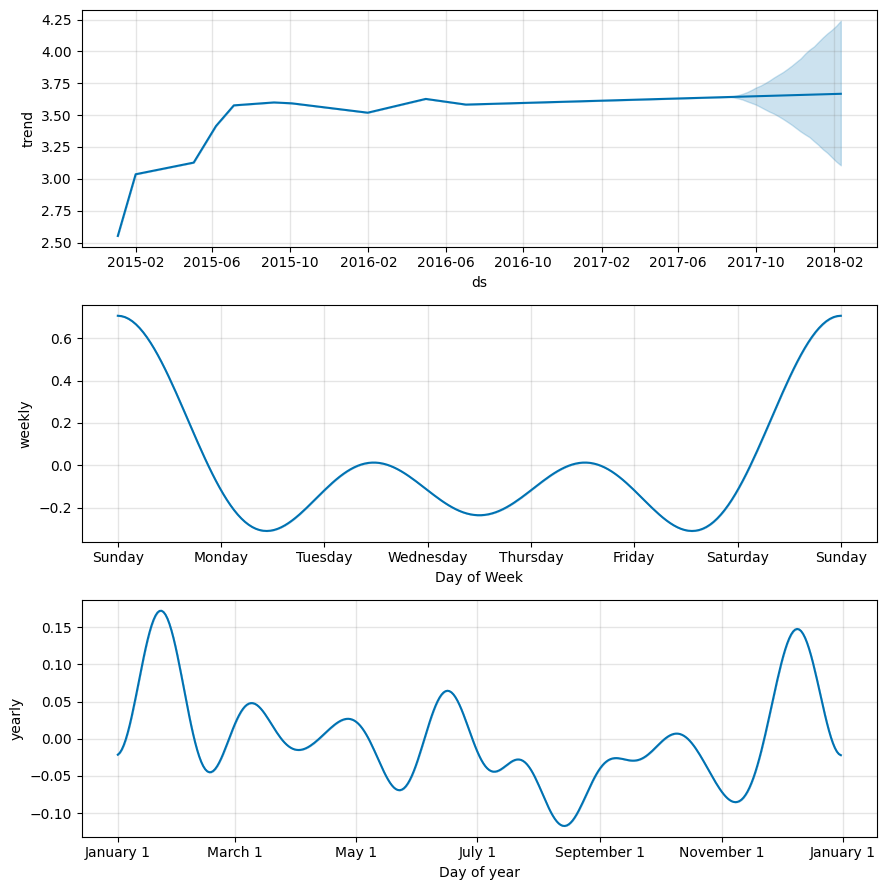

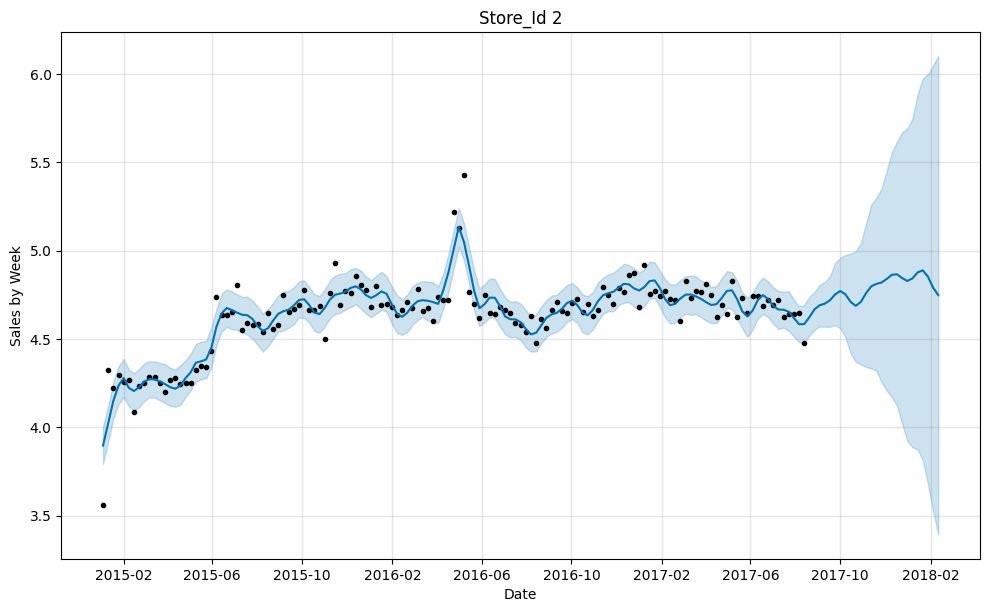

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/6dyzabqp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/mq87ortt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39355', 'data', 'file=/tmp/tmplthkugb_/6dyzabqp.json', 'init=/tmp/tmplthkugb_/mq87ortt.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modeljj0zfshp/prophet_model-20241112130948.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:09:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:09:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


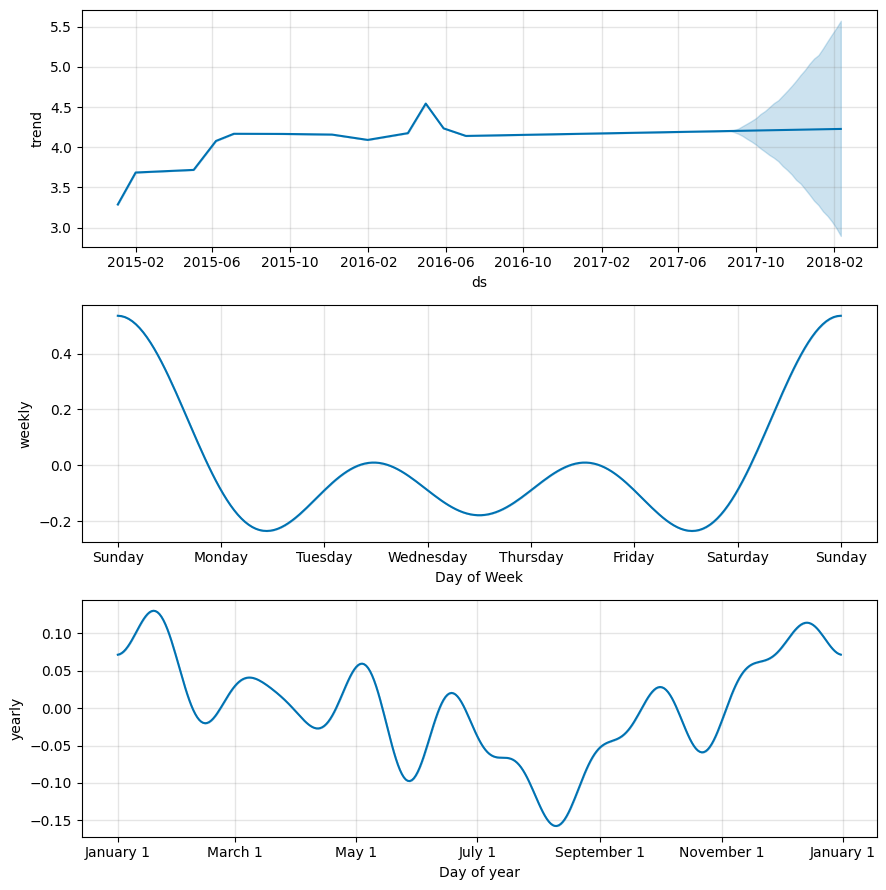

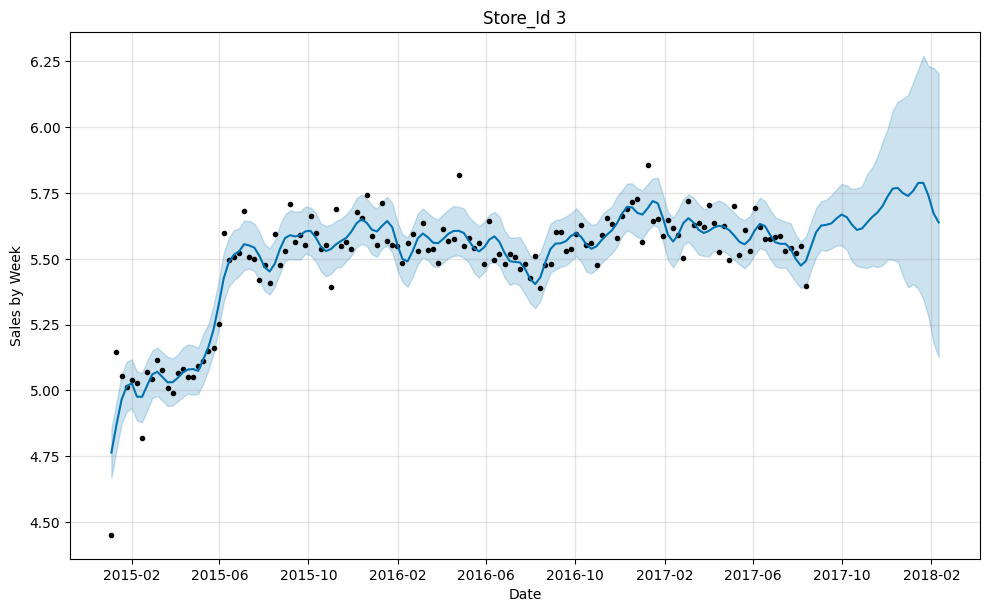

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/u87nvu4v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/9w761mw8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93012', 'data', 'file=/tmp/tmplthkugb_/u87nvu4v.json', 'init=/tmp/tmplthkugb_/9w761mw8.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelflzqh2c3/prophet_model-20241112130950.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:09:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:09:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


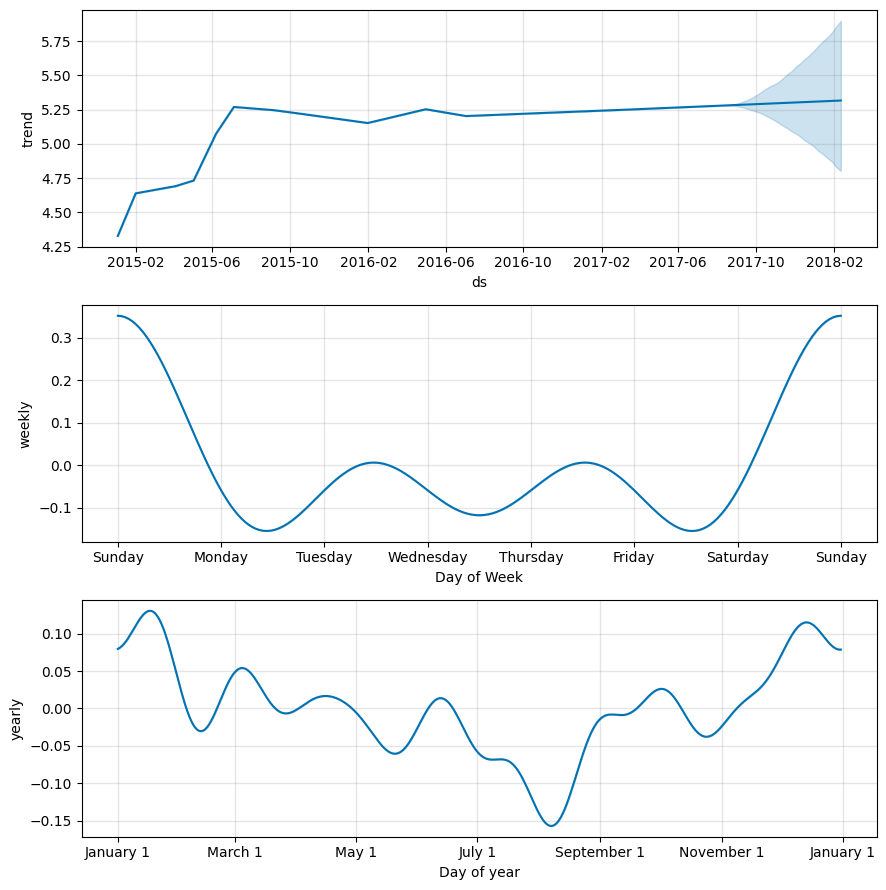

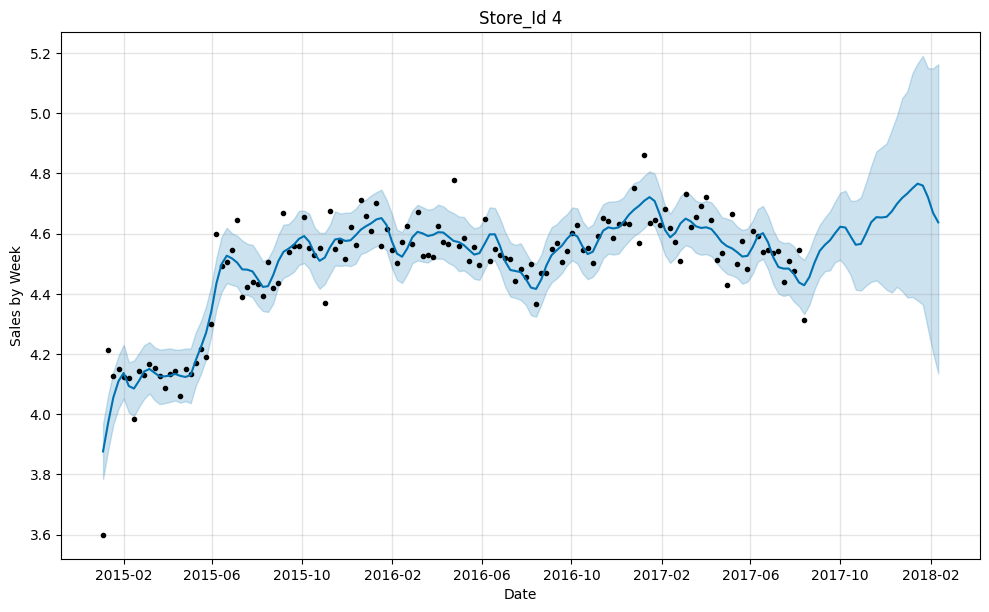

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/xrbmhjex.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/zrfmi7fx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56281', 'data', 'file=/tmp/tmplthkugb_/xrbmhjex.json', 'init=/tmp/tmplthkugb_/zrfmi7fx.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelyxvt_vq9/prophet_model-20241112130952.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:09:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:09:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


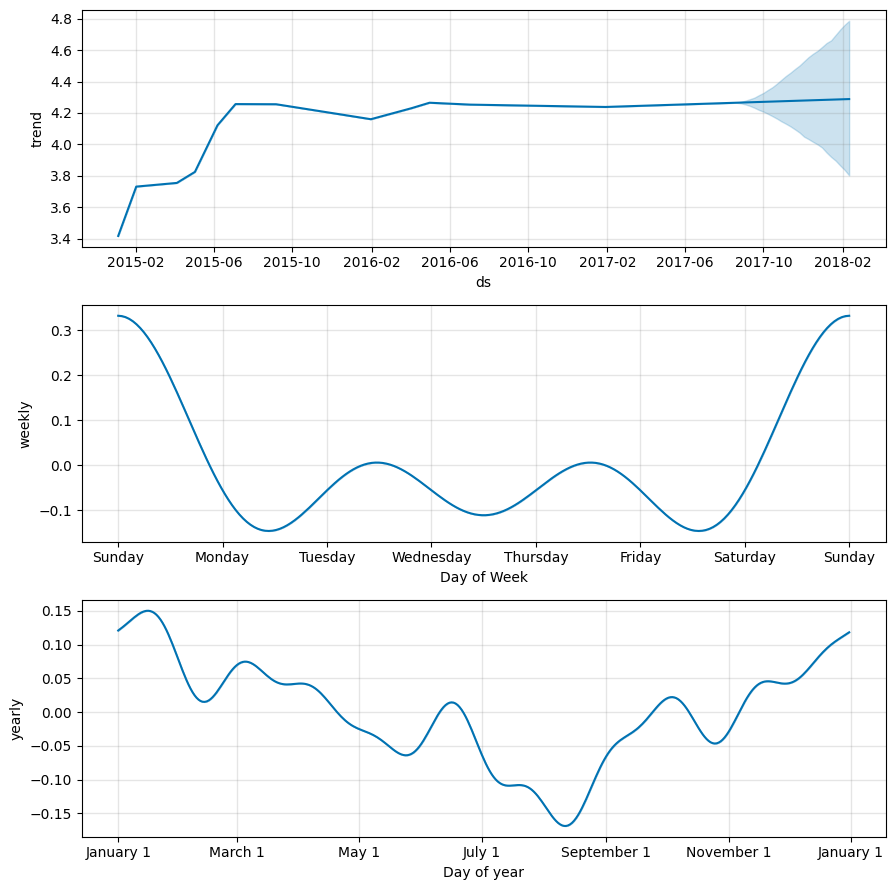

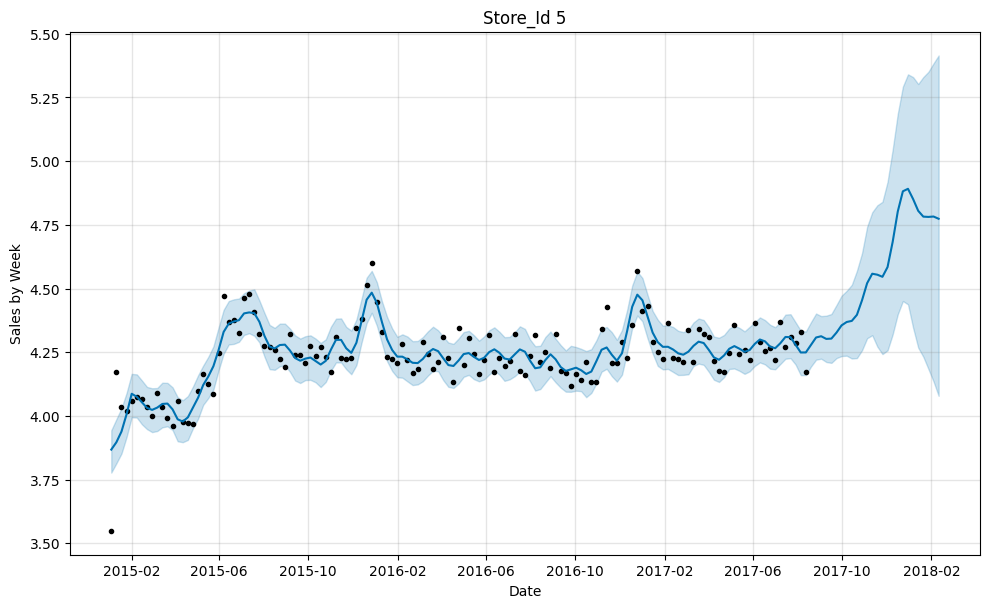

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/1ftrs95f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/vhn1zqs7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12044', 'data', 'file=/tmp/tmplthkugb_/1ftrs95f.json', 'init=/tmp/tmplthkugb_/vhn1zqs7.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelj15nb7vj/prophet_model-20241112130954.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:09:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:09:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


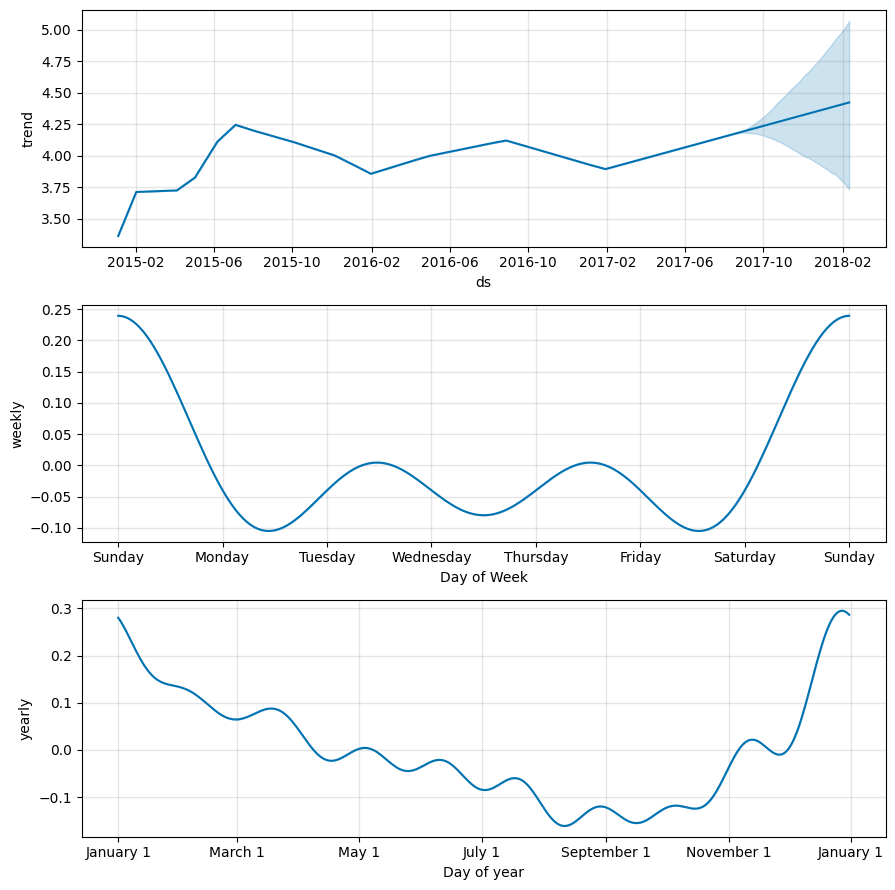

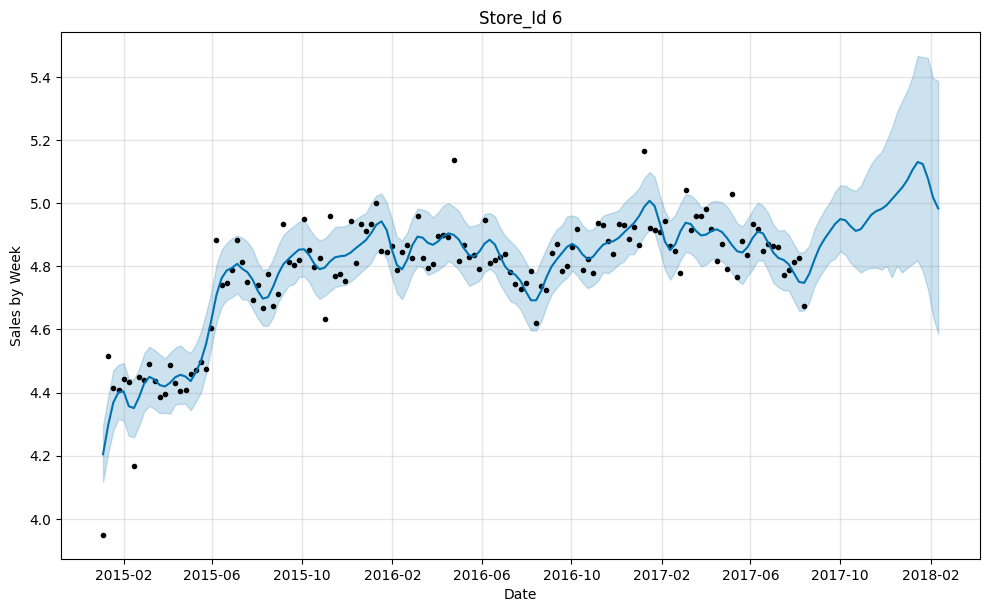

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/0whdx5uf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/r7fy1qmd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31956', 'data', 'file=/tmp/tmplthkugb_/0whdx5uf.json', 'init=/tmp/tmplthkugb_/r7fy1qmd.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelfr0bty5b/prophet_model-20241112130956.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:09:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:09:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


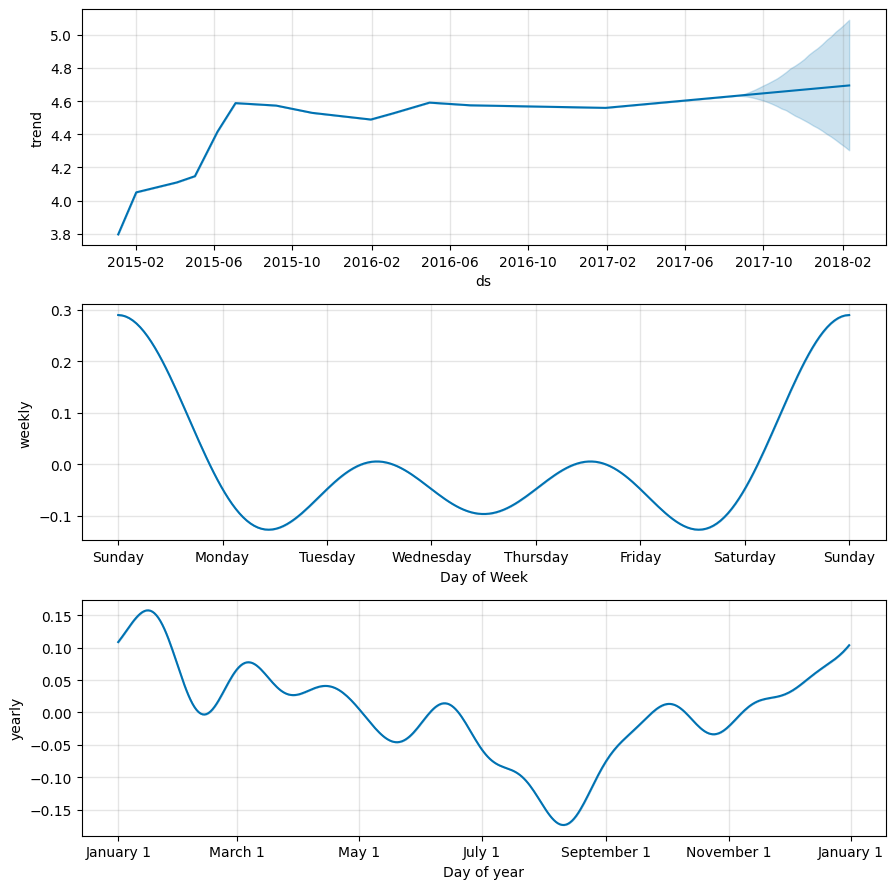

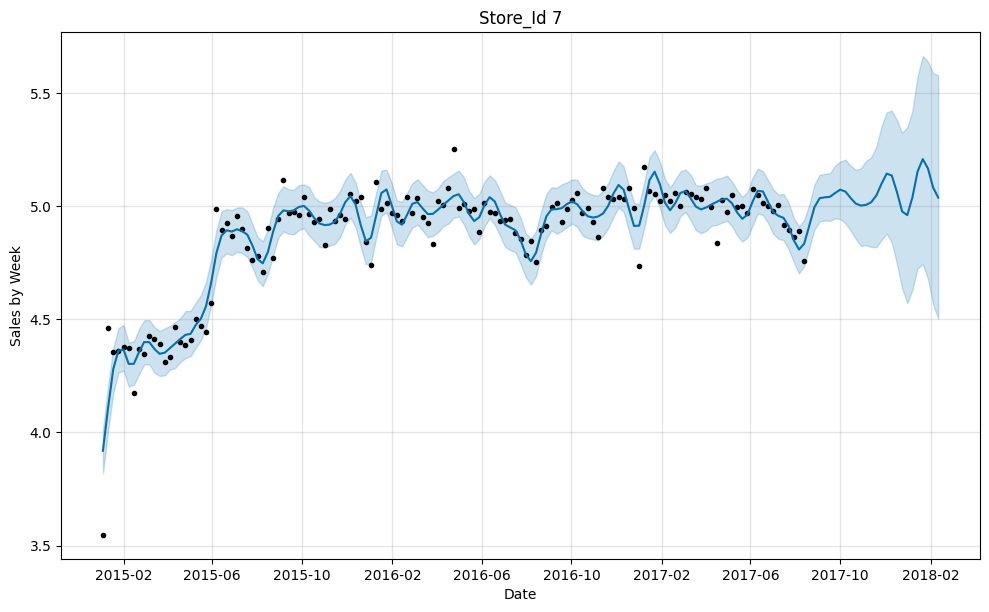

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/7qwaif3u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/k9kfwpv5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37409', 'data', 'file=/tmp/tmplthkugb_/7qwaif3u.json', 'init=/tmp/tmplthkugb_/k9kfwpv5.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelswncralk/prophet_model-20241112130958.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:09:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:09:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


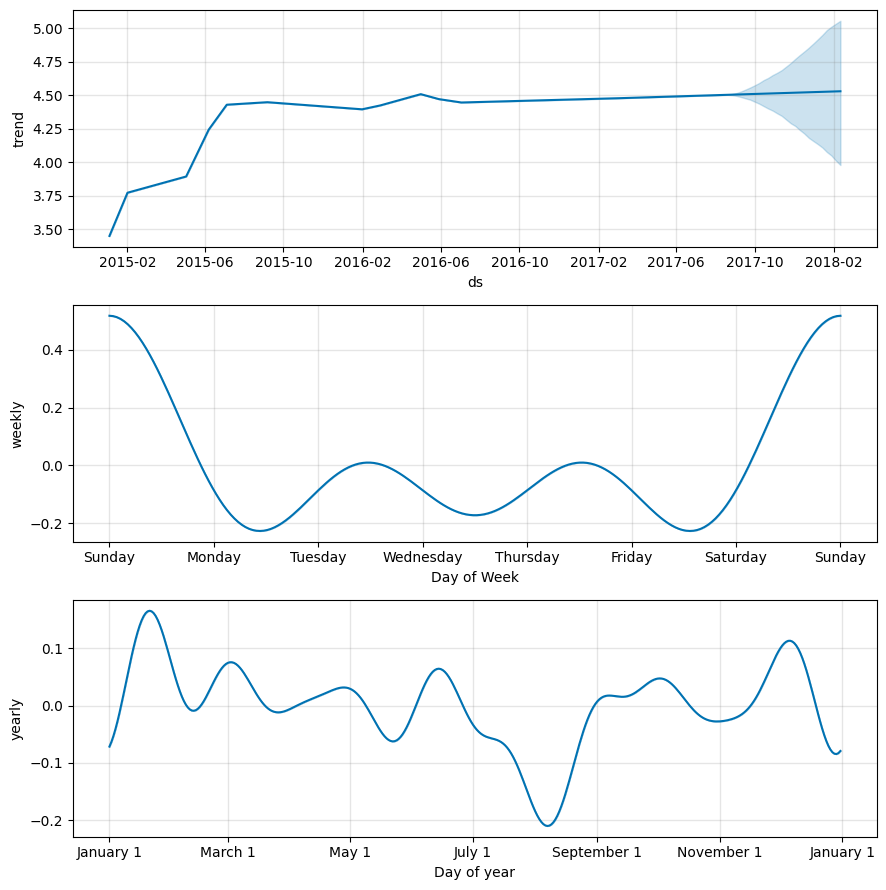

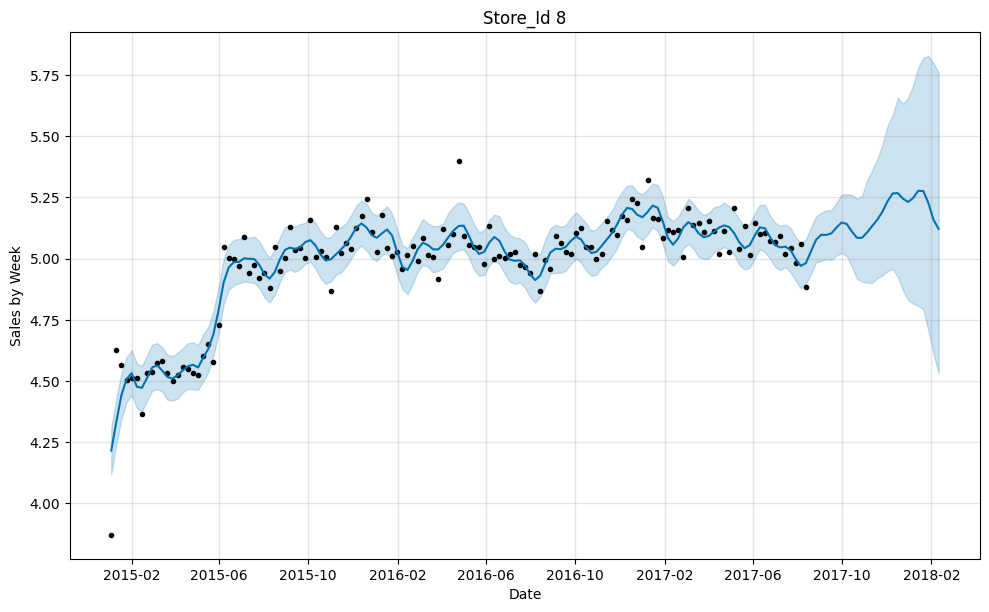

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/ajshnlvs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/f8aiie5l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12403', 'data', 'file=/tmp/tmplthkugb_/ajshnlvs.json', 'init=/tmp/tmplthkugb_/f8aiie5l.json', 'output', 'file=/tmp/tmplthkugb_/prophet_model1d0xy4zi/prophet_model-20241112130959.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:09:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:09:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


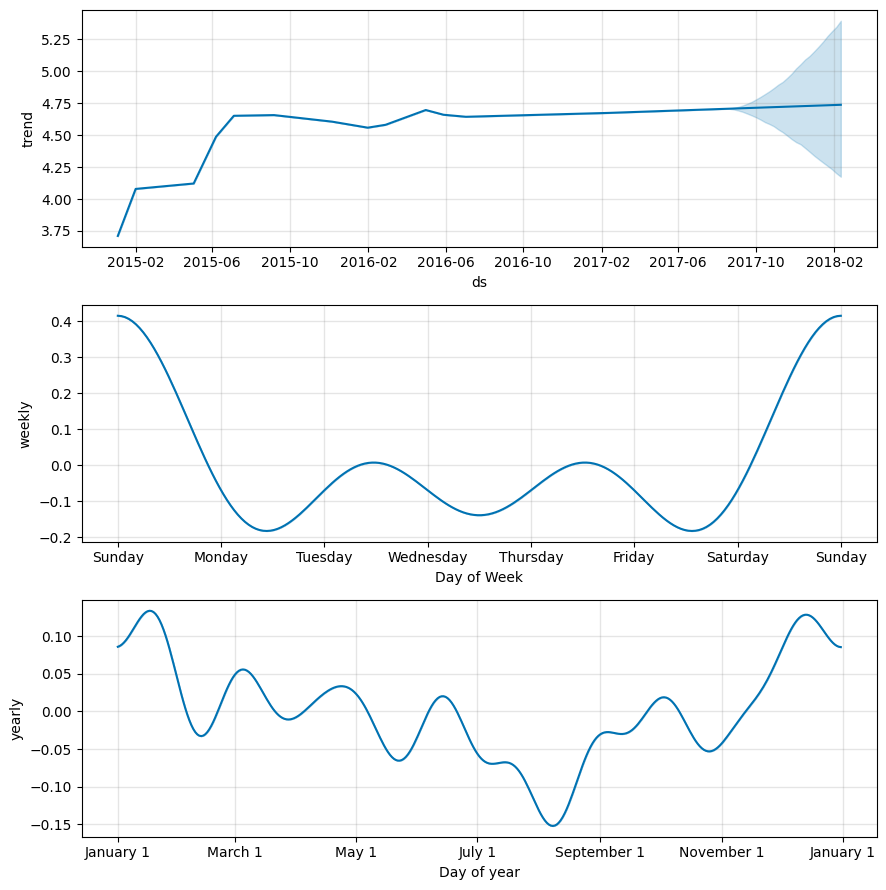

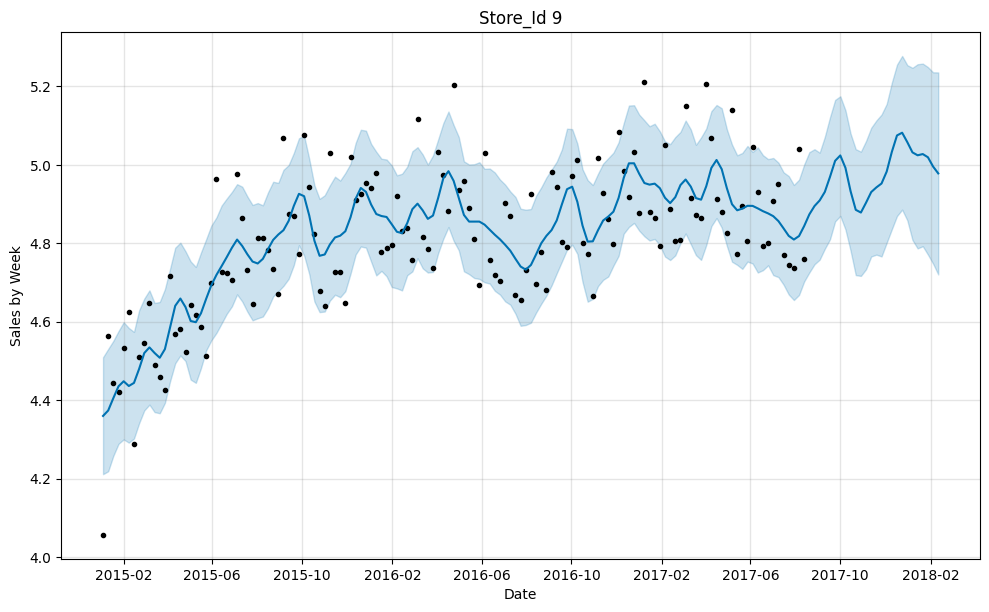

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/r9645fz3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/k_e9byv5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57888', 'data', 'file=/tmp/tmplthkugb_/r9645fz3.json', 'init=/tmp/tmplthkugb_/k_e9byv5.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelxb37v3i6/prophet_model-20241112131001.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:10:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


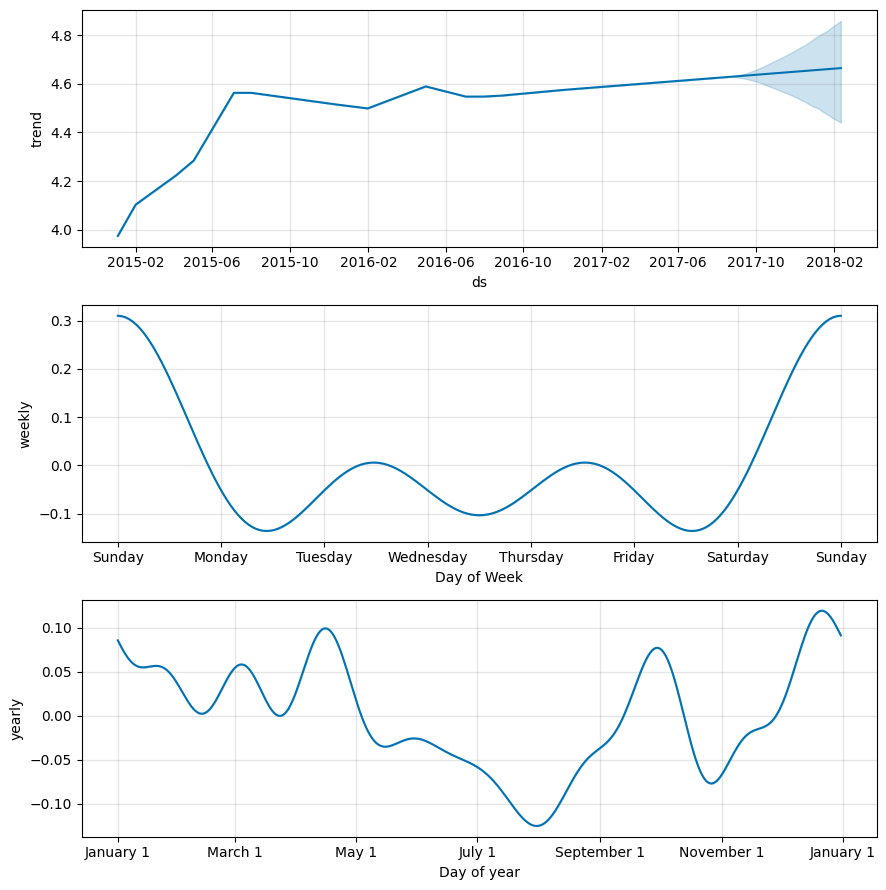

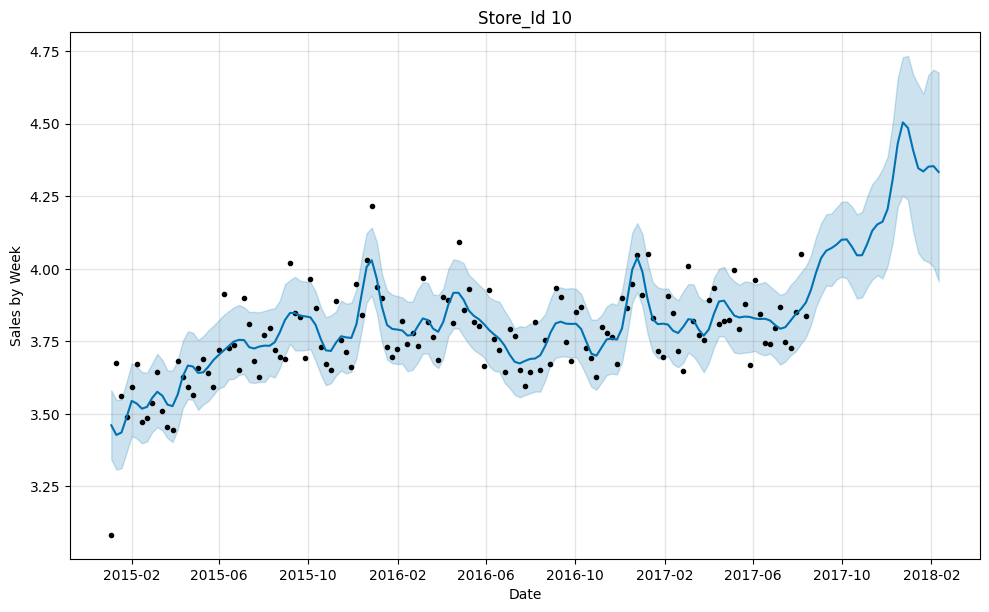

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/i500yjgy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/hwkq5xcb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98896', 'data', 'file=/tmp/tmplthkugb_/i500yjgy.json', 'init=/tmp/tmplthkugb_/hwkq5xcb.json', 'output', 'file=/tmp/tmplthkugb_/prophet_model0brvaifl/prophet_model-20241112131002.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:10:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00
df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


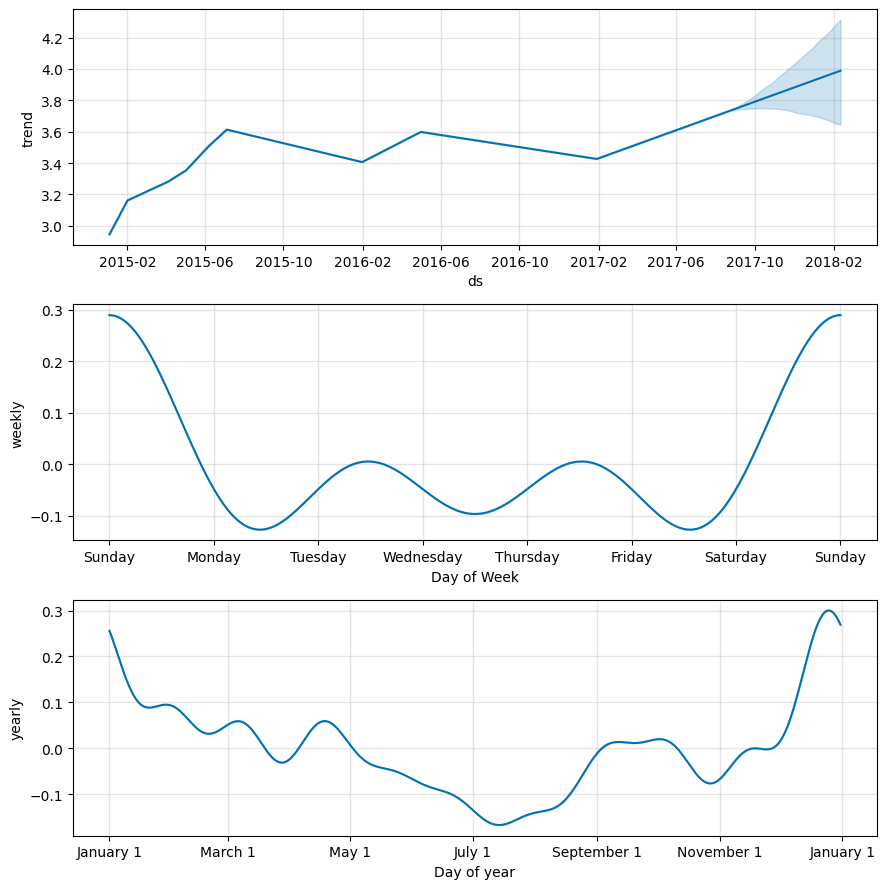

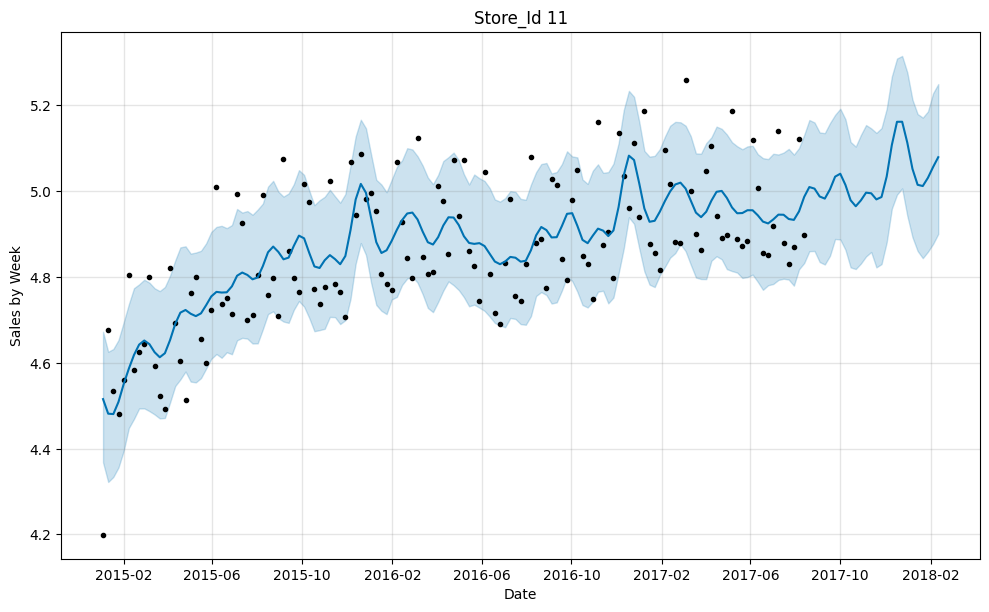

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/ikaaatxc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/x4q54q6e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68000', 'data', 'file=/tmp/tmplthkugb_/ikaaatxc.json', 'init=/tmp/tmplthkugb_/x4q54q6e.json', 'output', 'file=/tmp/tmplthkugb_/prophet_model48s95l7m/prophet_model-20241112131004.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:10:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00
df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


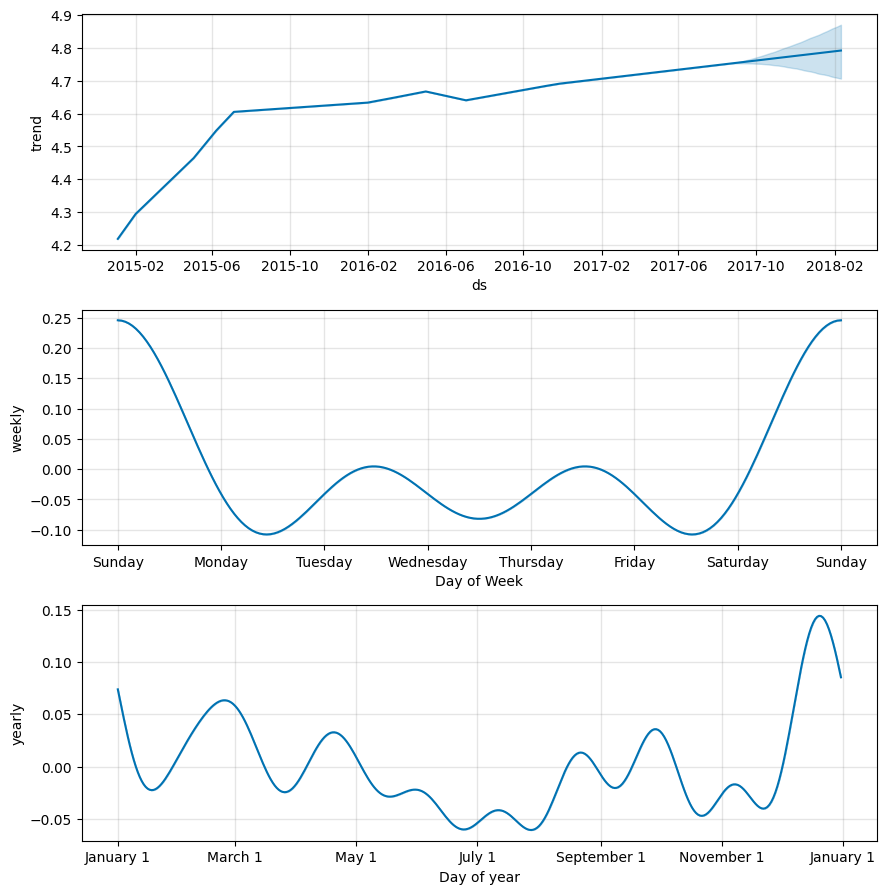

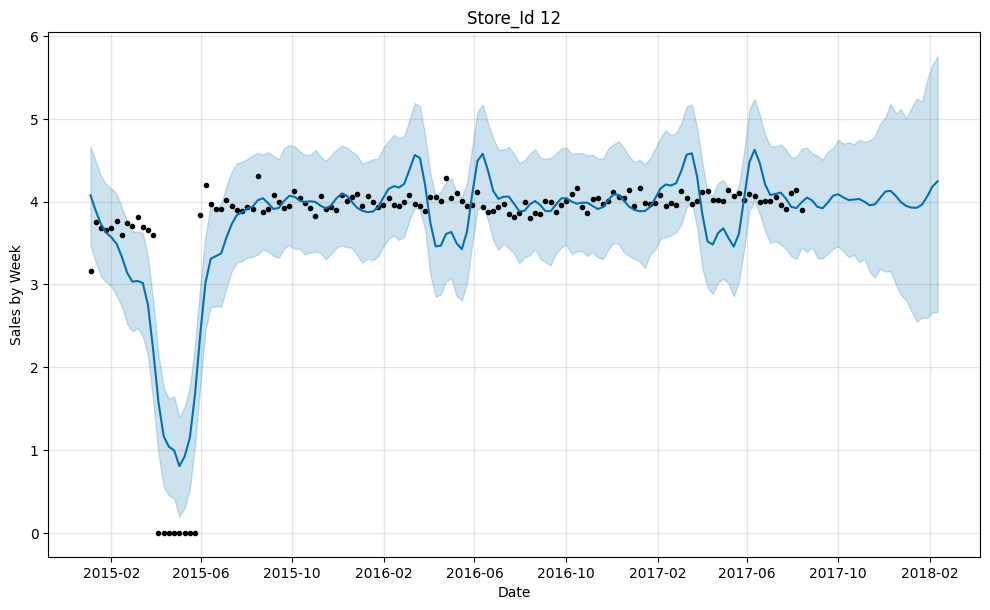

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/wk8f_vhb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/ypucffxv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95343', 'data', 'file=/tmp/tmplthkugb_/wk8f_vhb.json', 'init=/tmp/tmplthkugb_/ypucffxv.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelur6uuqaj/prophet_model-20241112131006.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:10:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


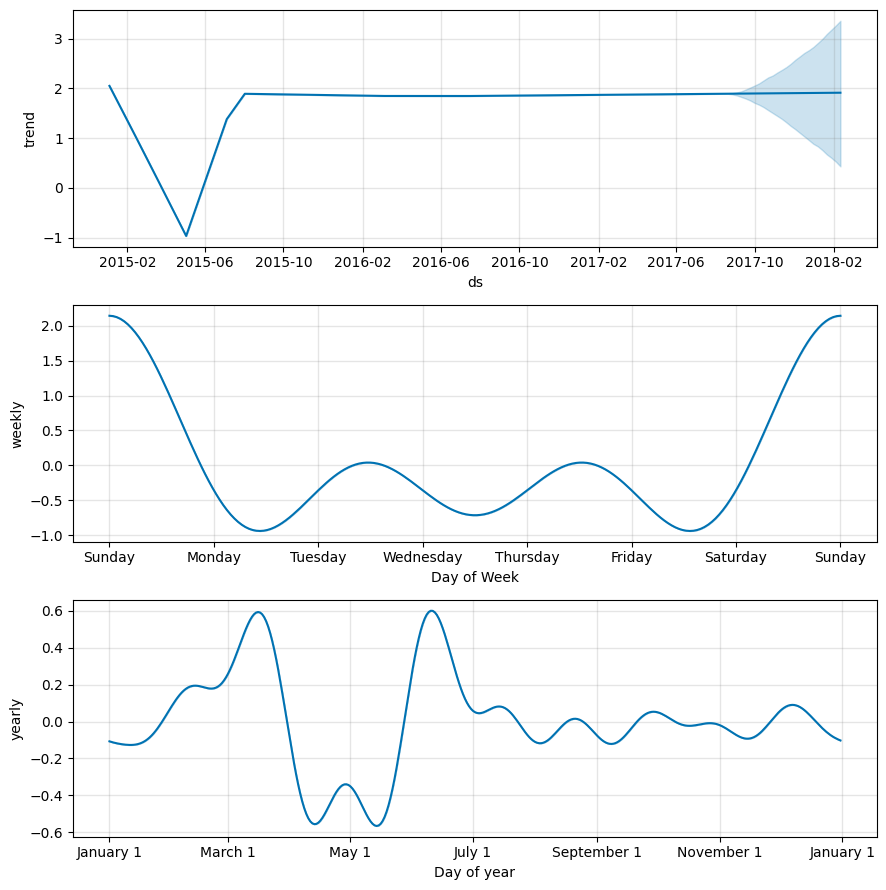

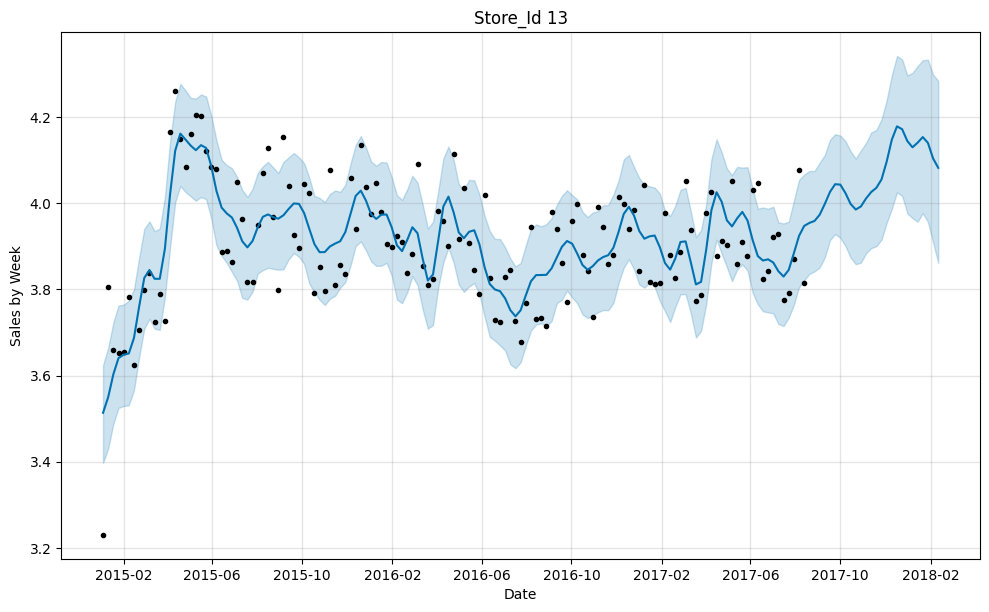

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/t_nh8q3j.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/7ek1q4hf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46261', 'data', 'file=/tmp/tmplthkugb_/t_nh8q3j.json', 'init=/tmp/tmplthkugb_/7ek1q4hf.json', 'output', 'file=/tmp/tmplthkugb_/prophet_model8gtgkjqo/prophet_model-20241112131008.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:10:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


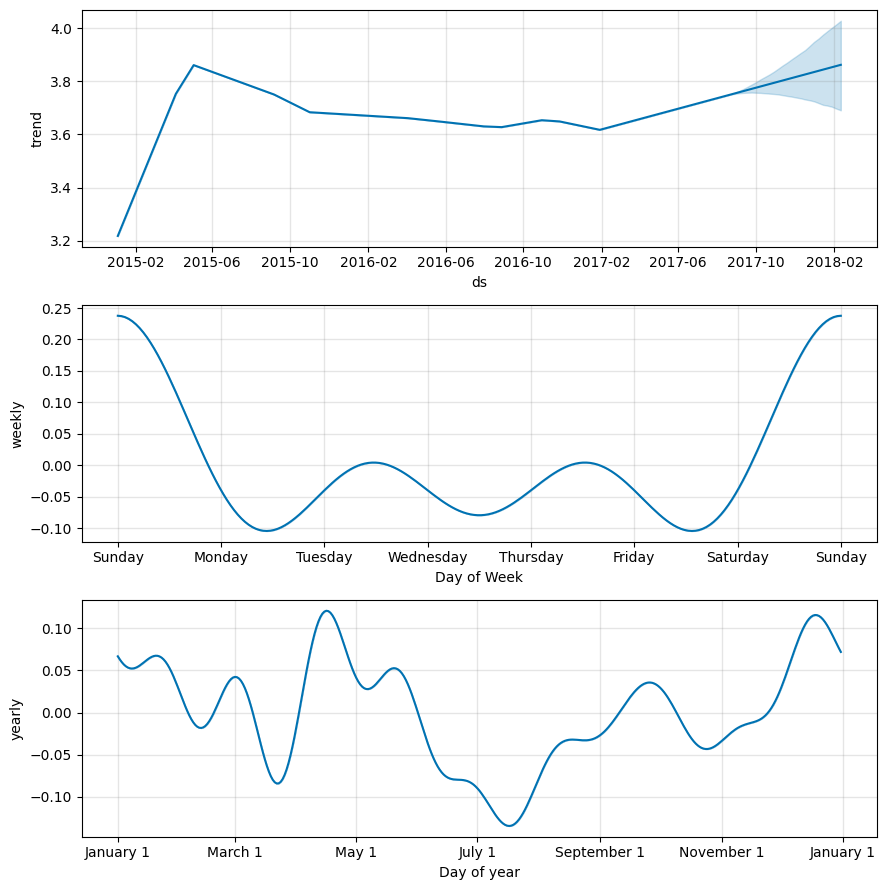

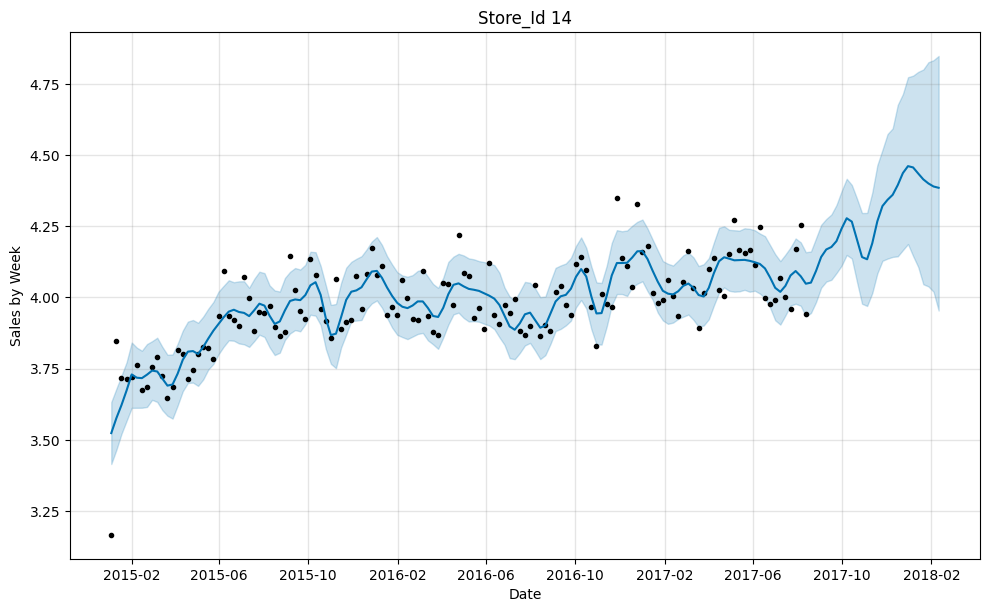

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/nyux7czx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/vwz1975f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80246', 'data', 'file=/tmp/tmplthkugb_/nyux7czx.json', 'init=/tmp/tmplthkugb_/vwz1975f.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelc2rd1wpb/prophet_model-20241112131010.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:10:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


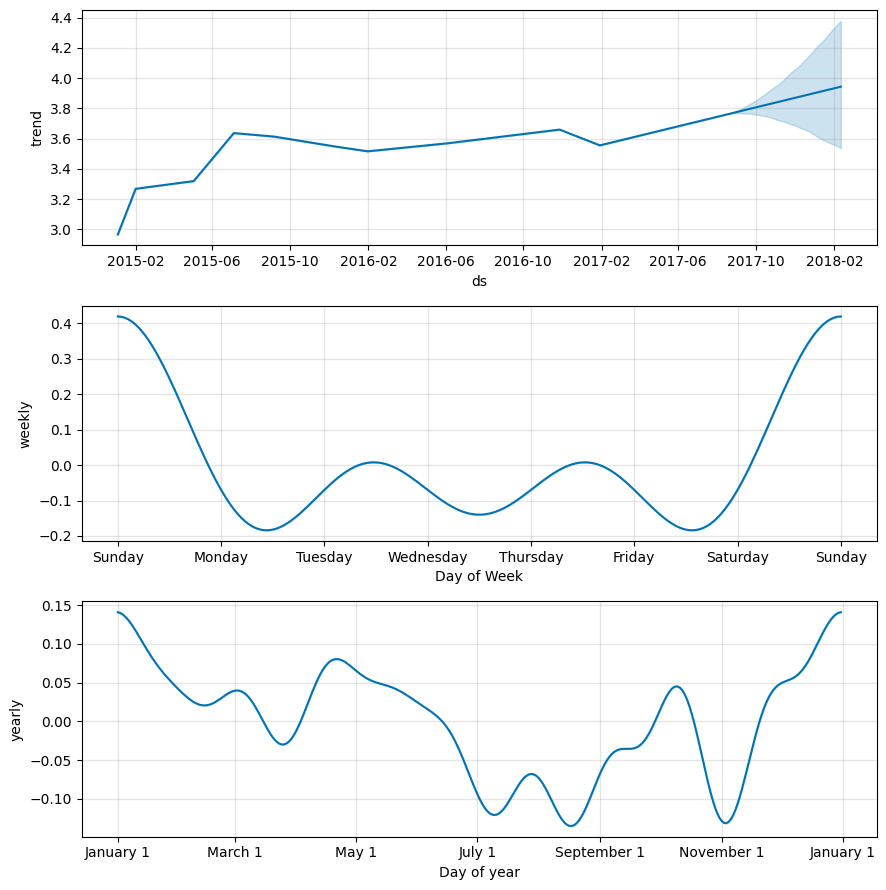

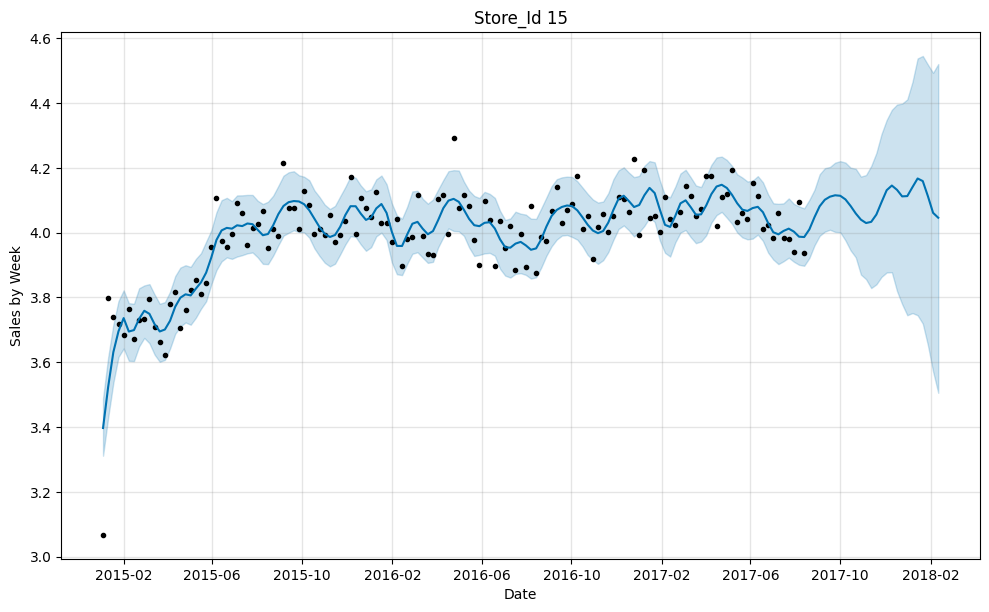

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/u1id7oy4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/2so4b9xs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84878', 'data', 'file=/tmp/tmplthkugb_/u1id7oy4.json', 'init=/tmp/tmplthkugb_/2so4b9xs.json', 'output', 'file=/tmp/tmplthkugb_/prophet_model18er4lc6/prophet_model-20241112131012.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:10:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


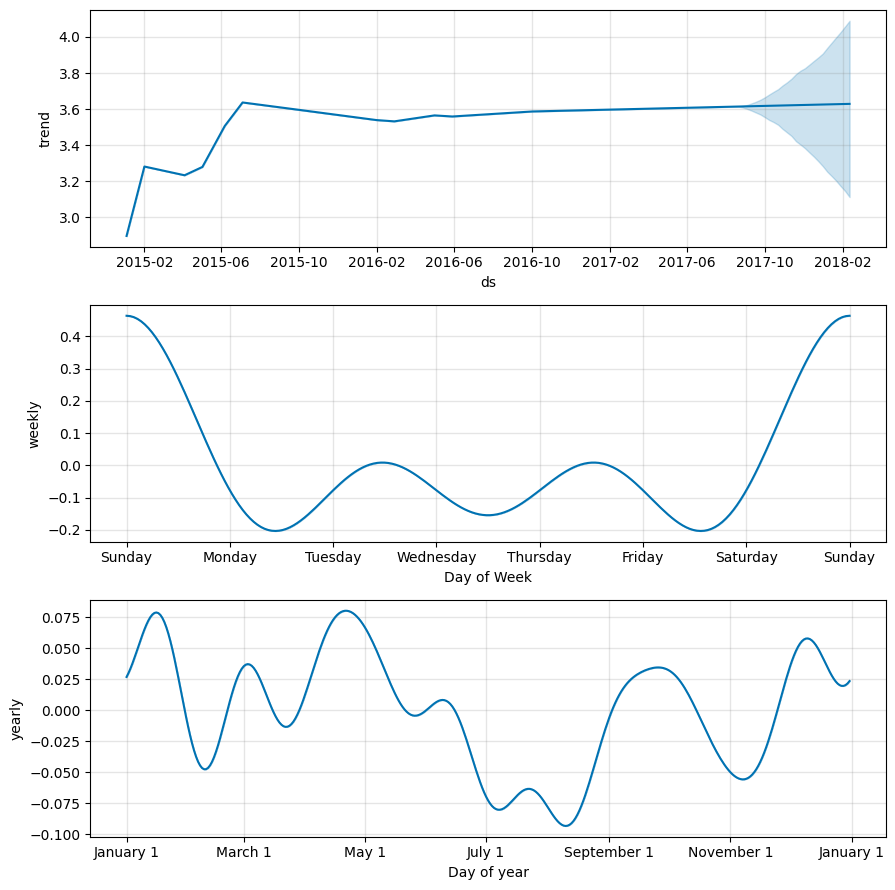

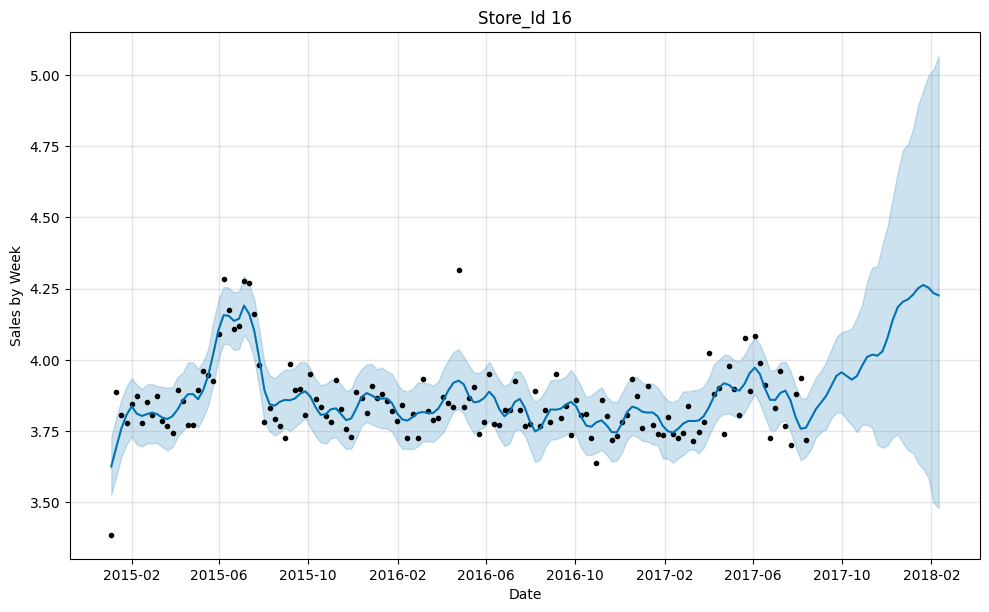

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/5u6sbrep.json


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/bc6qny0y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51488', 'data', 'file=/tmp/tmplthkugb_/5u6sbrep.json', 'init=/tmp/tmplthkugb_/bc6qny0y.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelje2s6c9j/prophet_model-20241112131014.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:10:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


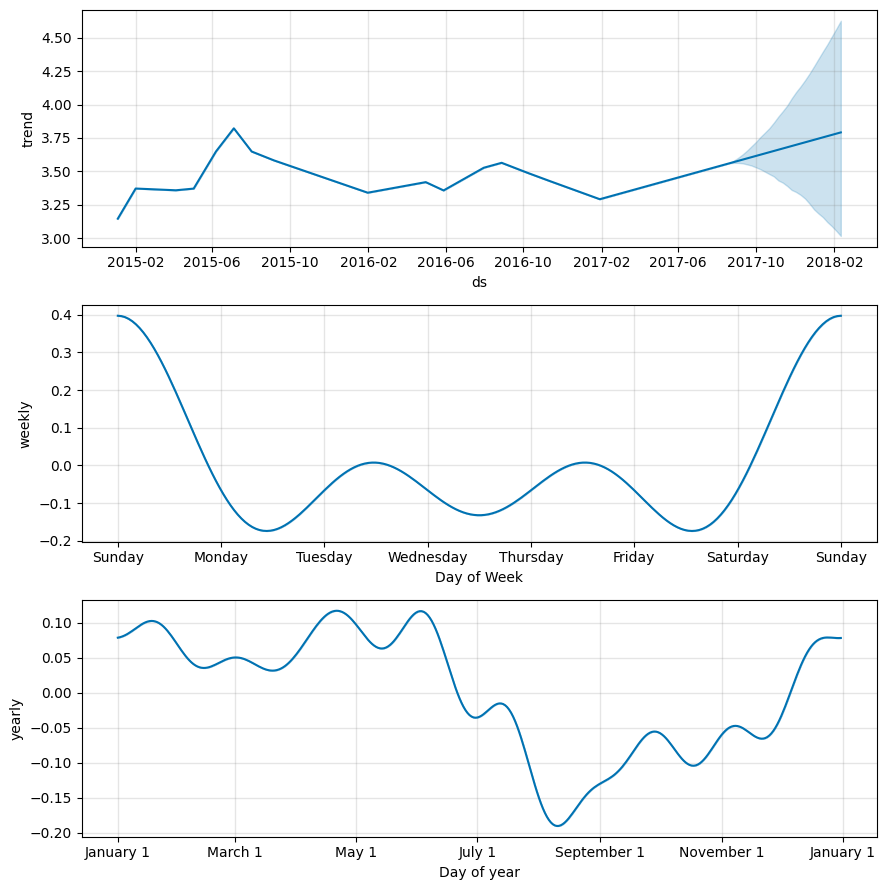

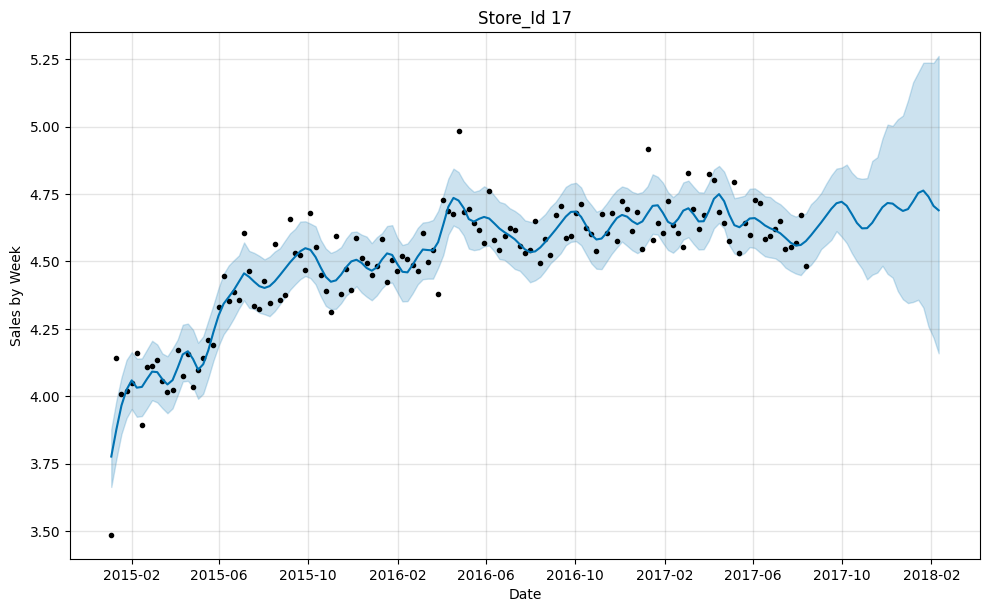

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/jkuyze2g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/m4256_u5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22485', 'data', 'file=/tmp/tmplthkugb_/jkuyze2g.json', 'init=/tmp/tmplthkugb_/m4256_u5.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelu46mn7b5/prophet_model-20241112131015.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:10:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00
df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


<ipython-input-62-ee8dec01fb38>:48: RuntimeWarning: divide by zero encountered in scalar divide
  growth_projected = ((last_forecast_period - last_current_period) / last_current_period) * 100


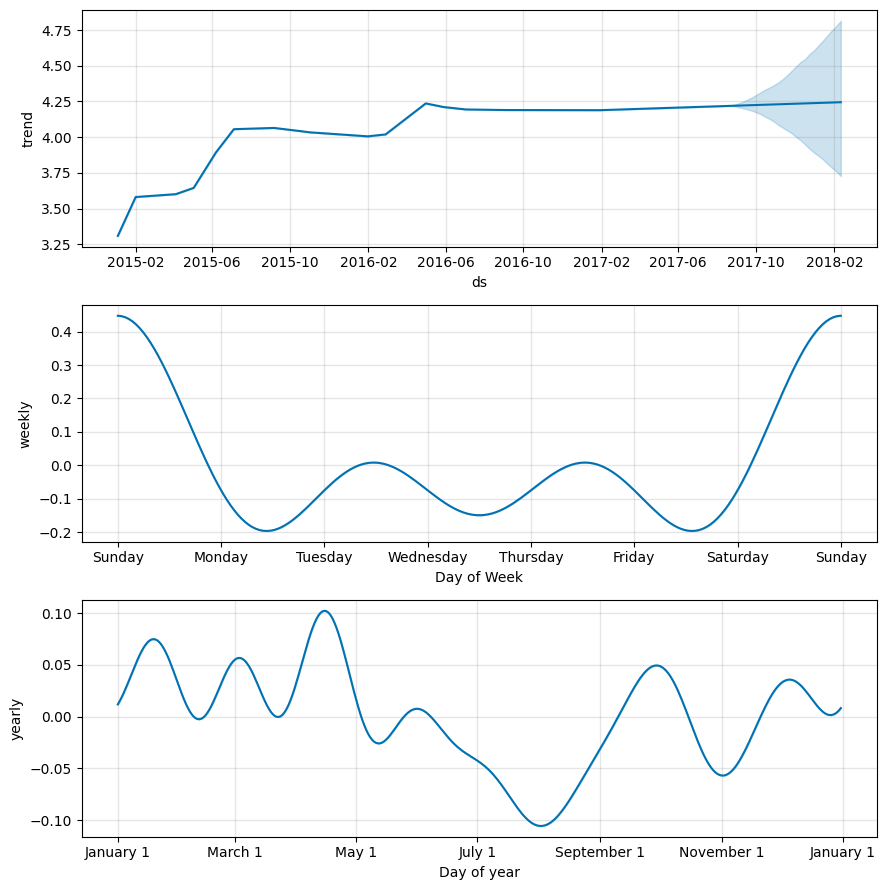

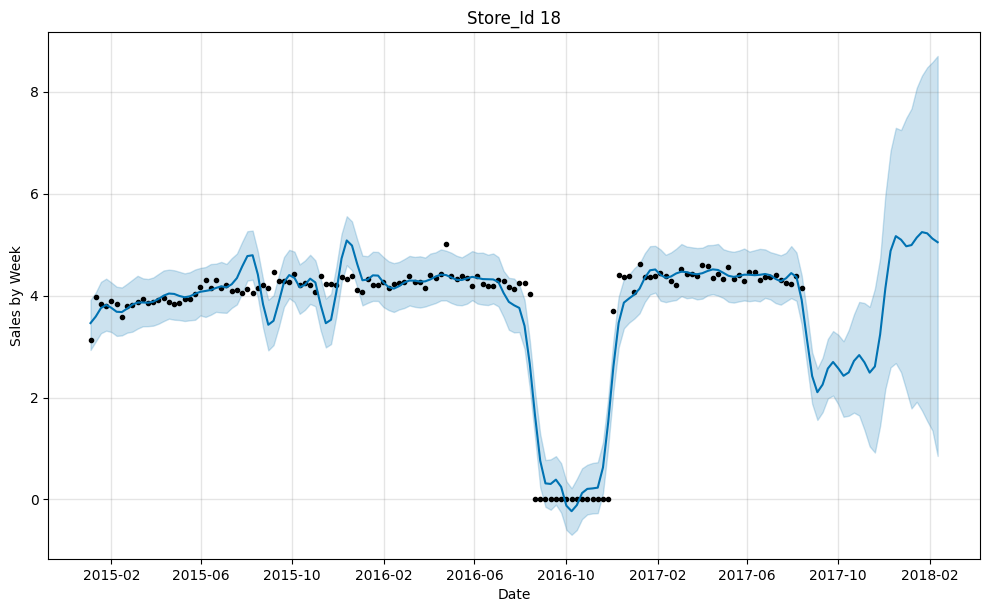

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/67dt3tjn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/i1x7cy37.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97502', 'data', 'file=/tmp/tmplthkugb_/67dt3tjn.json', 'init=/tmp/tmplthkugb_/i1x7cy37.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modely95s52gk/prophet_model-20241112131017.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:10:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


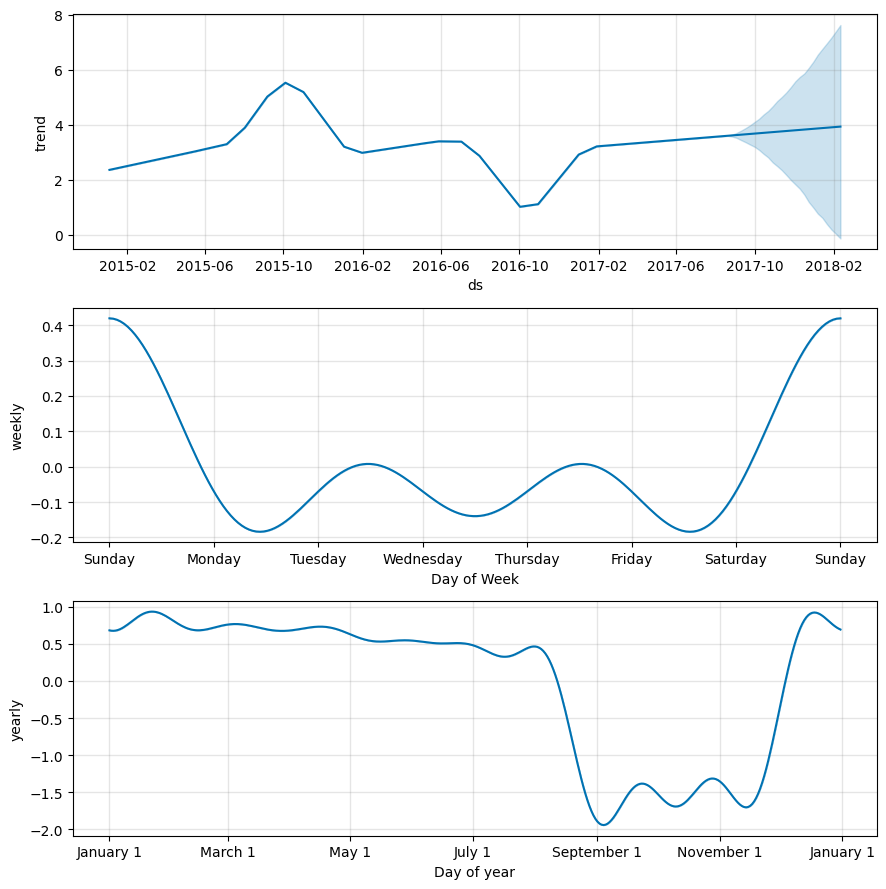

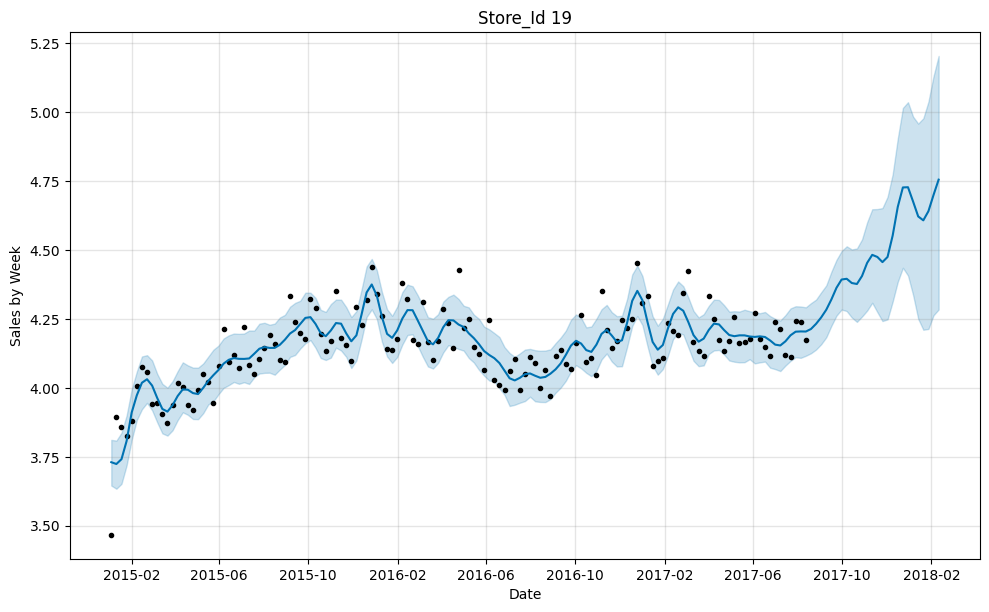

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/1uv4vitt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/pqchrjje.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57116', 'data', 'file=/tmp/tmplthkugb_/1uv4vitt.json', 'init=/tmp/tmplthkugb_/pqchrjje.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelxhw4cc8u/prophet_model-20241112131019.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:10:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


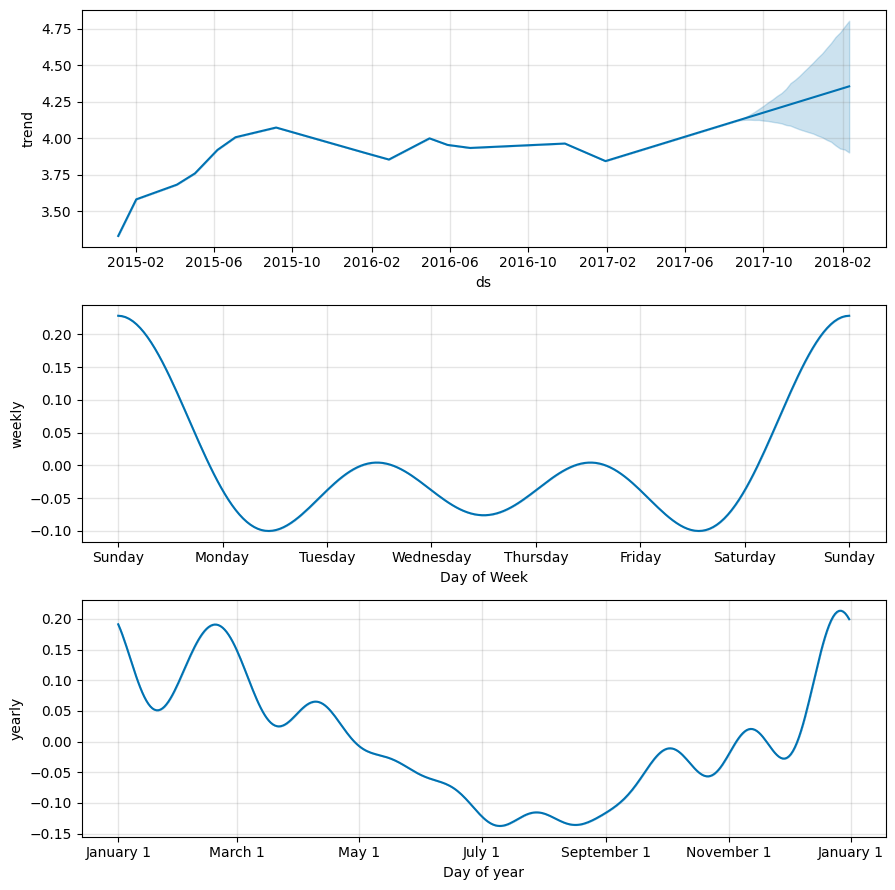

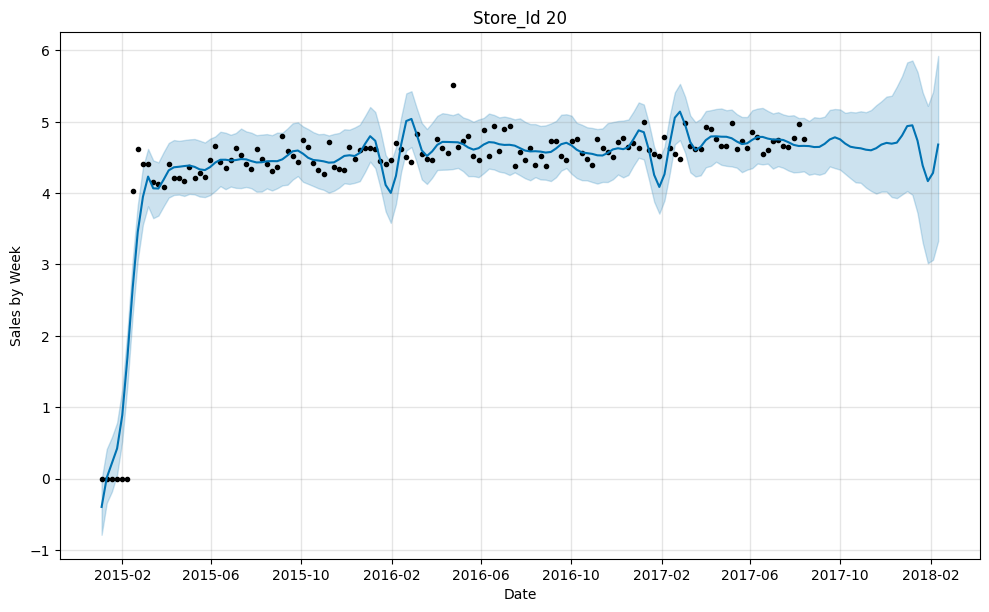

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/1ybp4eob.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/lv10zoh9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86169', 'data', 'file=/tmp/tmplthkugb_/1ybp4eob.json', 'init=/tmp/tmplthkugb_/lv10zoh9.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelh33it6n_/prophet_model-20241112131020.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:10:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


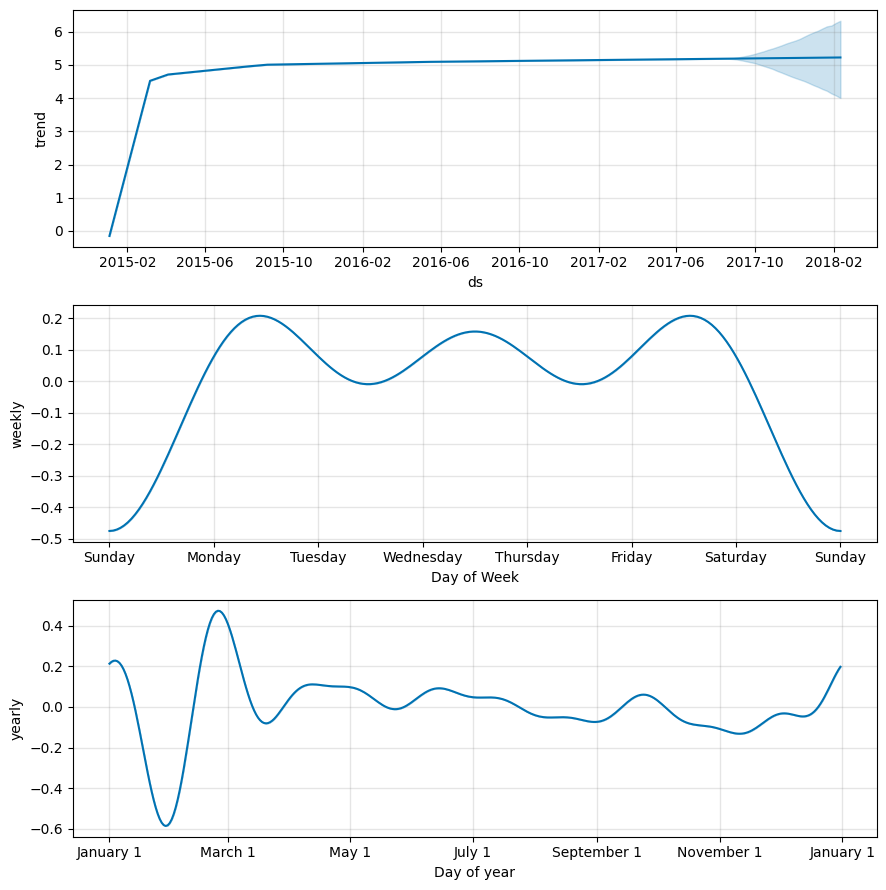

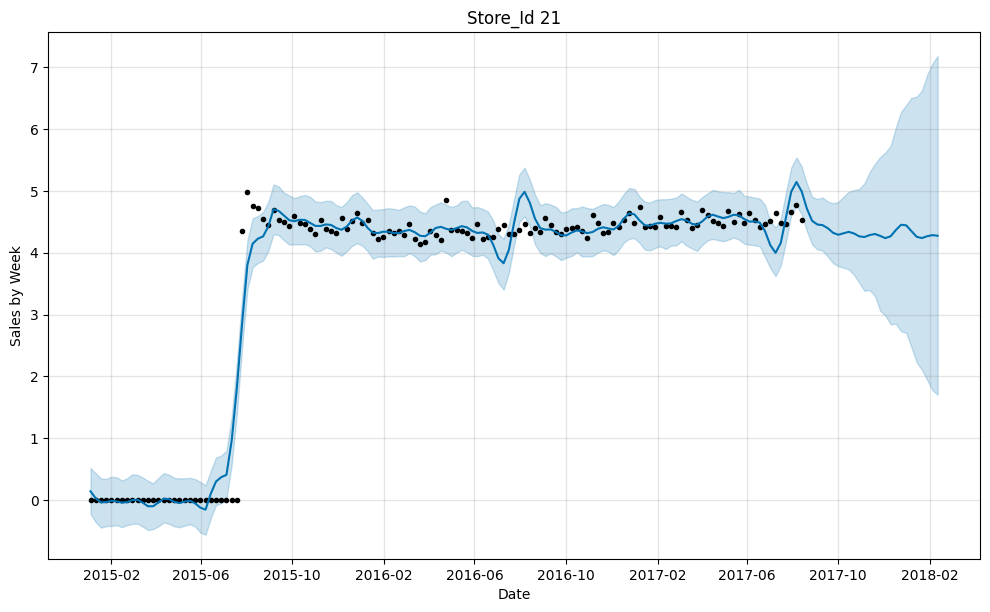

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/p6ft3nn5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/5pvetcg4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26947', 'data', 'file=/tmp/tmplthkugb_/p6ft3nn5.json', 'init=/tmp/tmplthkugb_/5pvetcg4.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelbrt4y8ur/prophet_model-20241112131023.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:10:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00
df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


<ipython-input-62-ee8dec01fb38>:48: RuntimeWarning: divide by zero encountered in scalar divide
  growth_projected = ((last_forecast_period - last_current_period) / last_current_period) * 100


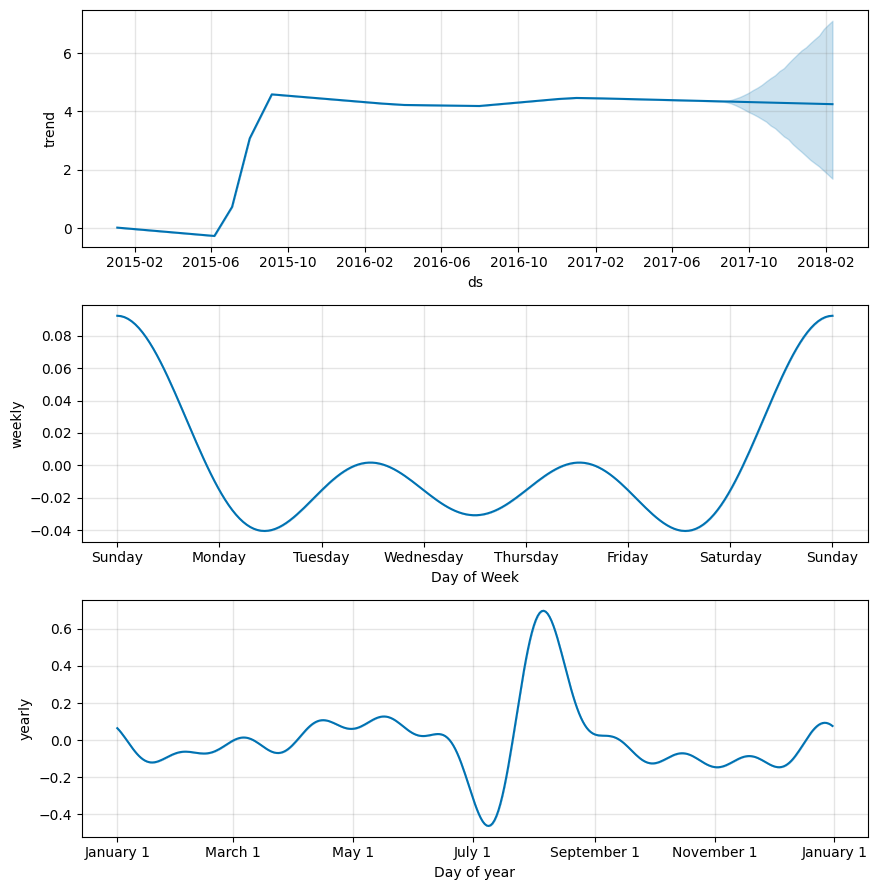

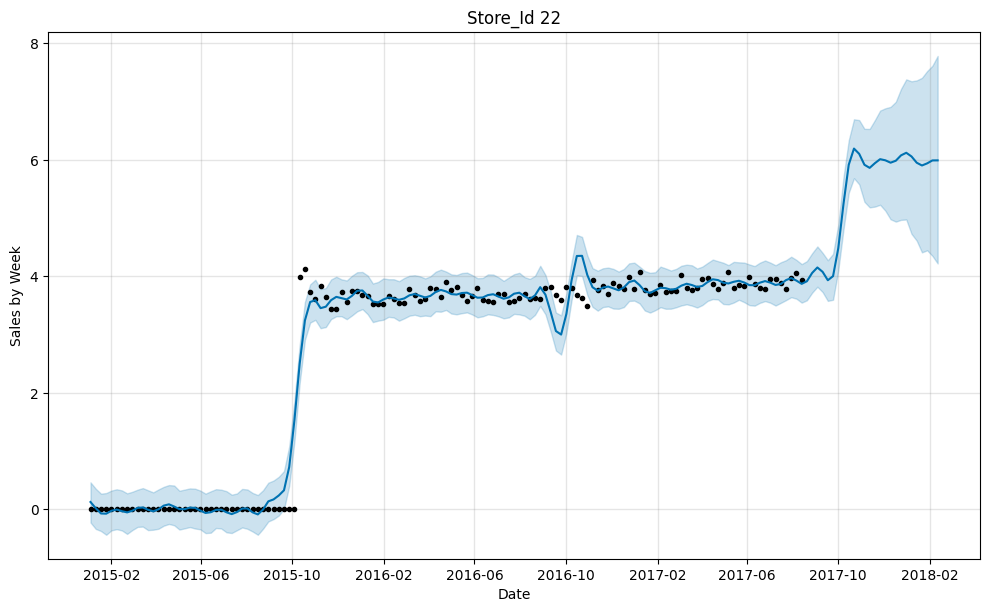

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/fibcy86s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/amqlafv9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3423', 'data', 'file=/tmp/tmplthkugb_/fibcy86s.json', 'init=/tmp/tmplthkugb_/amqlafv9.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelehz4m5g_/prophet_model-20241112131025.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:10:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


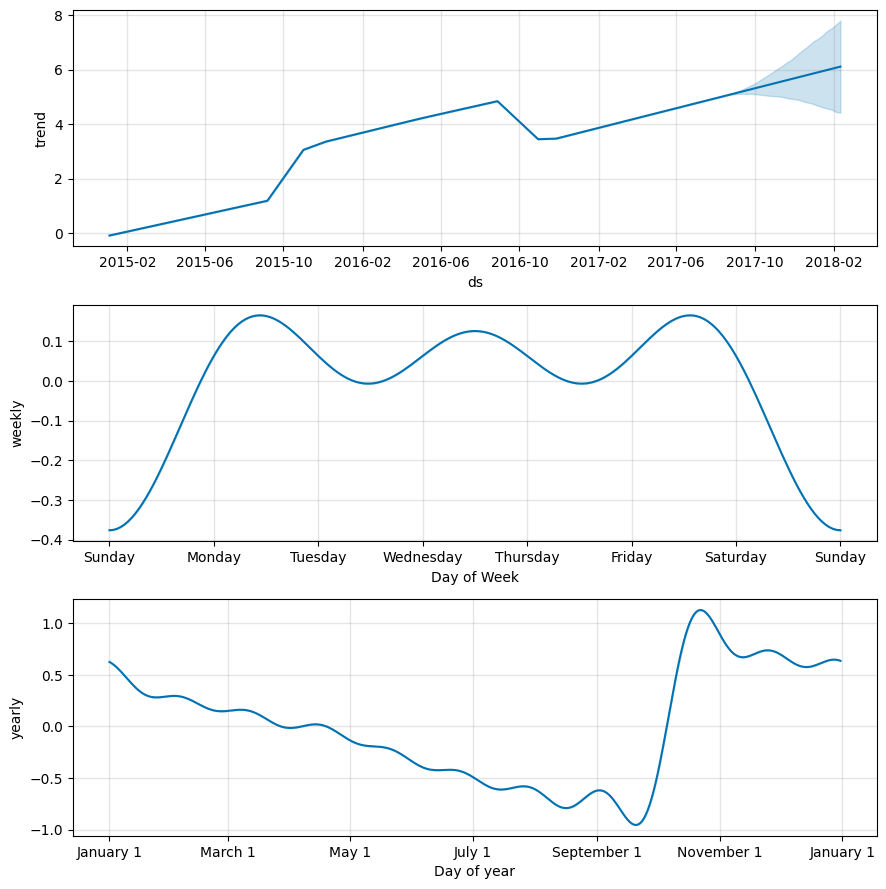

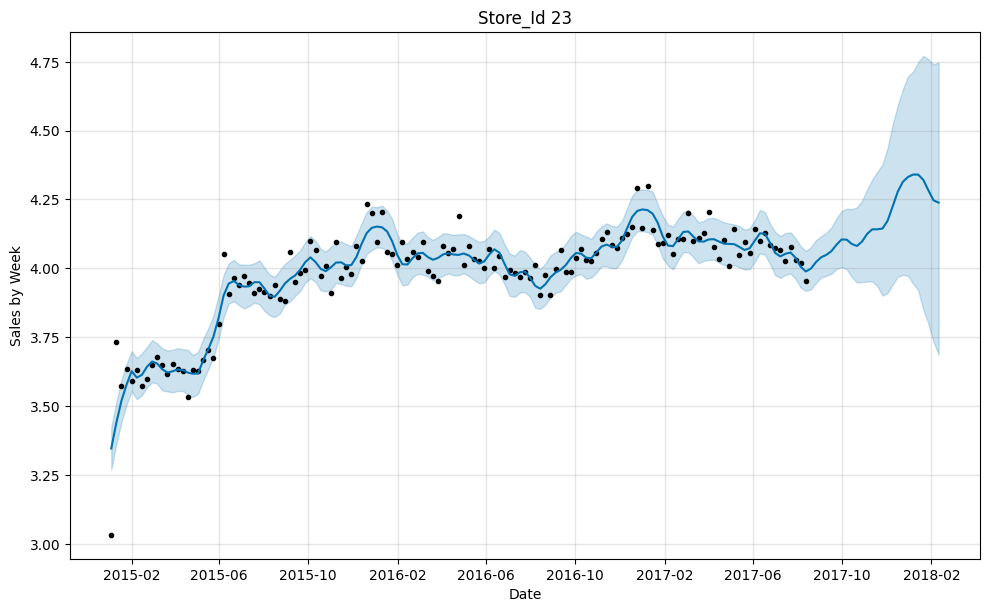

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/cawe212l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/nppe1_3j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9735', 'data', 'file=/tmp/tmplthkugb_/cawe212l.json', 'init=/tmp/tmplthkugb_/nppe1_3j.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelayygxrkr/prophet_model-20241112131027.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:10:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


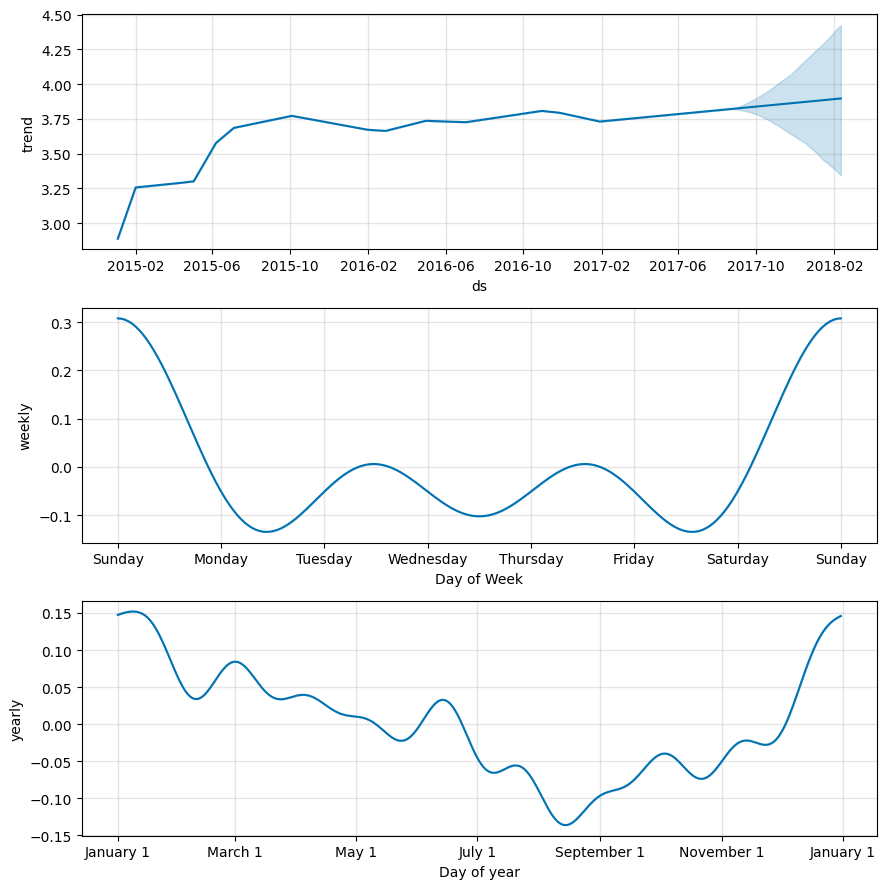

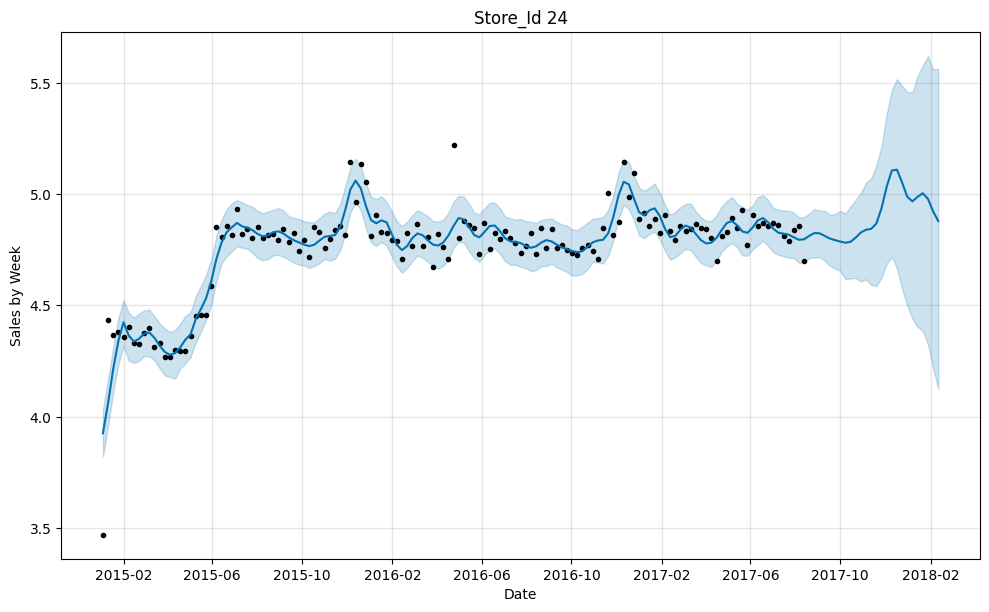

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/x9gqu90h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/7t8bvafa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32896', 'data', 'file=/tmp/tmplthkugb_/x9gqu90h.json', 'init=/tmp/tmplthkugb_/7t8bvafa.json', 'output', 'file=/tmp/tmplthkugb_/prophet_model0ylwojr9/prophet_model-20241112131029.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:10:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00
df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


<ipython-input-62-ee8dec01fb38>:48: RuntimeWarning: divide by zero encountered in scalar divide
  growth_projected = ((last_forecast_period - last_current_period) / last_current_period) * 100


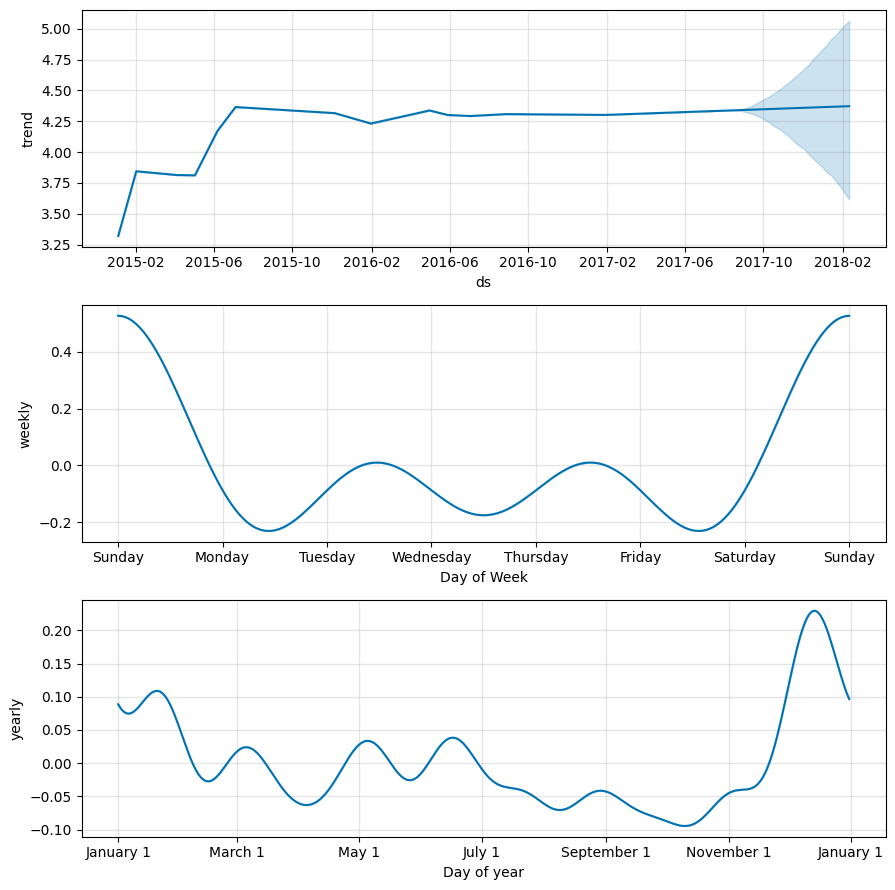

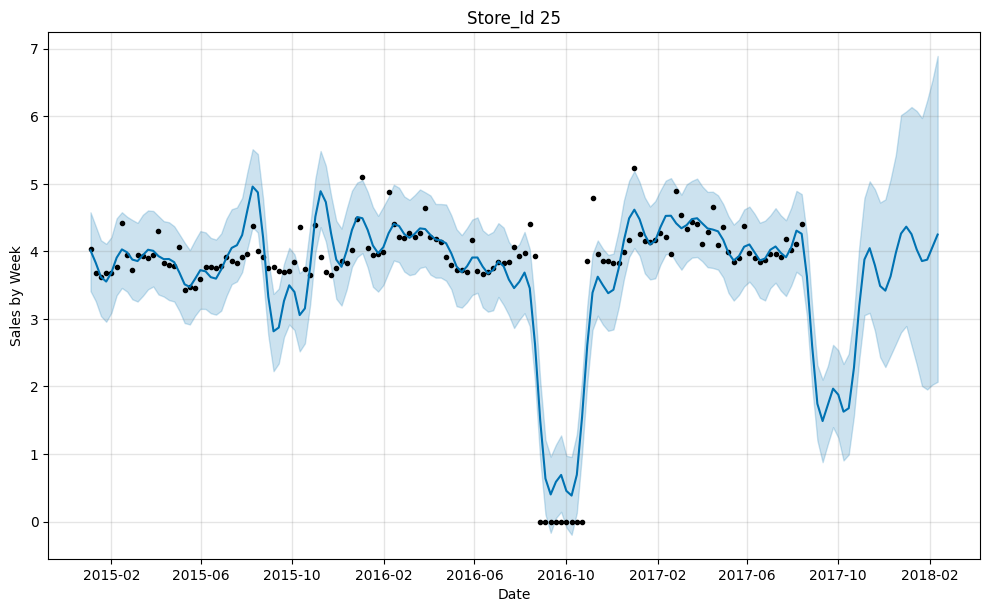

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/flrrgo7u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/0gzmq4q_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35765', 'data', 'file=/tmp/tmplthkugb_/flrrgo7u.json', 'init=/tmp/tmplthkugb_/0gzmq4q_.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelq2lkb7pg/prophet_model-20241112131033.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:10:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


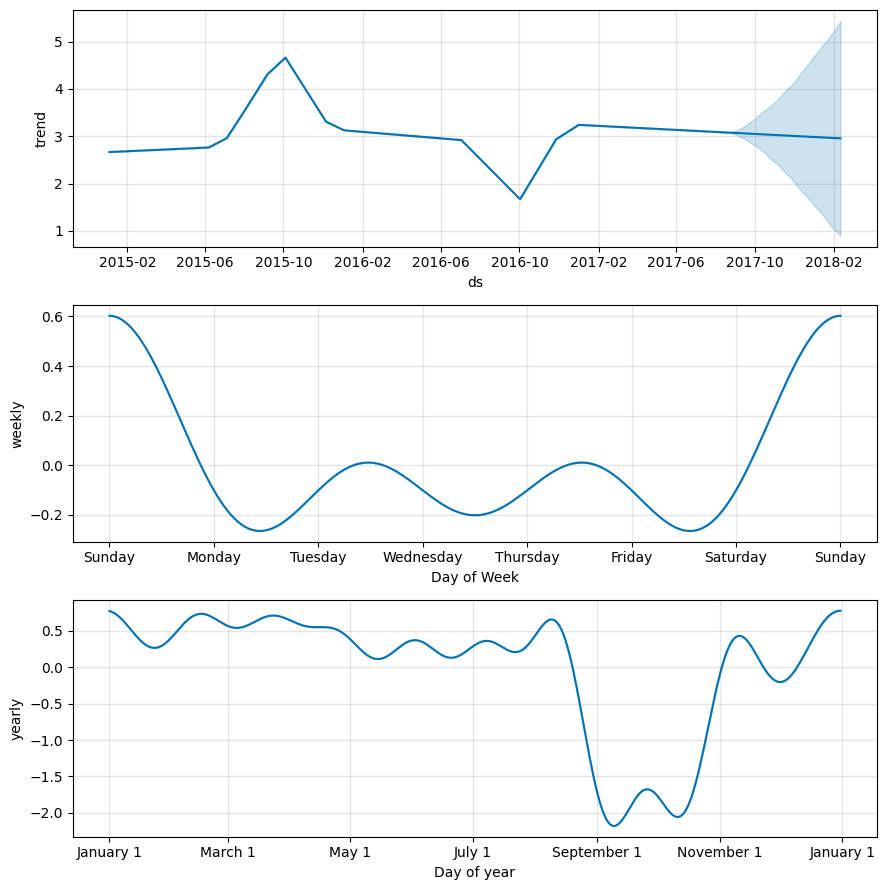

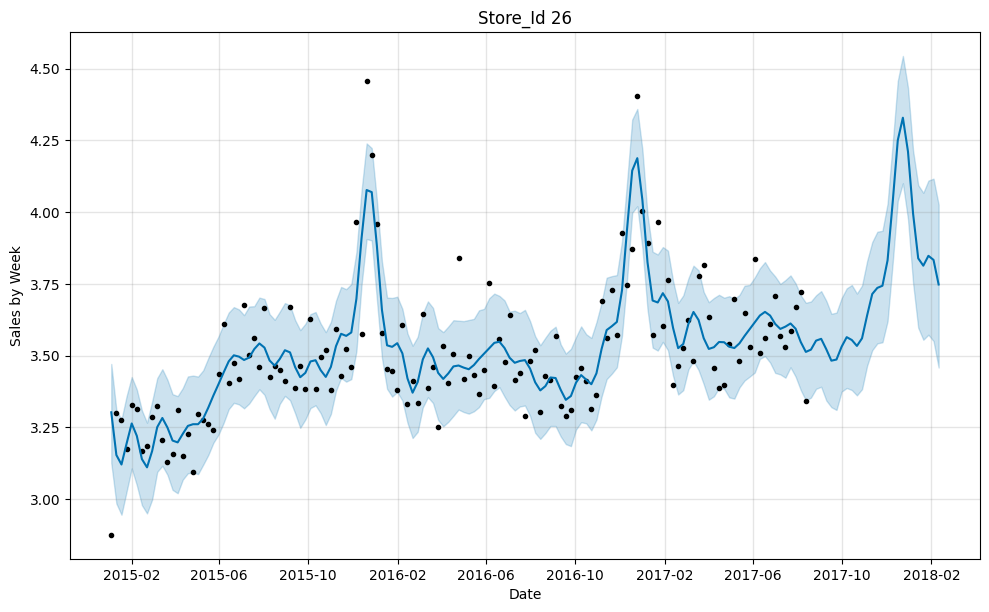

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/a64i7sl_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/sll3vcia.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37671', 'data', 'file=/tmp/tmplthkugb_/a64i7sl_.json', 'init=/tmp/tmplthkugb_/sll3vcia.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modeljuy8ba82/prophet_model-20241112131035.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:10:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


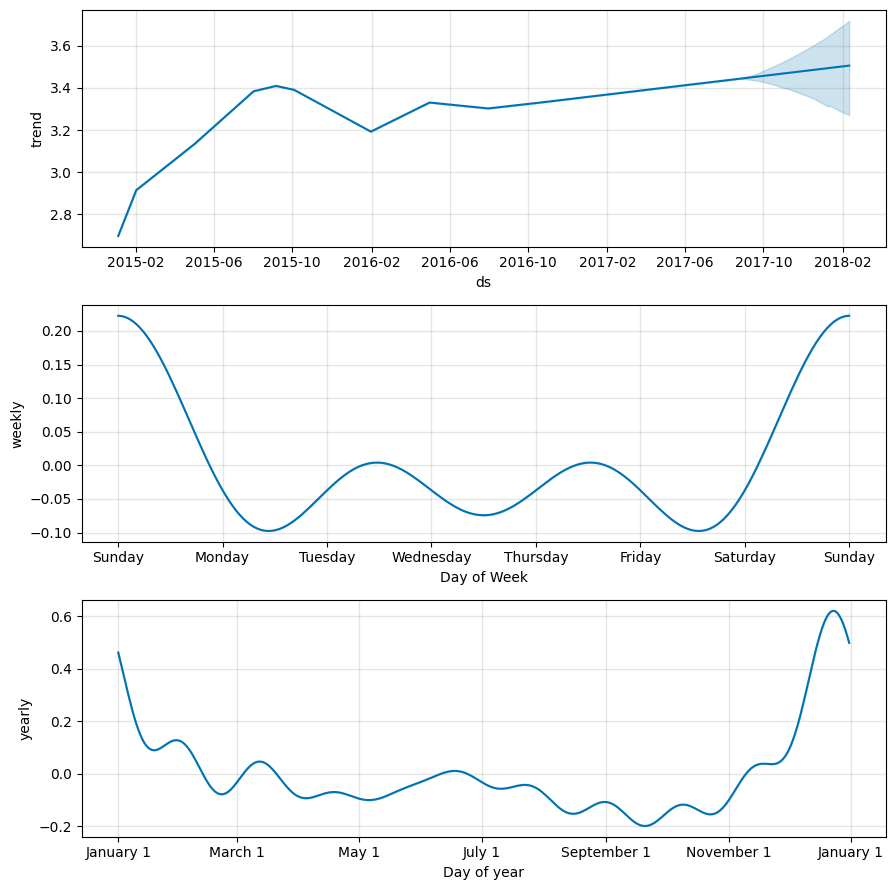

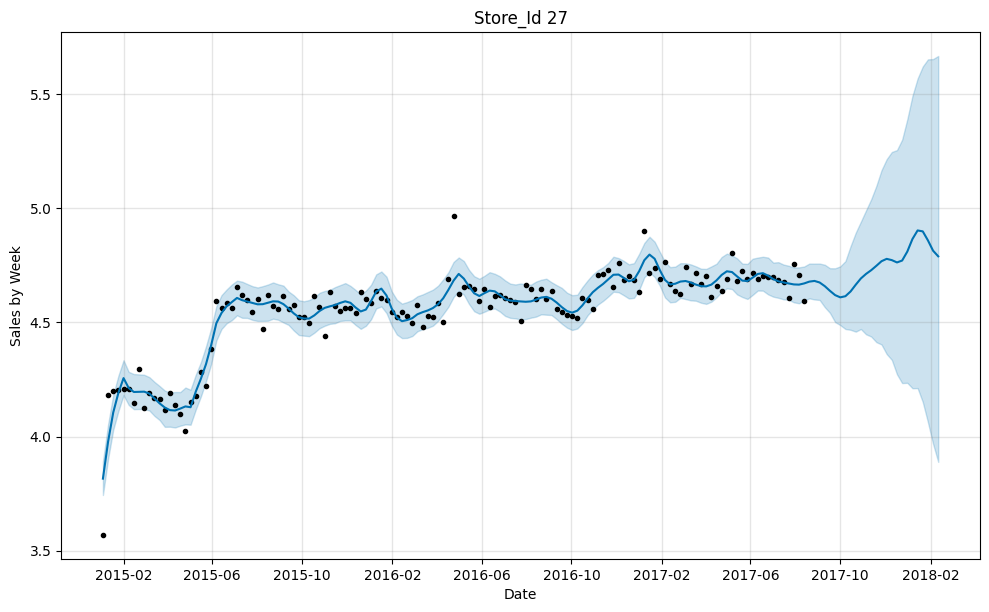

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/7_m0ey8k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/iy2cu27w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70210', 'data', 'file=/tmp/tmplthkugb_/7_m0ey8k.json', 'init=/tmp/tmplthkugb_/iy2cu27w.json', 'output', 'file=/tmp/tmplthkugb_/prophet_model92_s3fh2/prophet_model-20241112131037.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:10:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


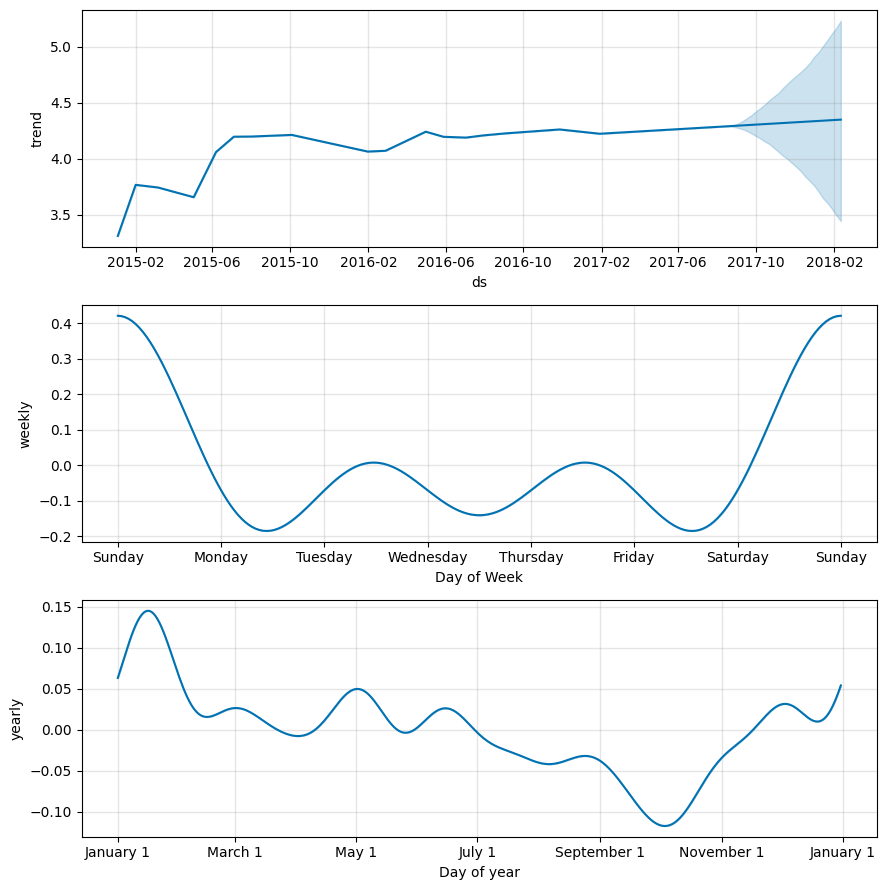

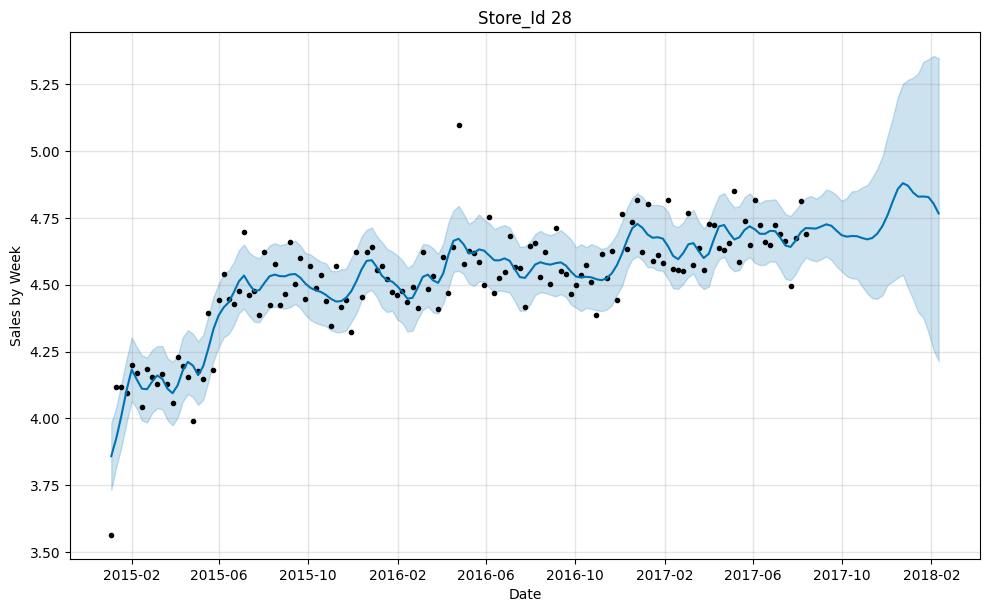

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/thjp3fxo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/9zrz46wx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35946', 'data', 'file=/tmp/tmplthkugb_/thjp3fxo.json', 'init=/tmp/tmplthkugb_/9zrz46wx.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelmzjd5fh0/prophet_model-20241112131041.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:10:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


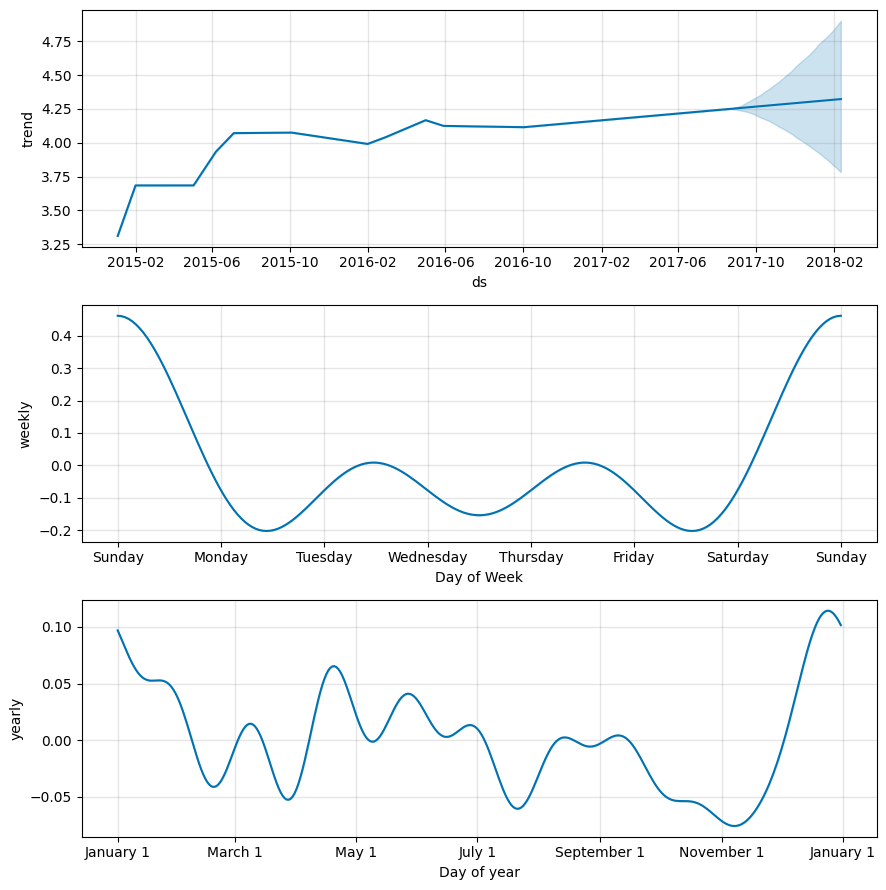

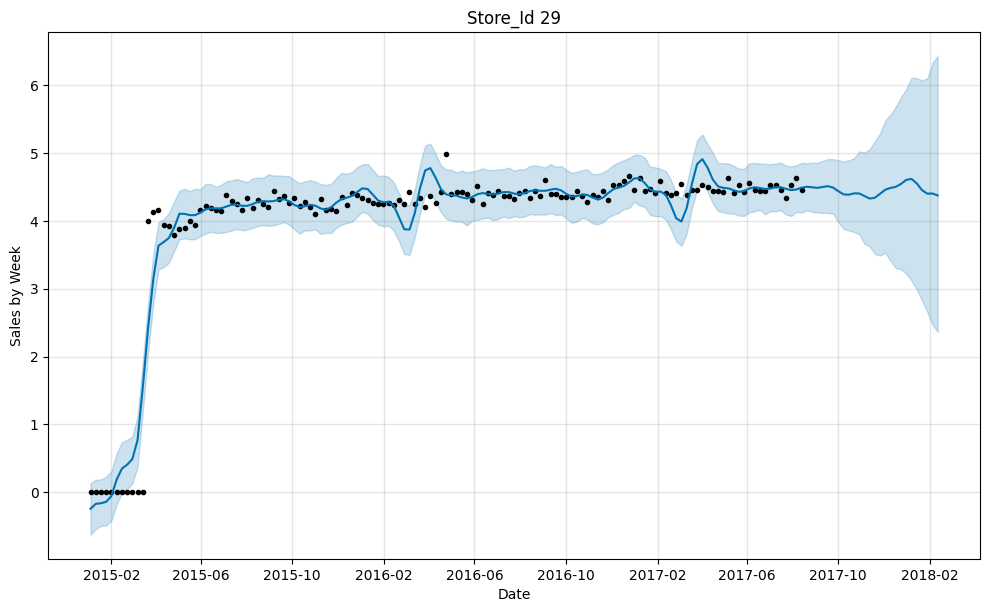

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/ldjjt7fr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/9e1ydek2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46225', 'data', 'file=/tmp/tmplthkugb_/ldjjt7fr.json', 'init=/tmp/tmplthkugb_/9e1ydek2.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelf8c2ed95/prophet_model-20241112131043.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:10:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


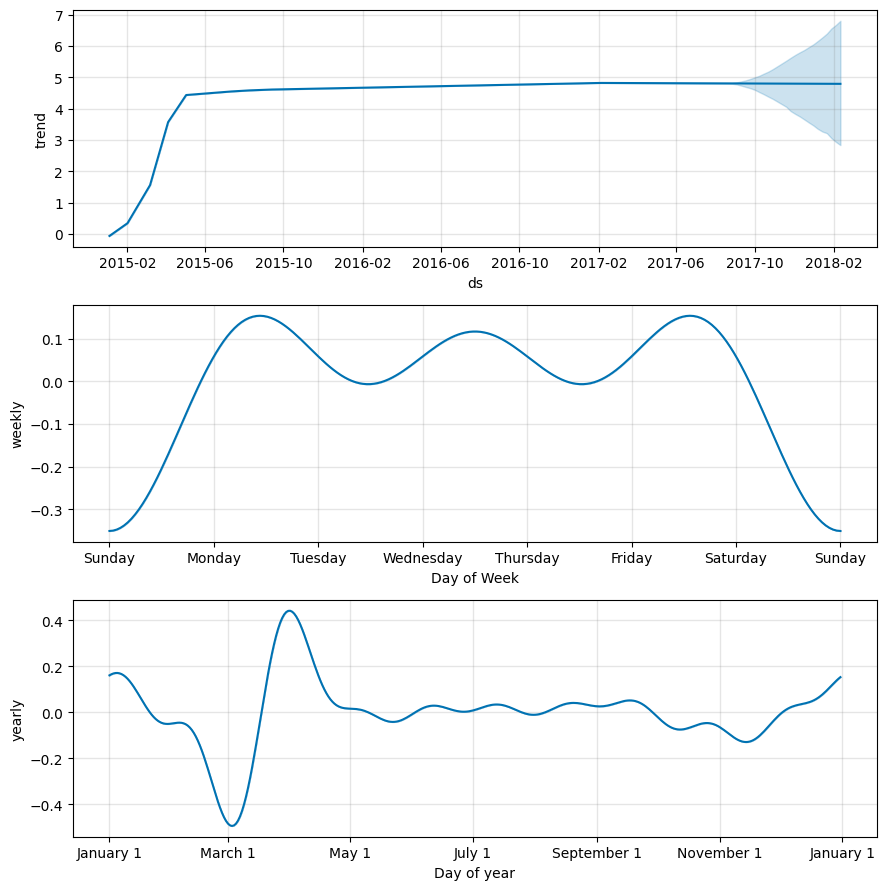

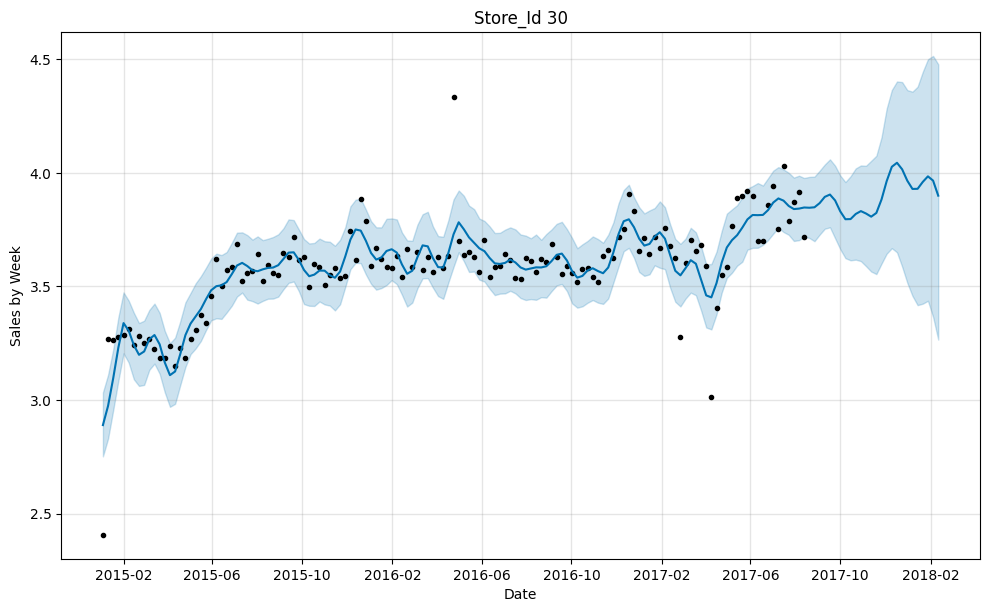

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/jdl23cgn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/v6gs2aes.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28445', 'data', 'file=/tmp/tmplthkugb_/jdl23cgn.json', 'init=/tmp/tmplthkugb_/v6gs2aes.json', 'output', 'file=/tmp/tmplthkugb_/prophet_model1zn10gq3/prophet_model-20241112131045.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:10:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


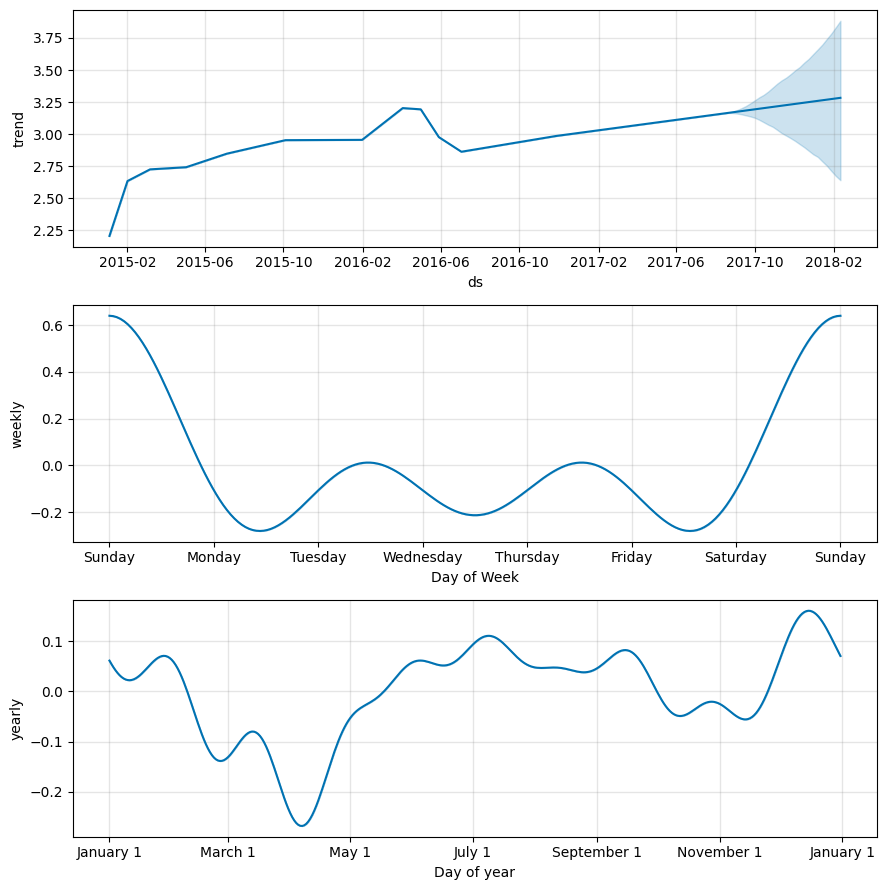

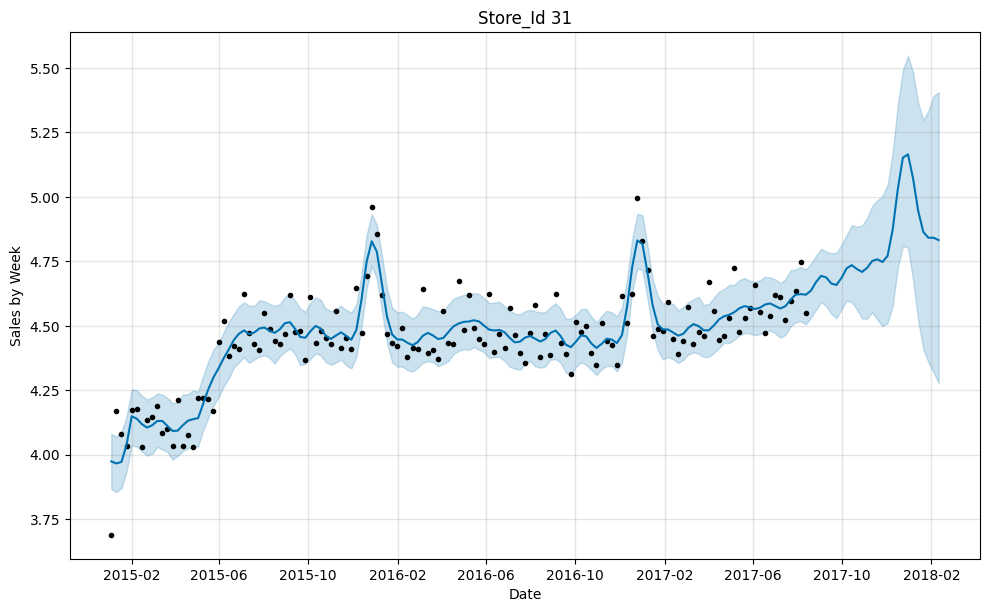

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/yig537jp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/ijstk7ui.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95776', 'data', 'file=/tmp/tmplthkugb_/yig537jp.json', 'init=/tmp/tmplthkugb_/ijstk7ui.json', 'output', 'file=/tmp/tmplthkugb_/prophet_model5h5l6r2f/prophet_model-20241112131047.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:10:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


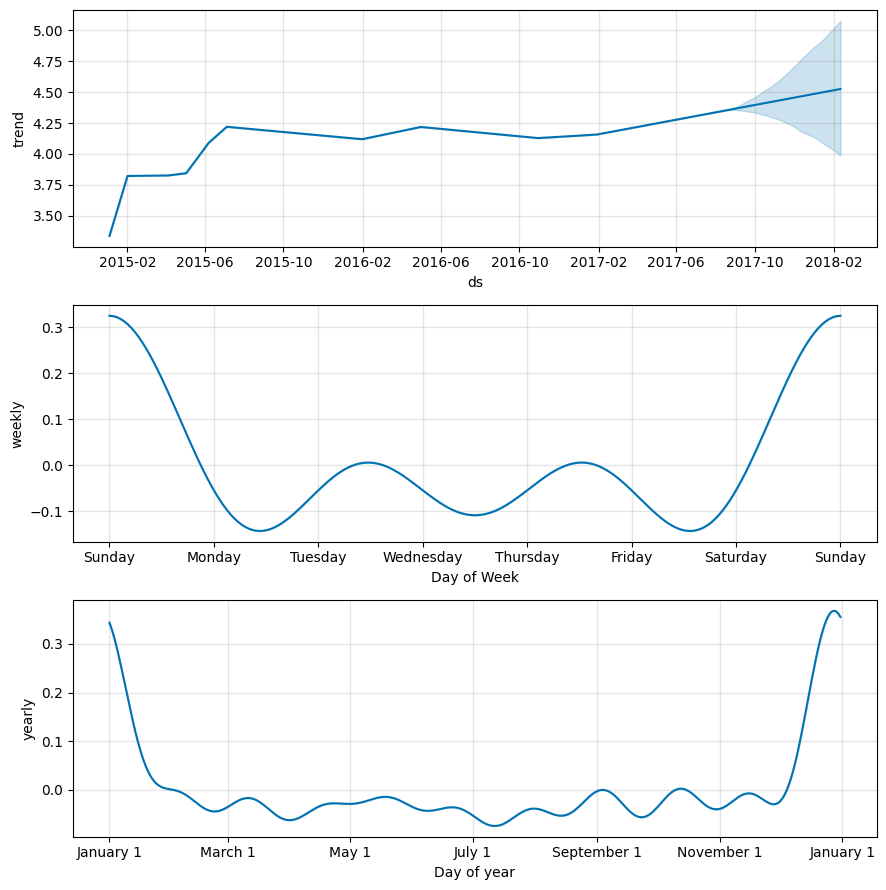

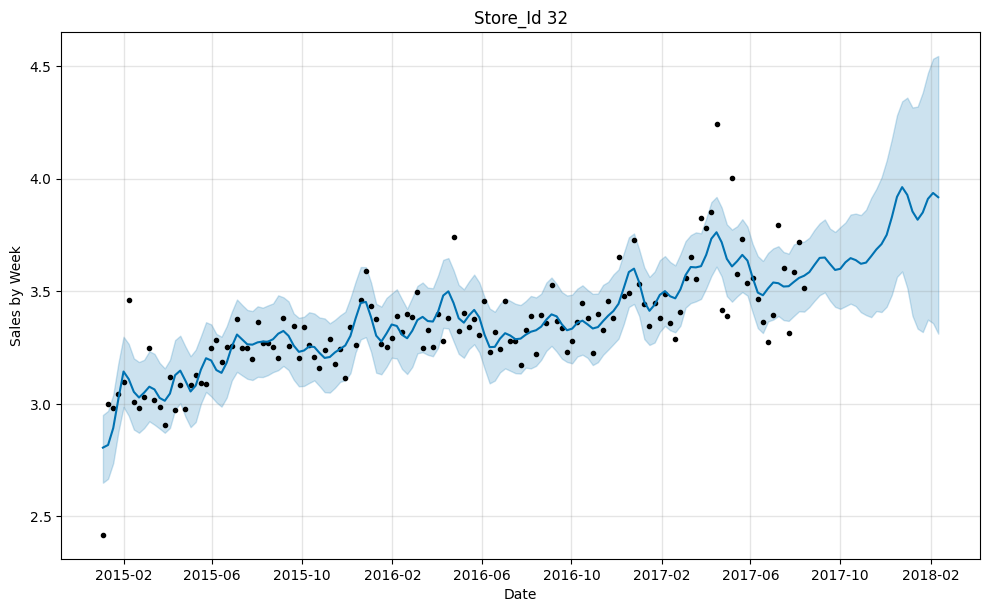

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/34tg9ctb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/om_dz3zd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7062', 'data', 'file=/tmp/tmplthkugb_/34tg9ctb.json', 'init=/tmp/tmplthkugb_/om_dz3zd.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modell1bd4do0/prophet_model-20241112131050.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:10:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


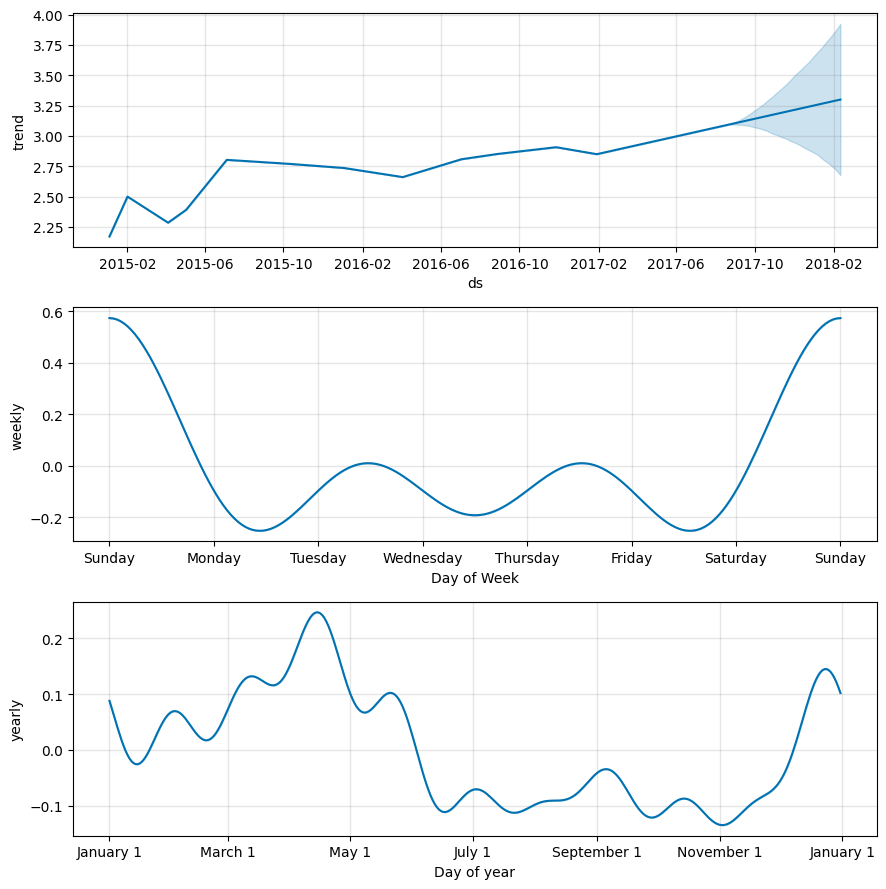

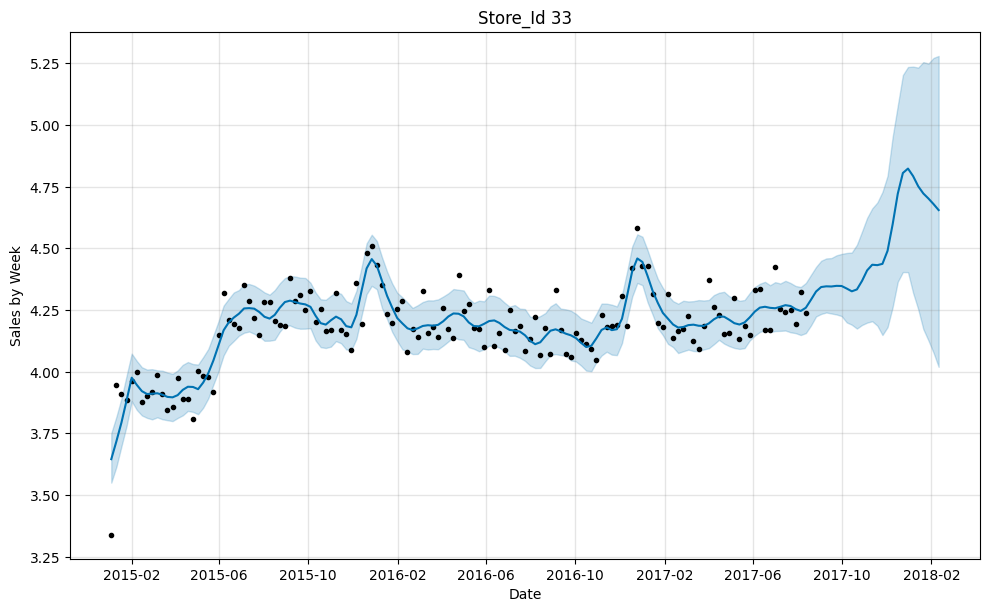

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/kodkrcrd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/lie3elkb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26346', 'data', 'file=/tmp/tmplthkugb_/kodkrcrd.json', 'init=/tmp/tmplthkugb_/lie3elkb.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelt58p27jr/prophet_model-20241112131052.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:10:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


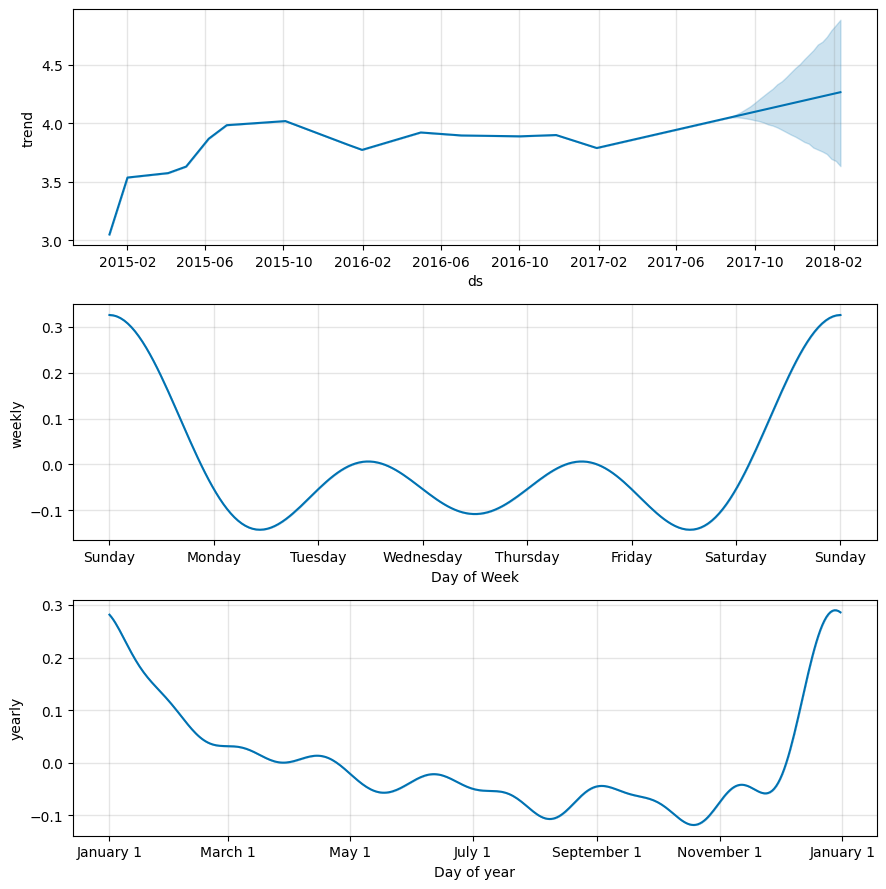

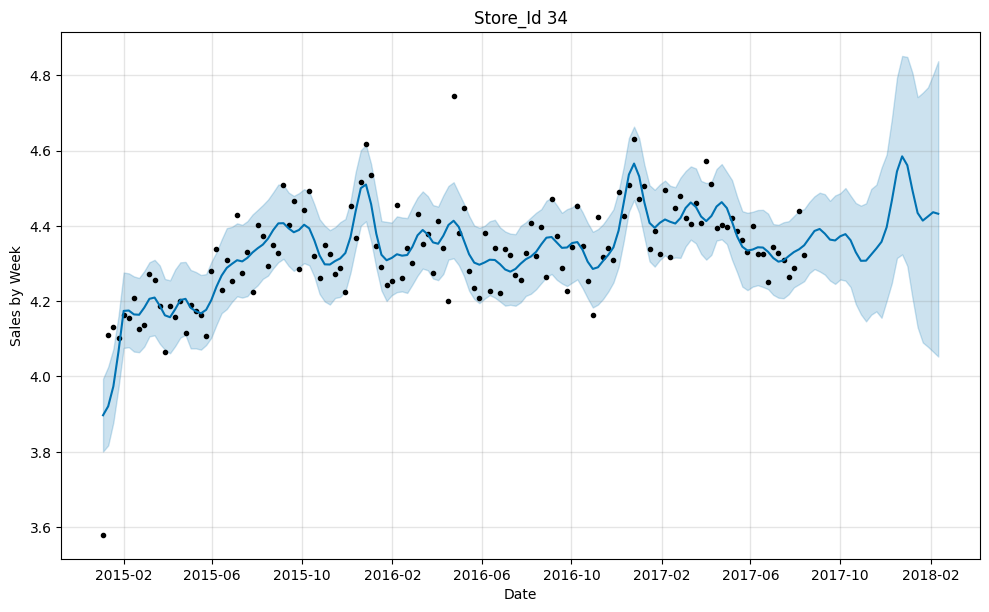

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/ct49tvb4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/ah8evolq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61176', 'data', 'file=/tmp/tmplthkugb_/ct49tvb4.json', 'init=/tmp/tmplthkugb_/ah8evolq.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelmqfw8zv8/prophet_model-20241112131056.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:10:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


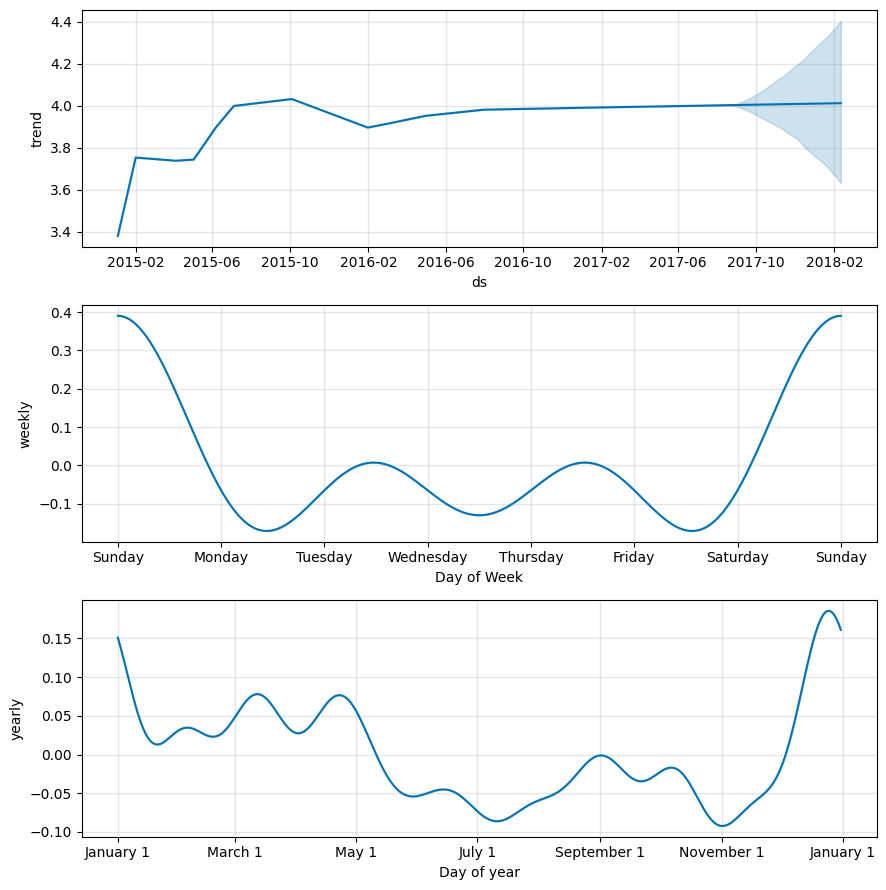

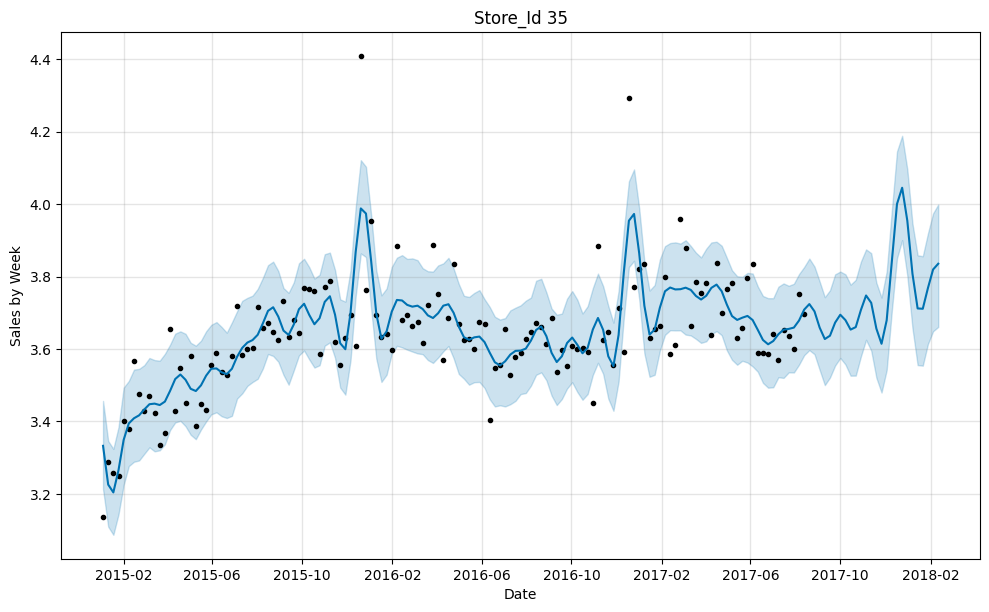

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/9t8hu76e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/v1qu5klq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80779', 'data', 'file=/tmp/tmplthkugb_/9t8hu76e.json', 'init=/tmp/tmplthkugb_/v1qu5klq.json', 'output', 'file=/tmp/tmplthkugb_/prophet_model_z59gea4/prophet_model-20241112131100.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:11:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:11:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


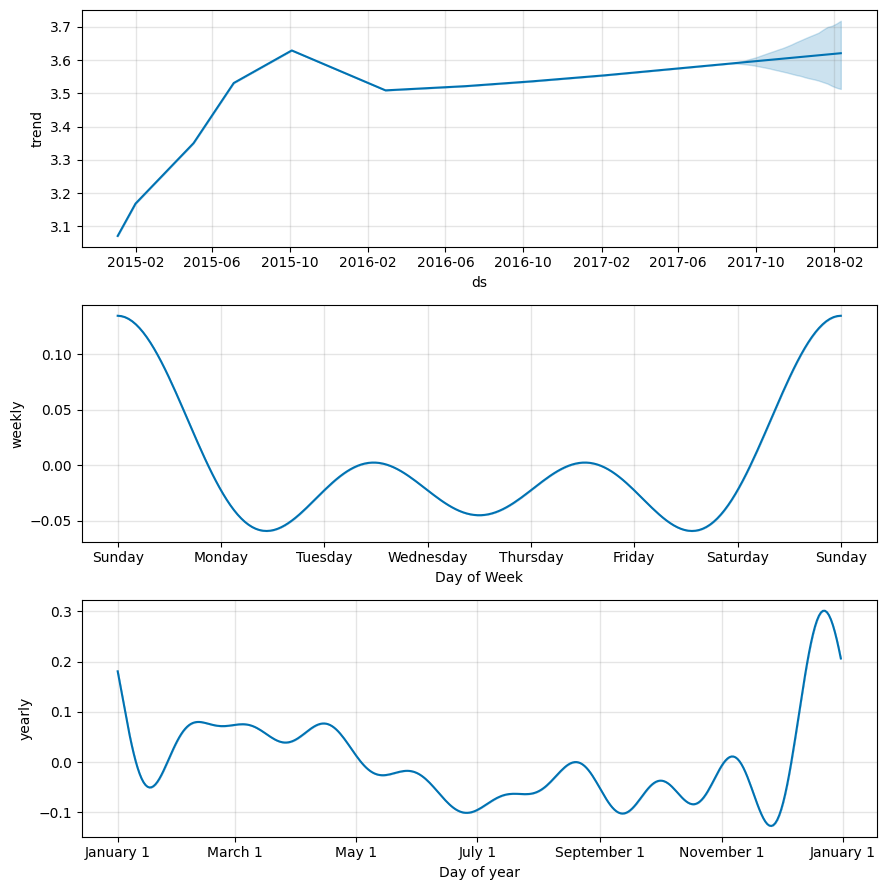

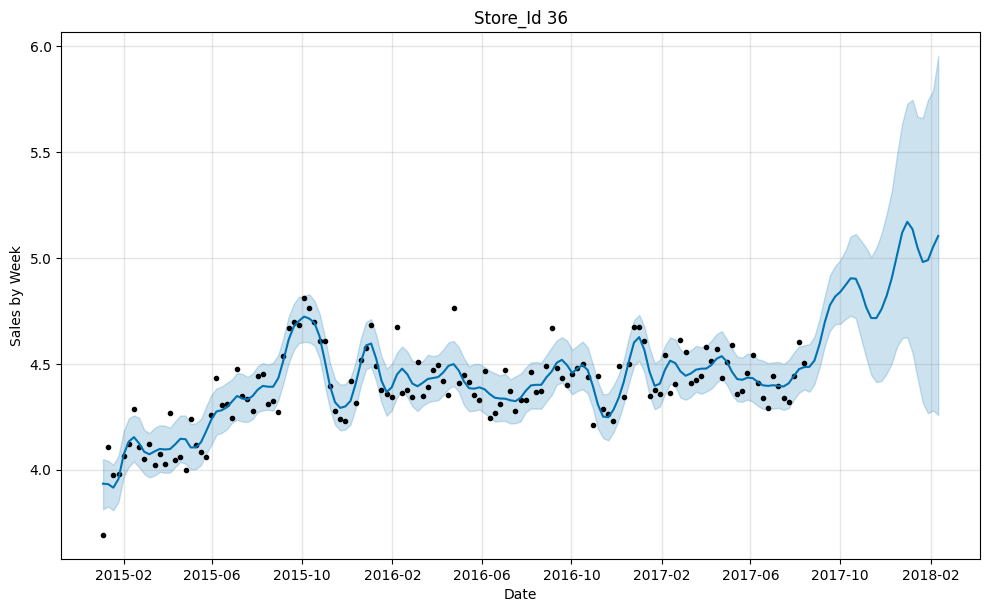

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/i5dmqeqz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/2b2_pzia.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29160', 'data', 'file=/tmp/tmplthkugb_/i5dmqeqz.json', 'init=/tmp/tmplthkugb_/2b2_pzia.json', 'output', 'file=/tmp/tmplthkugb_/prophet_model4ee4hdt2/prophet_model-20241112131102.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:11:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:11:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


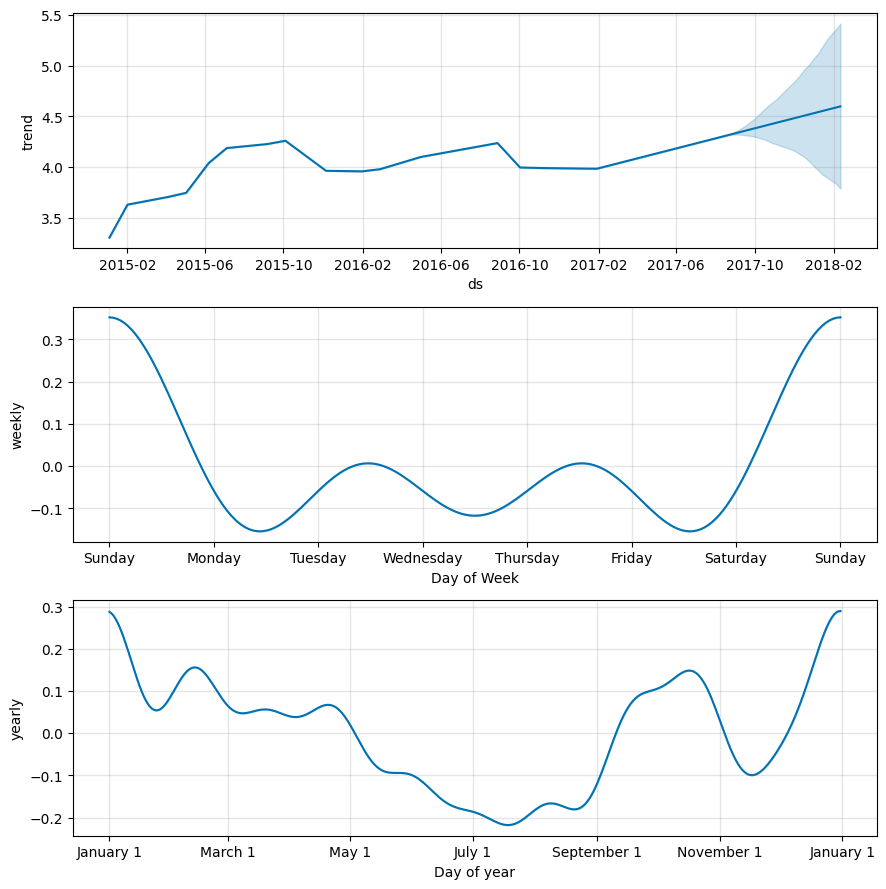

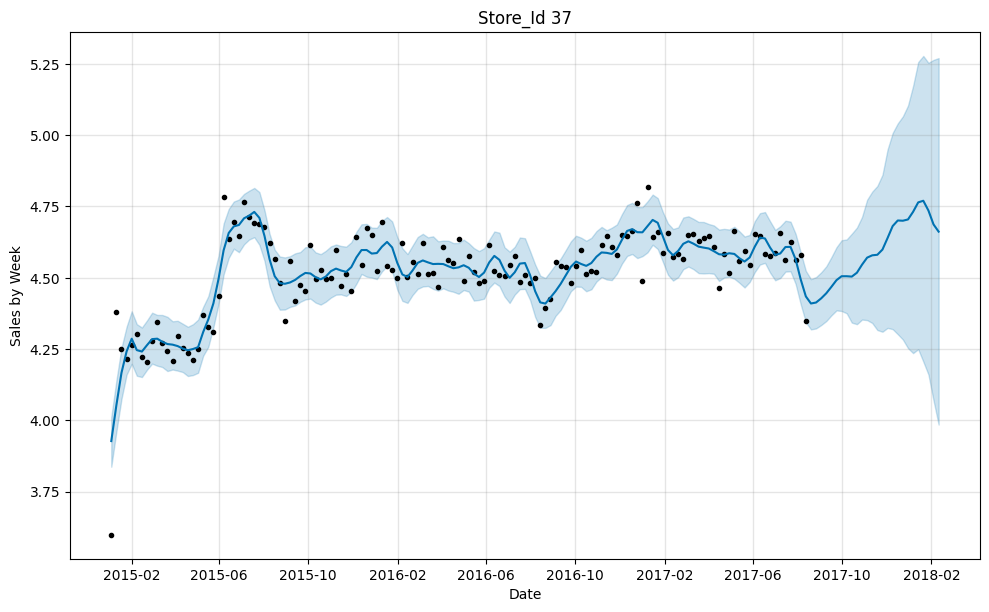

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/r91mwo9f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/tsplsk5y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30737', 'data', 'file=/tmp/tmplthkugb_/r91mwo9f.json', 'init=/tmp/tmplthkugb_/tsplsk5y.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modely5conxiq/prophet_model-20241112131105.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:11:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:11:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


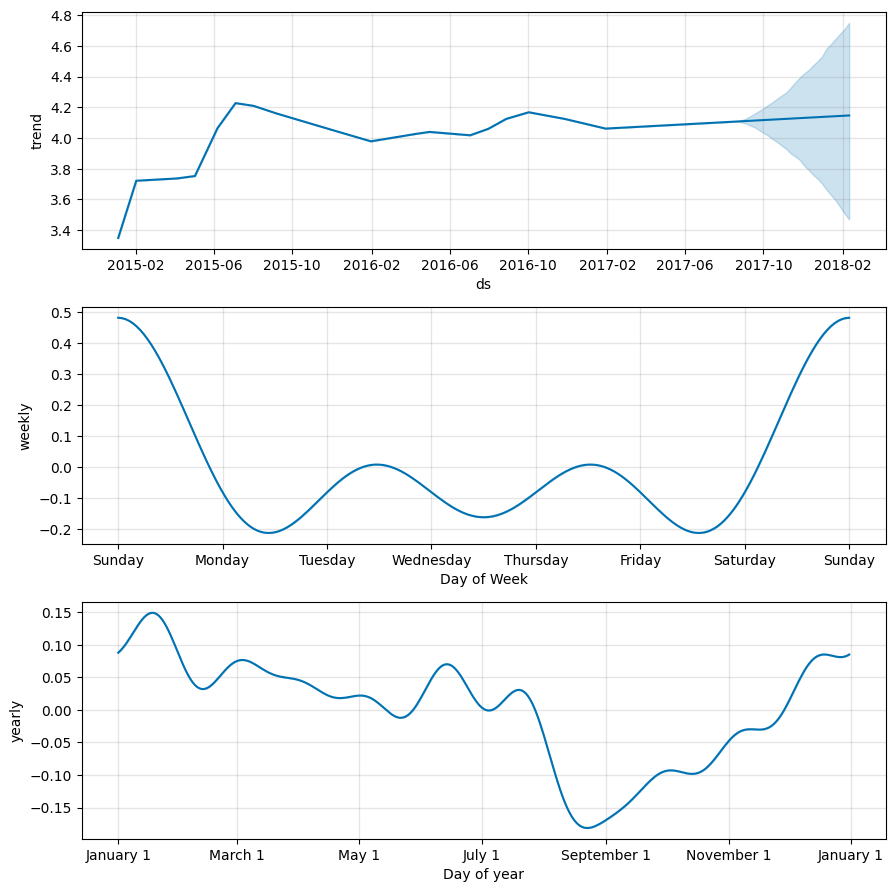

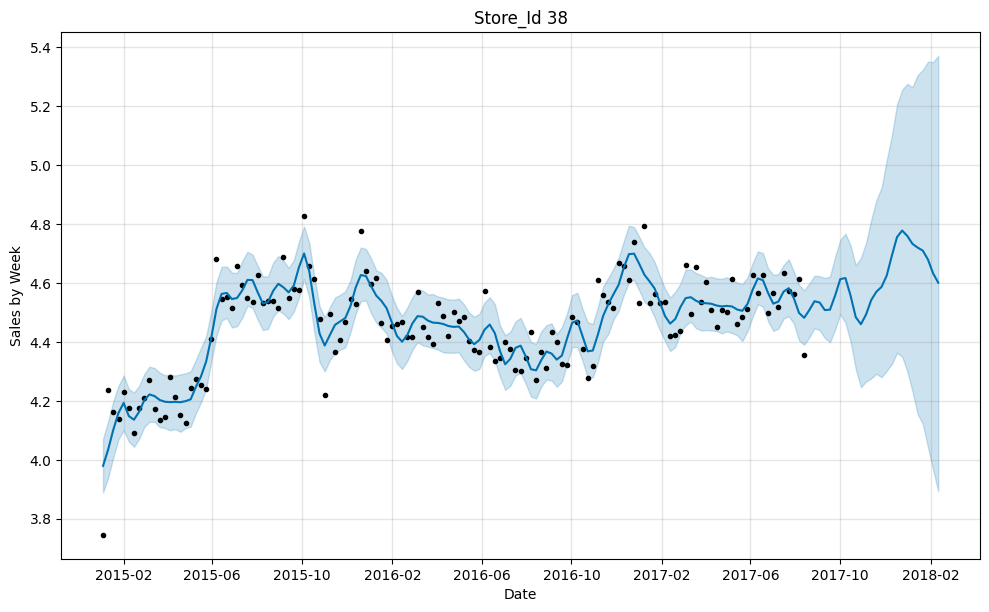

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/y1ozvsyx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/it9923j3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39660', 'data', 'file=/tmp/tmplthkugb_/y1ozvsyx.json', 'init=/tmp/tmplthkugb_/it9923j3.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelzku88z9a/prophet_model-20241112131108.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:11:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:11:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


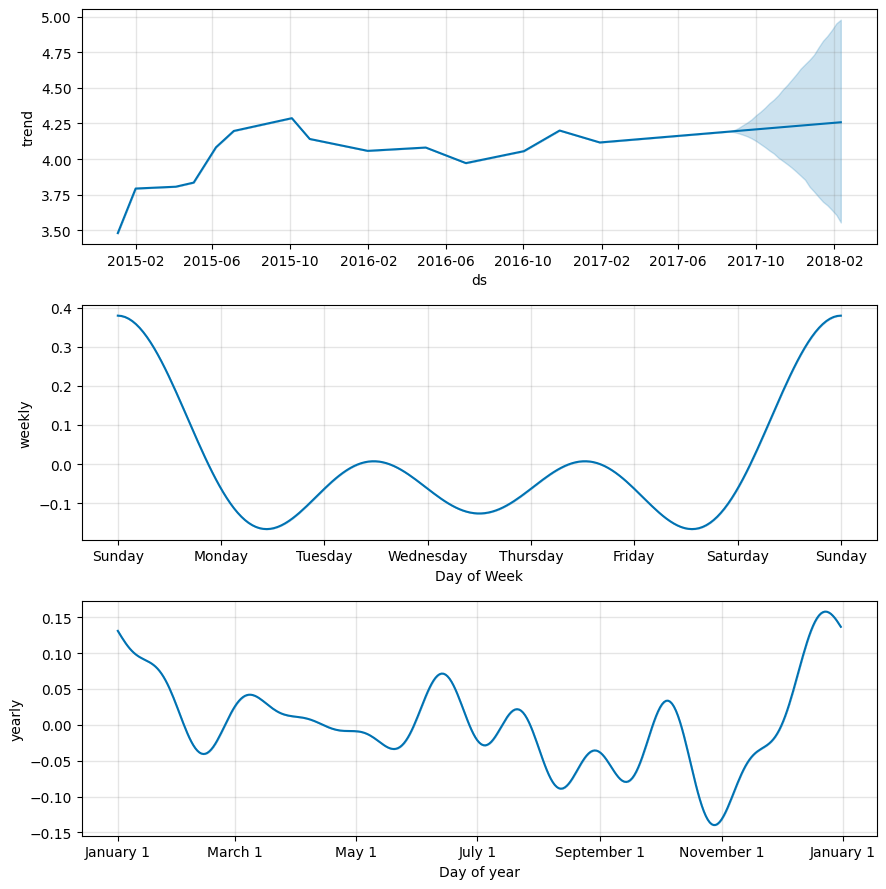

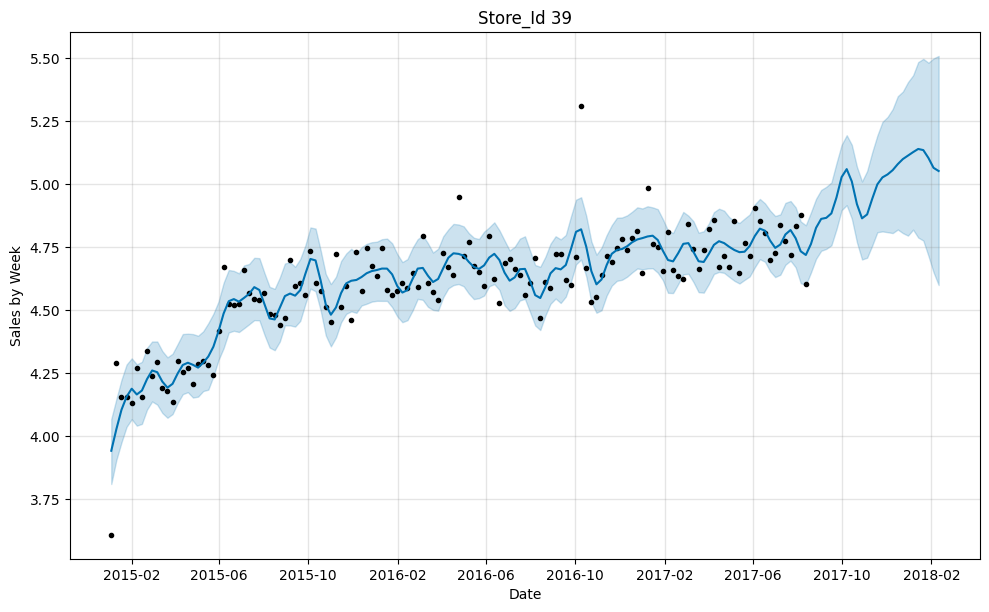

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/9bngnn9d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/_afevuqe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35429', 'data', 'file=/tmp/tmplthkugb_/9bngnn9d.json', 'init=/tmp/tmplthkugb_/_afevuqe.json', 'output', 'file=/tmp/tmplthkugb_/prophet_model2r861h6o/prophet_model-20241112131112.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:11:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:11:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


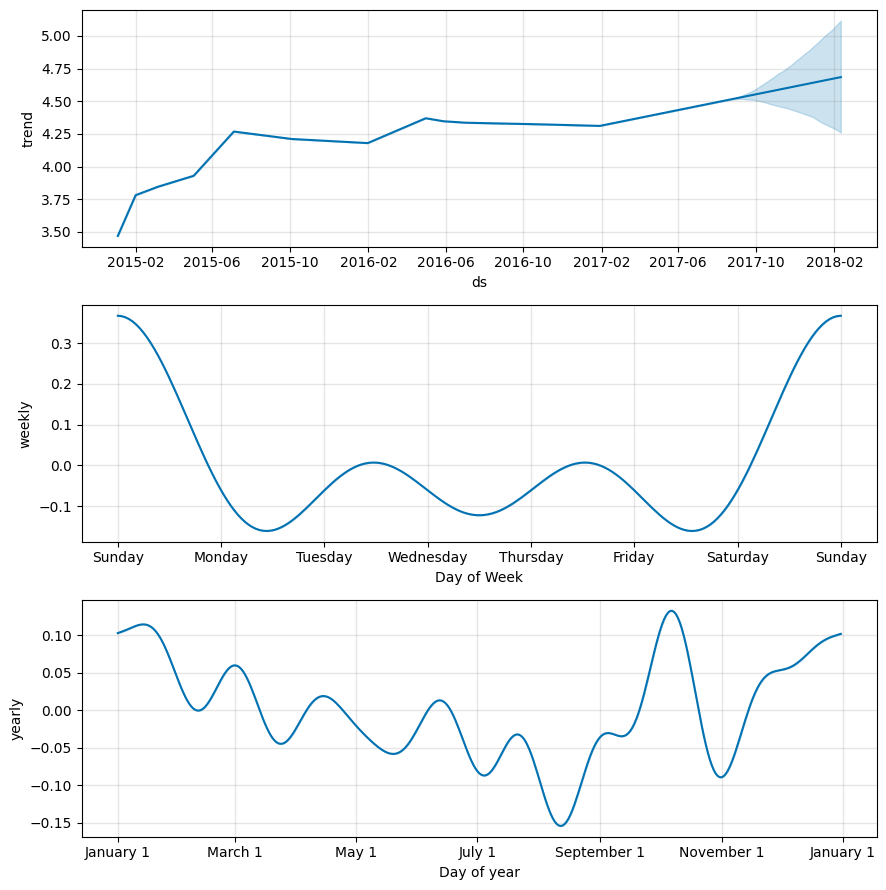

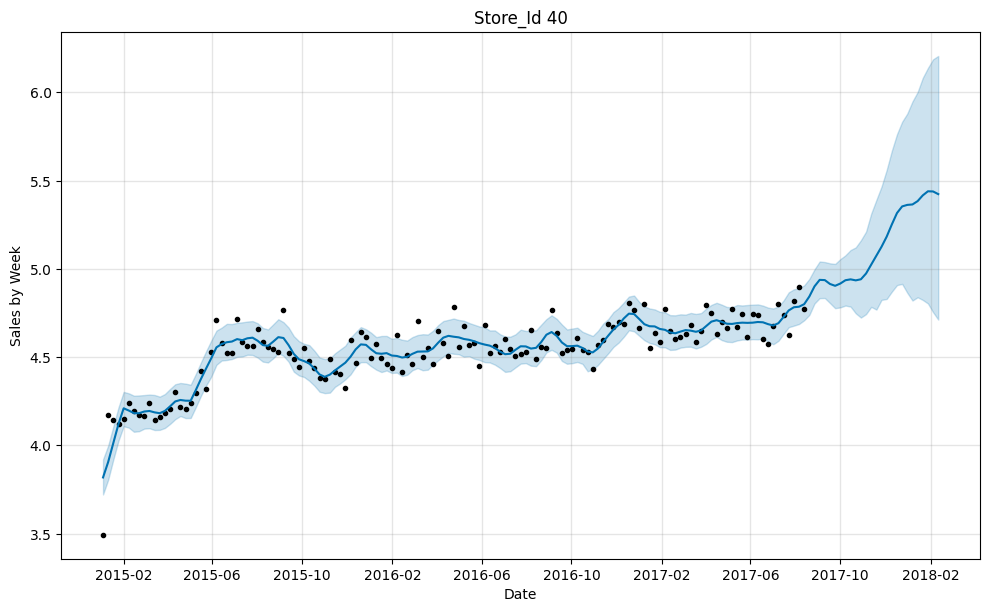

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/rmfnq_kf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/hsx9mdos.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22328', 'data', 'file=/tmp/tmplthkugb_/rmfnq_kf.json', 'init=/tmp/tmplthkugb_/hsx9mdos.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelq7kcnv_f/prophet_model-20241112131114.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:11:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:11:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


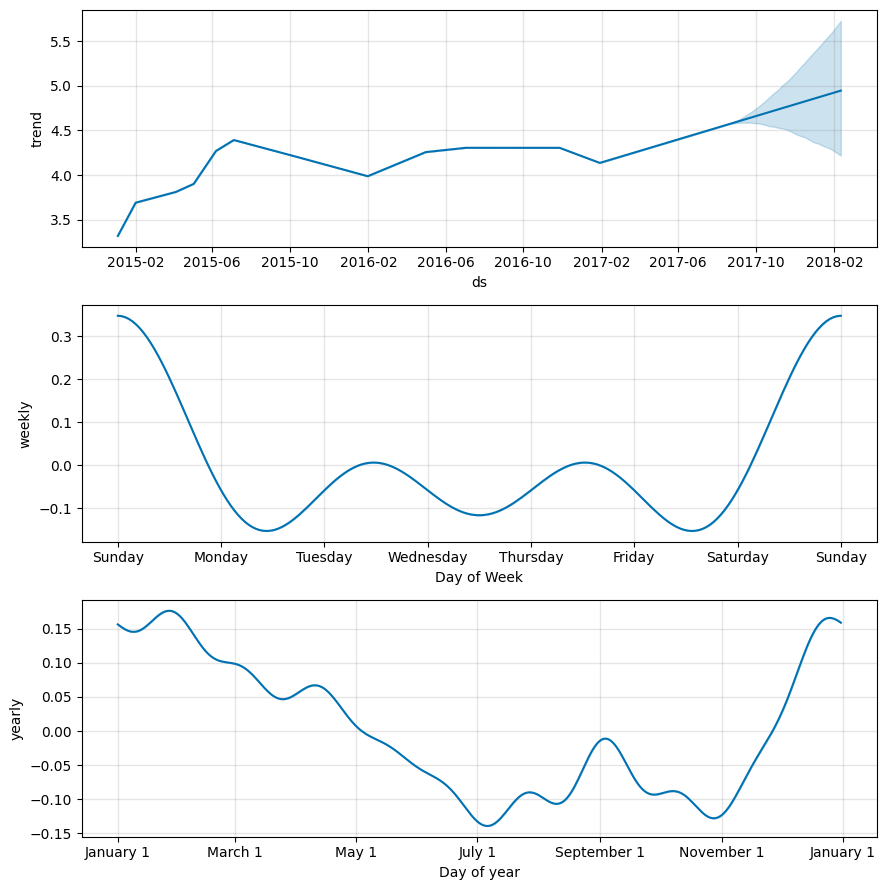

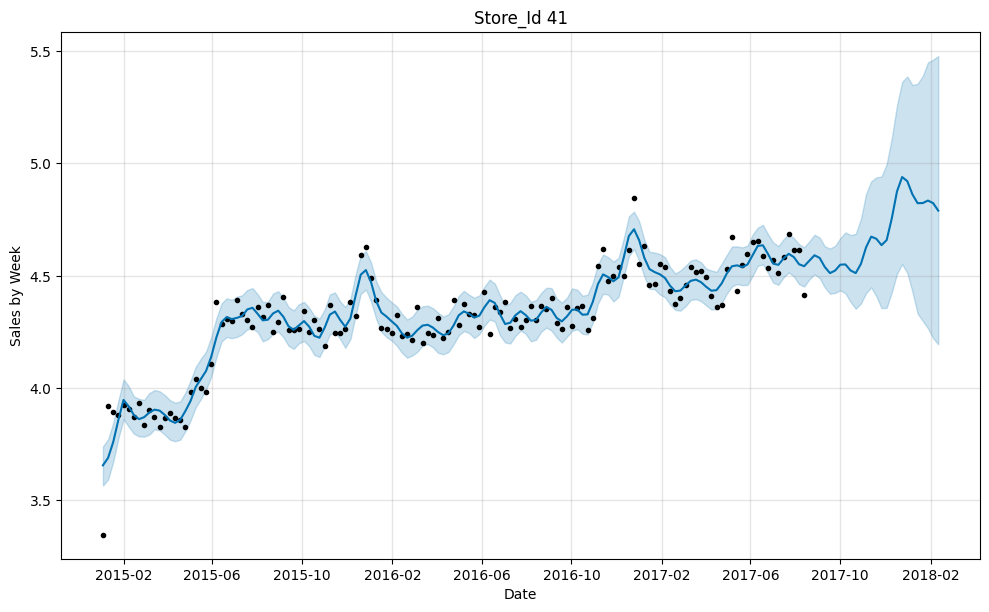

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/kcedsv_p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/7ic_833f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47797', 'data', 'file=/tmp/tmplthkugb_/kcedsv_p.json', 'init=/tmp/tmplthkugb_/7ic_833f.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelemymqf12/prophet_model-20241112131118.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:11:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:11:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


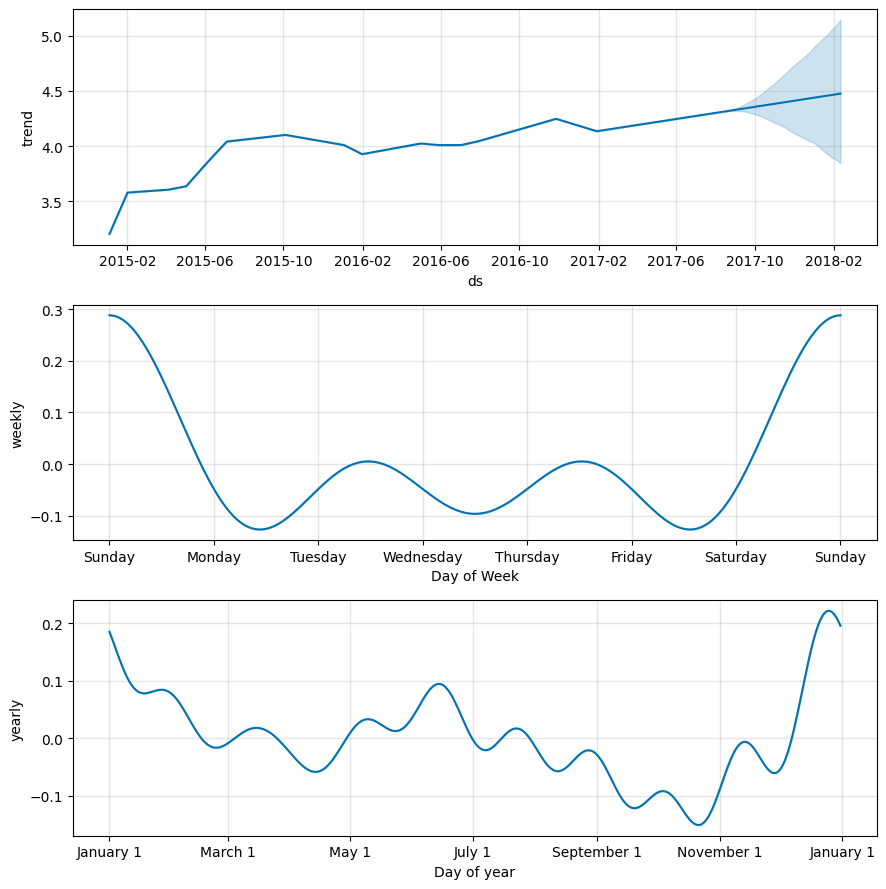

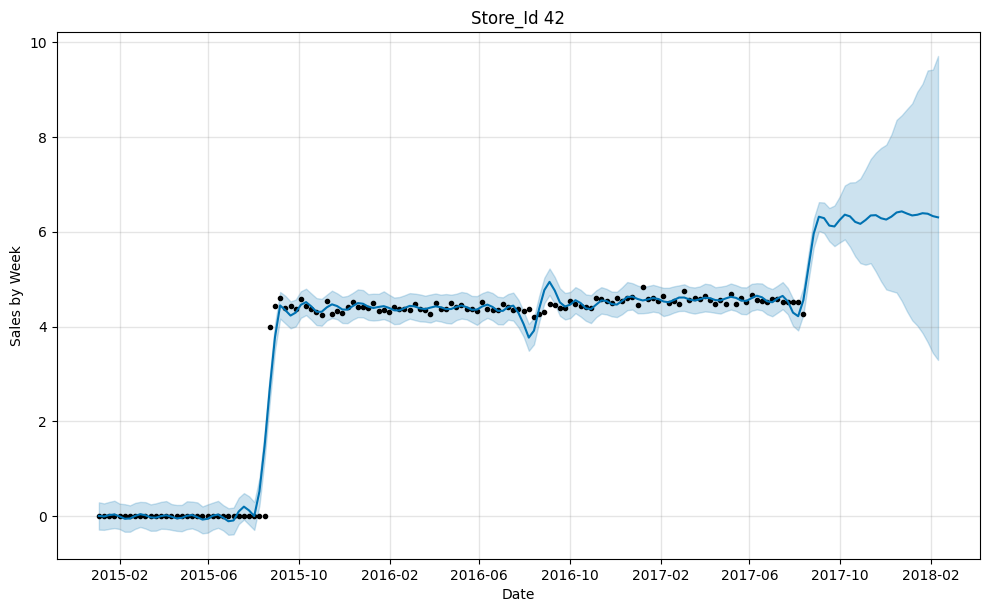

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/vlv91kjf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/ykezt9tp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75235', 'data', 'file=/tmp/tmplthkugb_/vlv91kjf.json', 'init=/tmp/tmplthkugb_/ykezt9tp.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modeloqmse65r/prophet_model-20241112131120.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:11:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:11:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


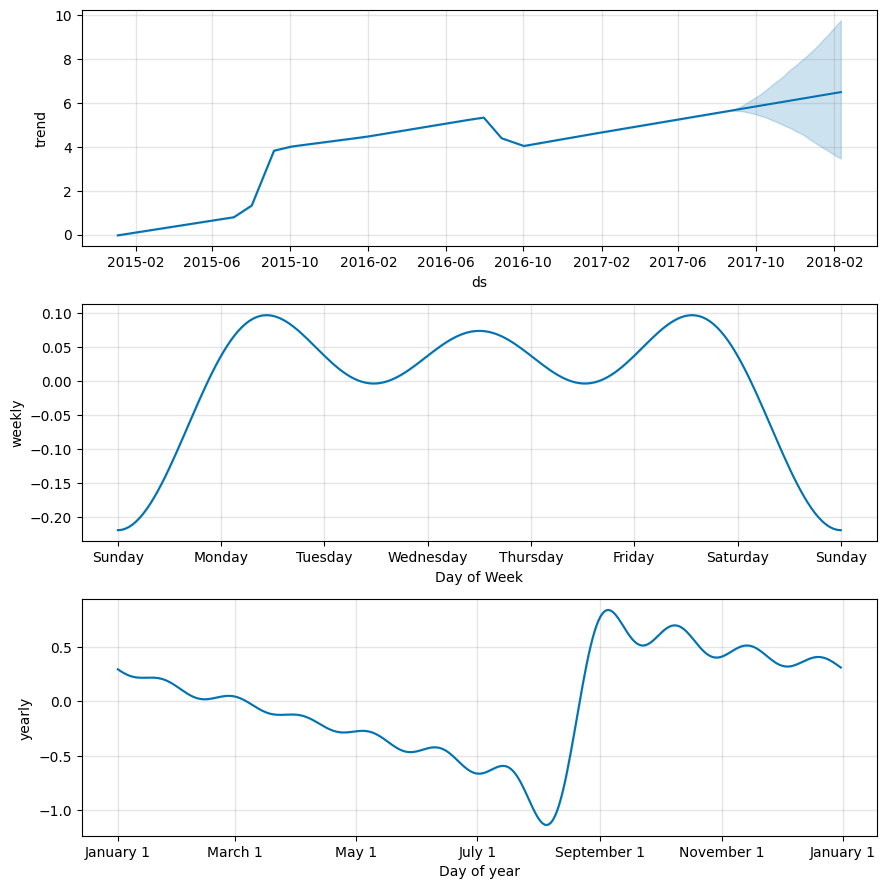

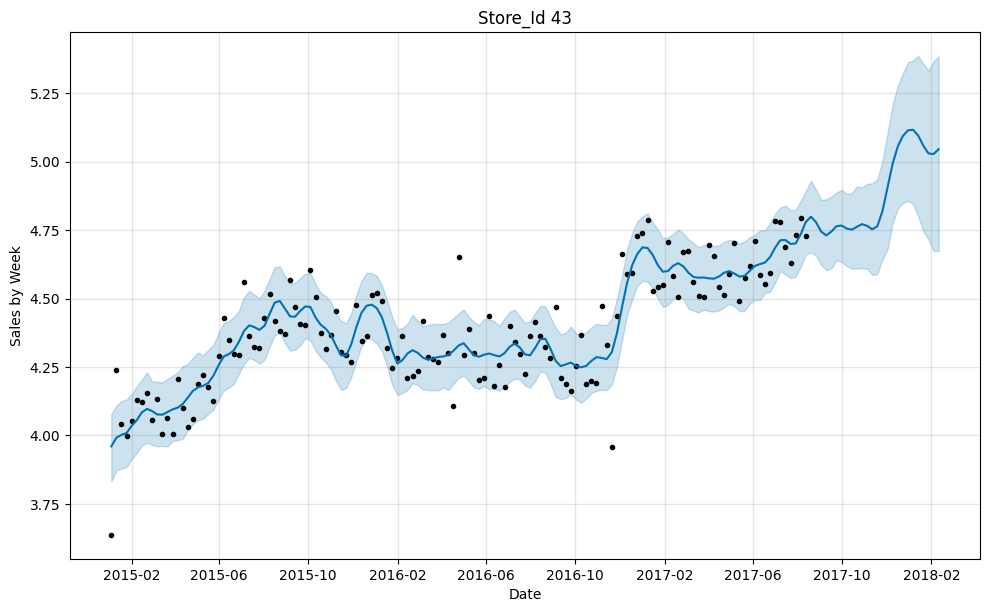

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/_bau79hp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/hjp6pdm5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59199', 'data', 'file=/tmp/tmplthkugb_/_bau79hp.json', 'init=/tmp/tmplthkugb_/hjp6pdm5.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modeljca0ed5_/prophet_model-20241112131122.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:11:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:11:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


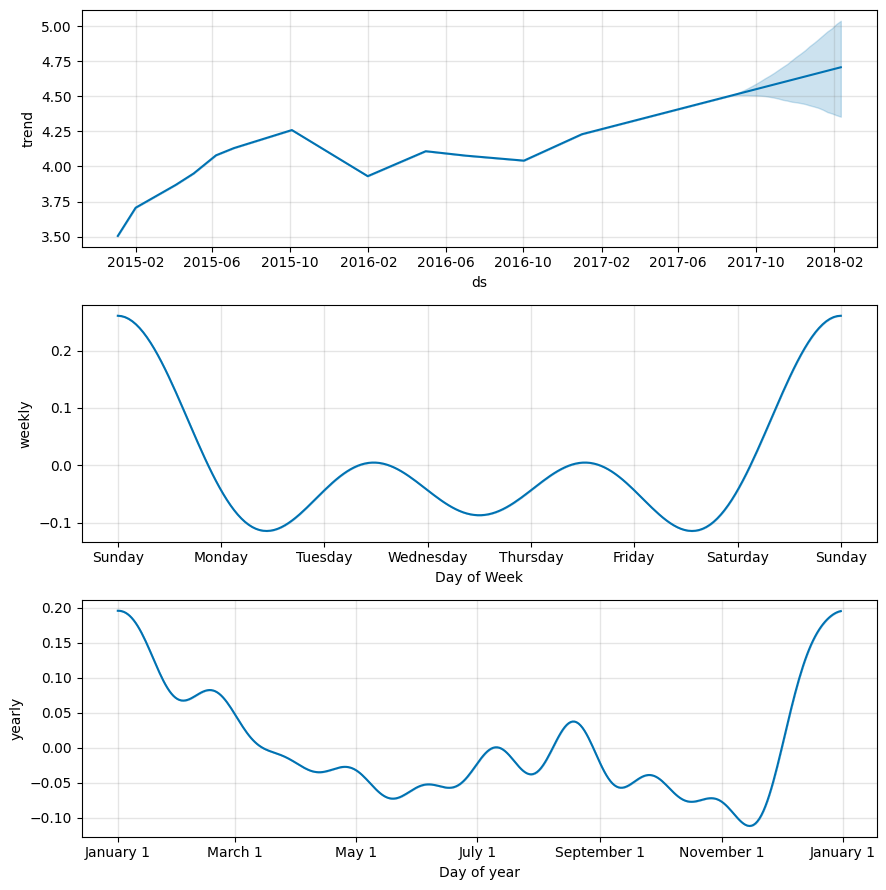

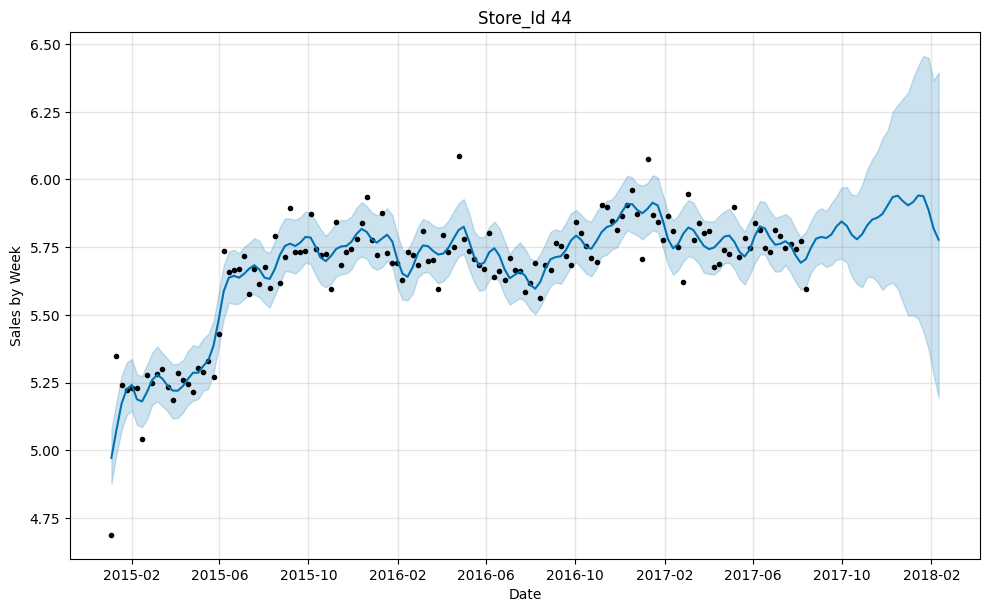

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/pom7ifo2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/hffuv0_7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34160', 'data', 'file=/tmp/tmplthkugb_/pom7ifo2.json', 'init=/tmp/tmplthkugb_/hffuv0_7.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelmij5zy11/prophet_model-20241112131124.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:11:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:11:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


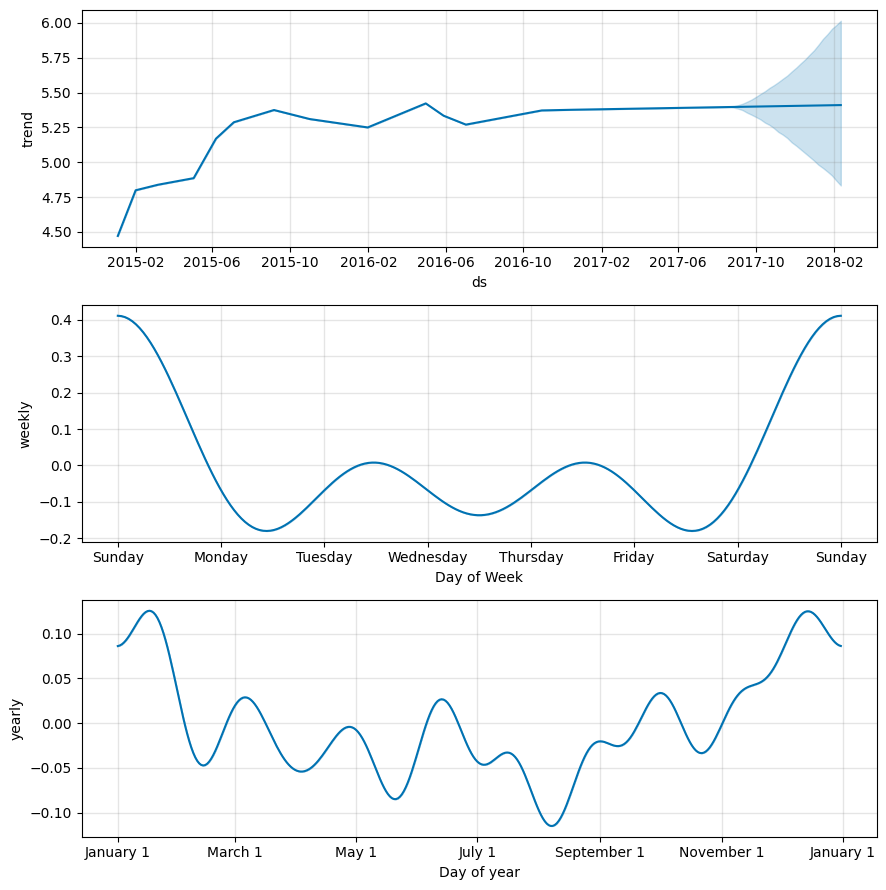

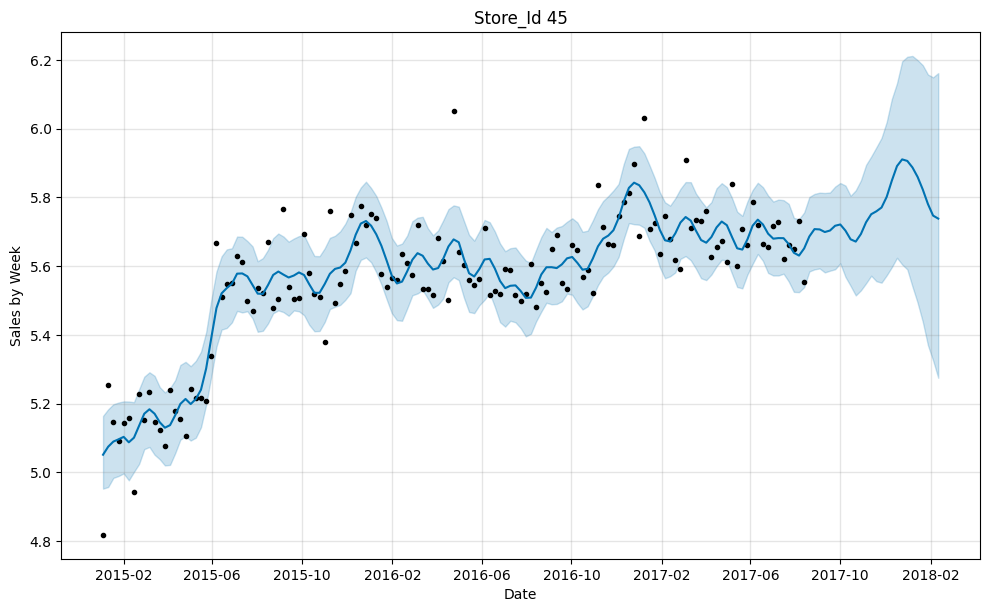

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/tm8yjkuw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/84zuhp1j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80903', 'data', 'file=/tmp/tmplthkugb_/tm8yjkuw.json', 'init=/tmp/tmplthkugb_/84zuhp1j.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelhktah6de/prophet_model-20241112131127.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:11:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:11:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


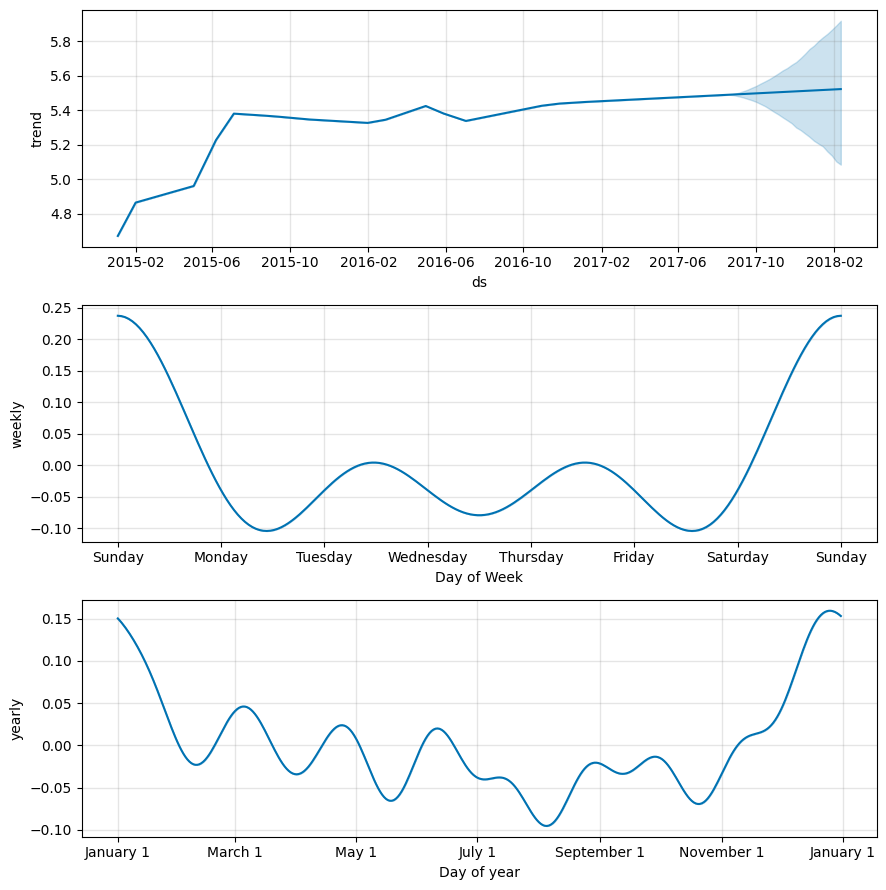

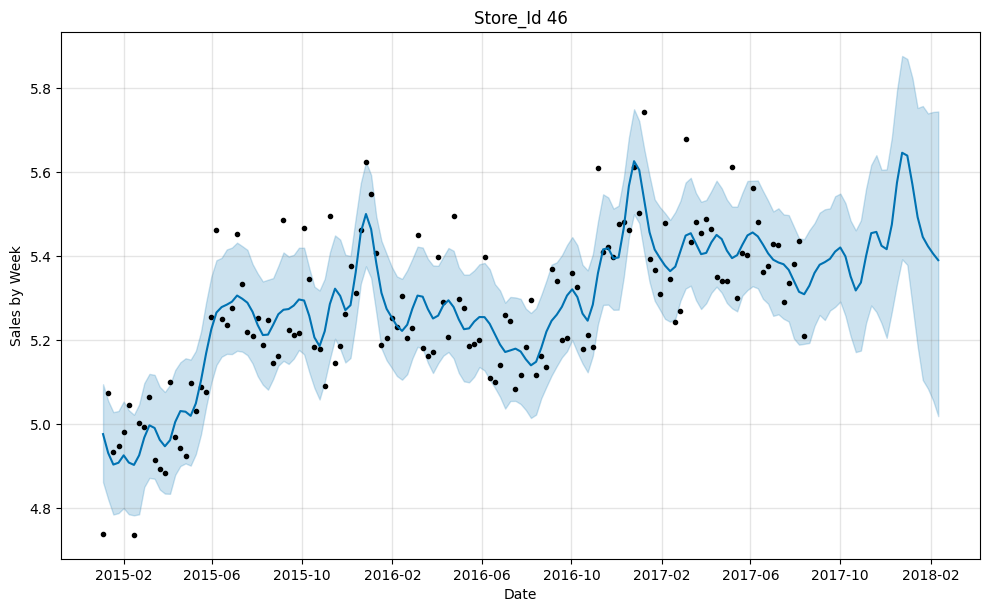

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/yxxyst5a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/podk9hap.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27256', 'data', 'file=/tmp/tmplthkugb_/yxxyst5a.json', 'init=/tmp/tmplthkugb_/podk9hap.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelvxef30mo/prophet_model-20241112131129.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:11:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:11:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


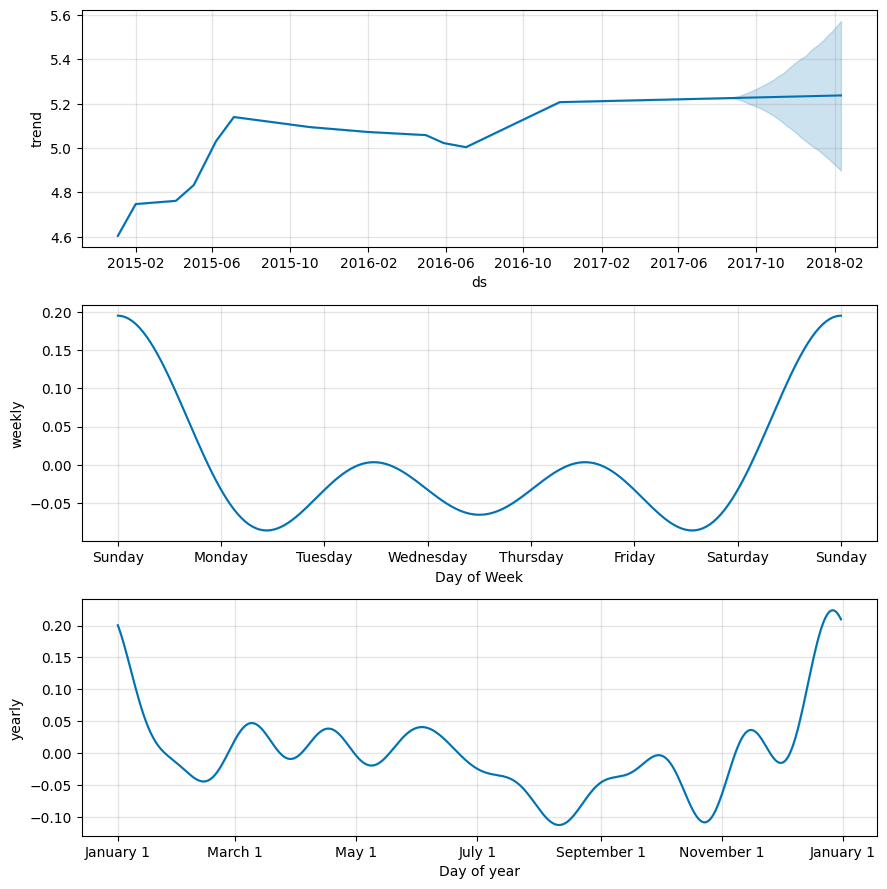

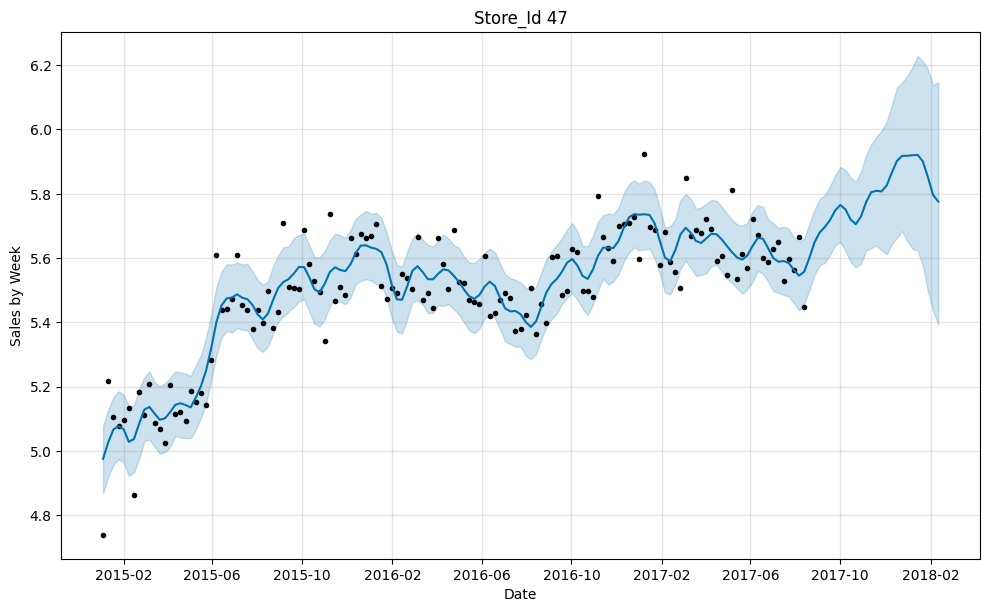

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/1g0zdfnv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/4y2gw78x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6541', 'data', 'file=/tmp/tmplthkugb_/1g0zdfnv.json', 'init=/tmp/tmplthkugb_/4y2gw78x.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelpxpvjnib/prophet_model-20241112131132.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:11:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:11:33 - cmdstanpy - INFO - Chain [1] done processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


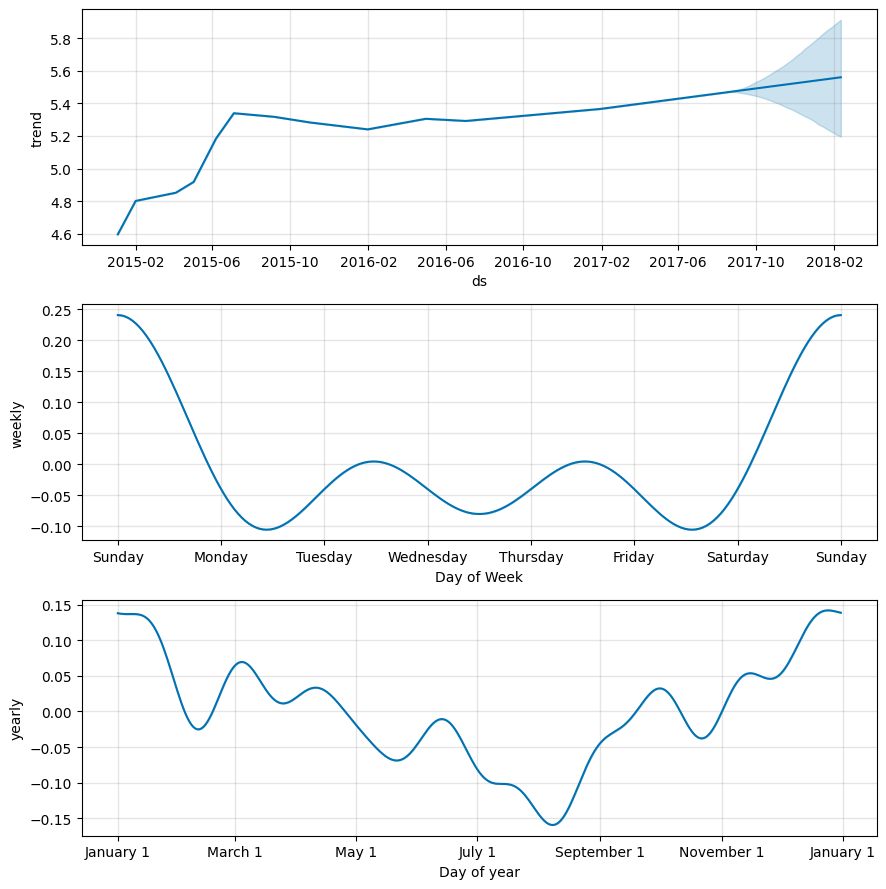

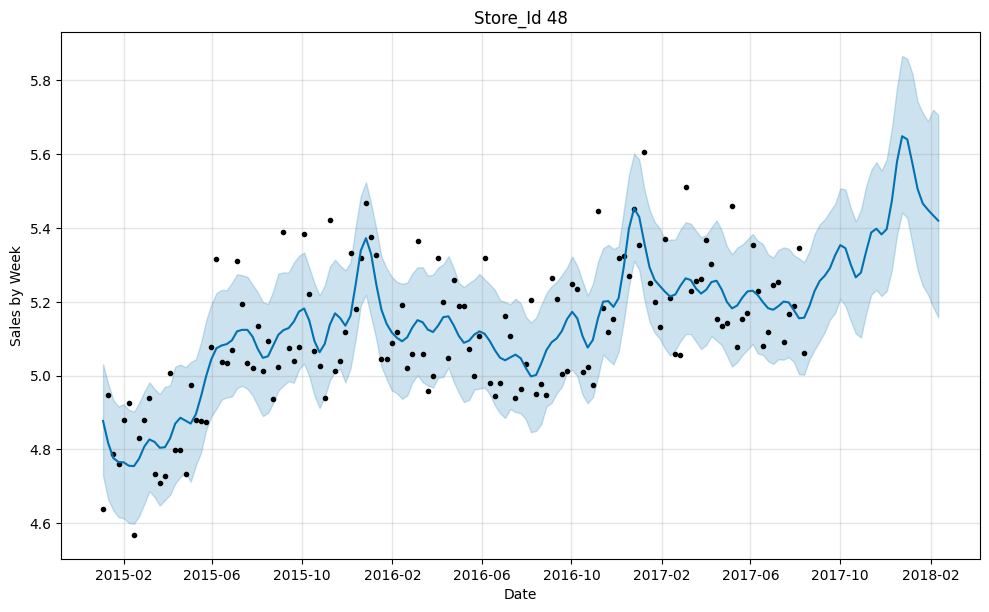

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/5zau4bib.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/o13vq5vi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24379', 'data', 'file=/tmp/tmplthkugb_/5zau4bib.json', 'init=/tmp/tmplthkugb_/o13vq5vi.json', 'output', 'file=/tmp/tmplthkugb_/prophet_model7_l7q8bv/prophet_model-20241112131135.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:11:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:11:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


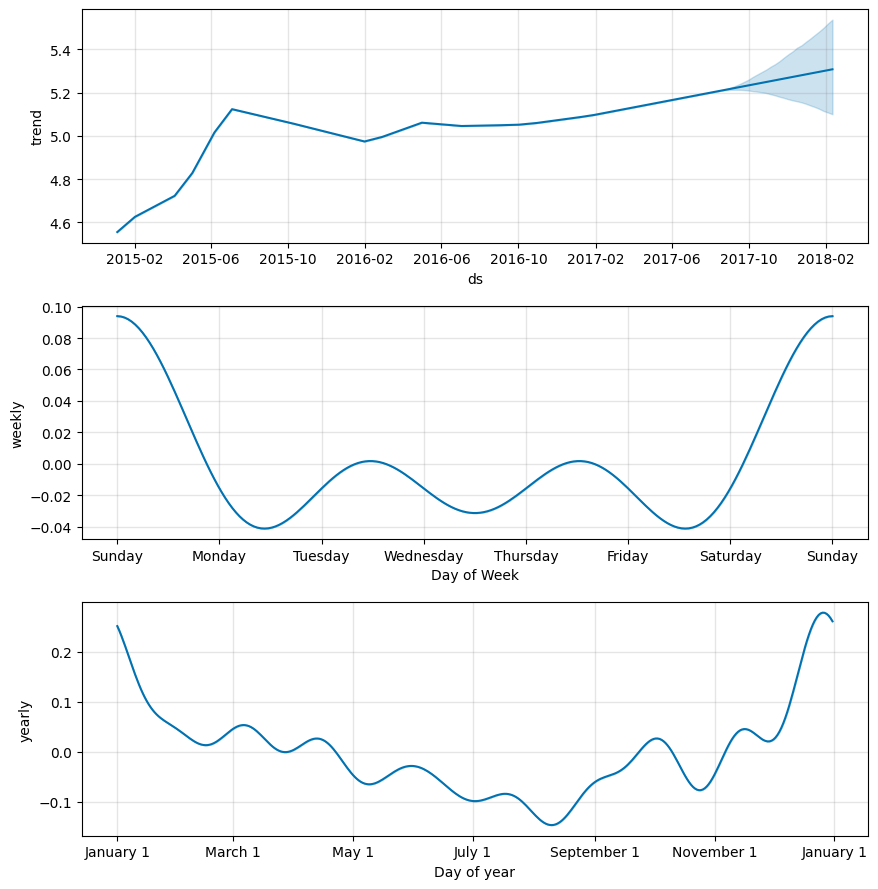

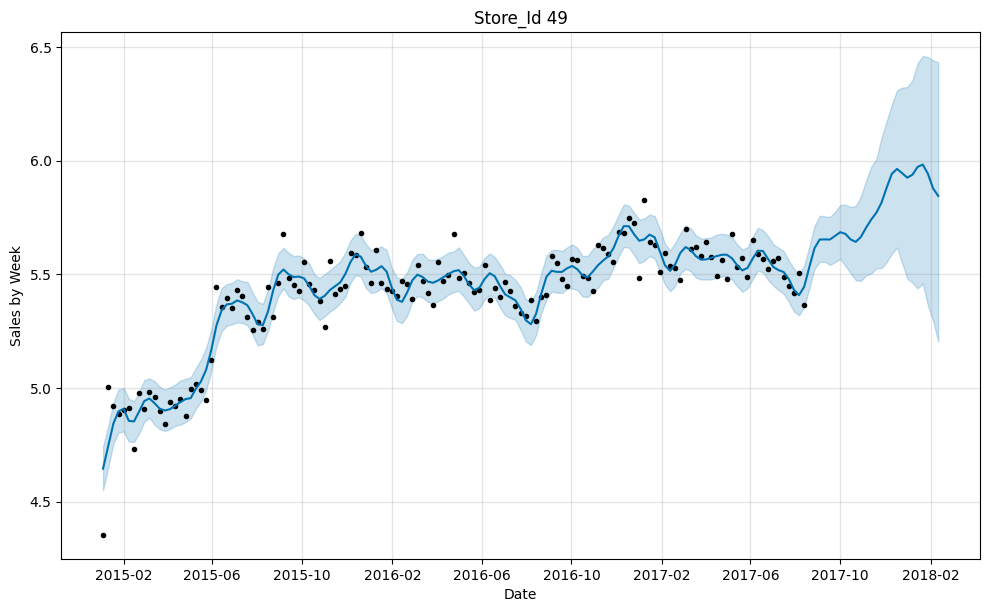

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/8bc9jviq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/y1uy8s2c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60490', 'data', 'file=/tmp/tmplthkugb_/8bc9jviq.json', 'init=/tmp/tmplthkugb_/y1uy8s2c.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelsvxo3r1r/prophet_model-20241112131138.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:11:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:11:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


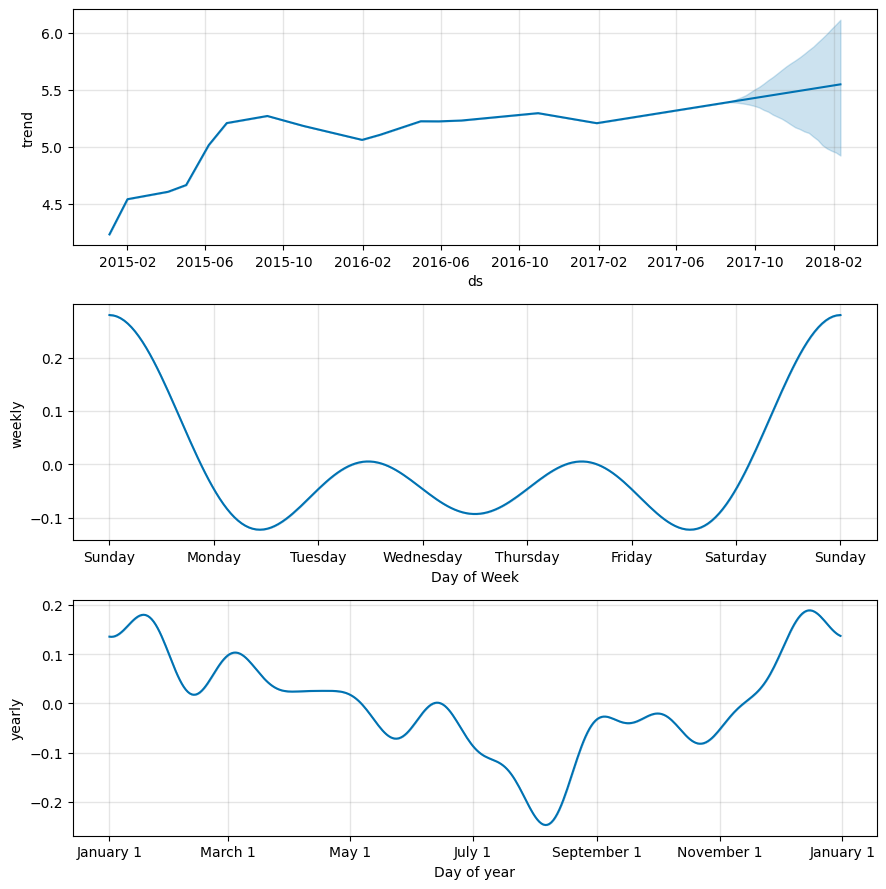

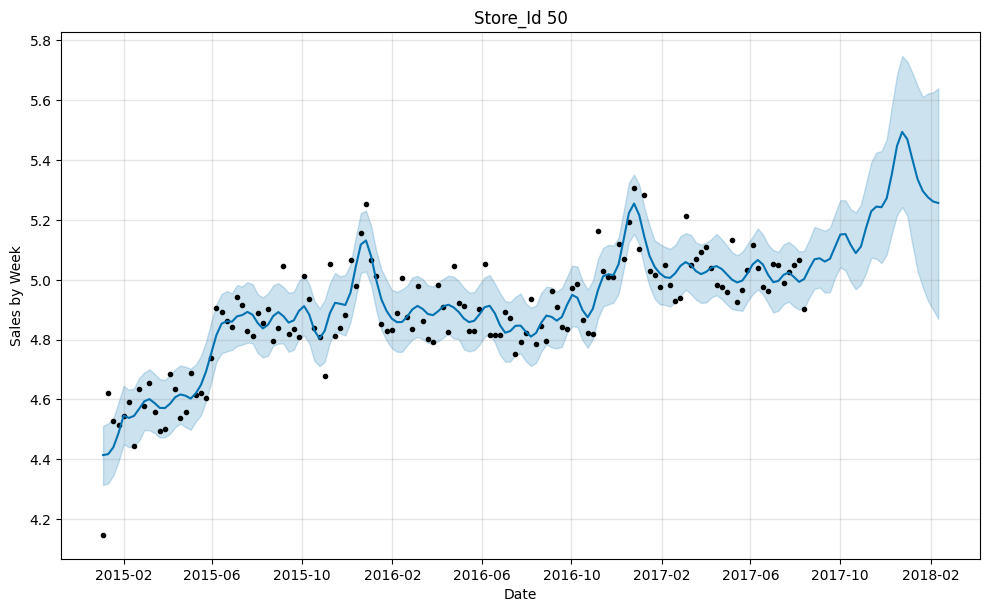

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/iztg9syp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/zptbw_lk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8411', 'data', 'file=/tmp/tmplthkugb_/iztg9syp.json', 'init=/tmp/tmplthkugb_/zptbw_lk.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelr9vmc65g/prophet_model-20241112131140.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:11:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:11:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


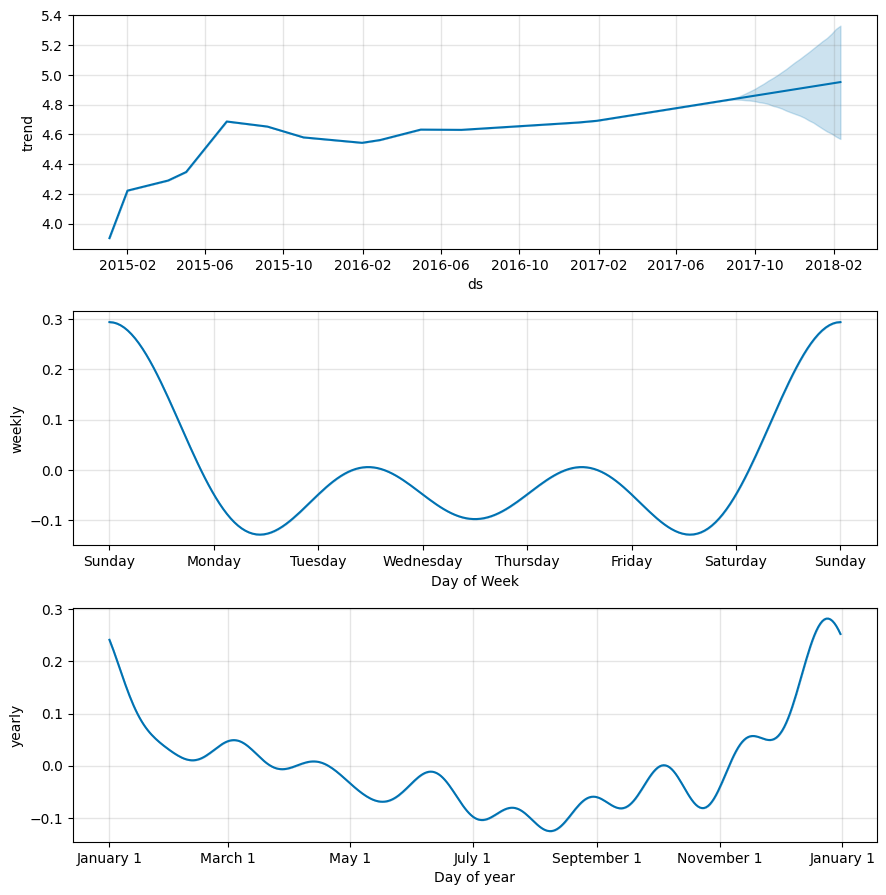

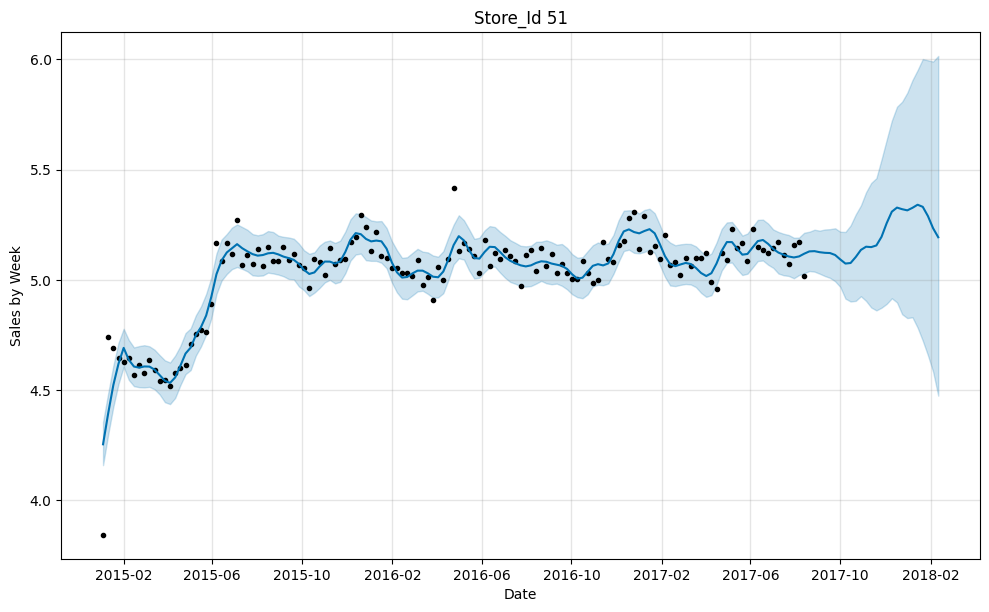

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/mqqoakqe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/9ww15anc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92828', 'data', 'file=/tmp/tmplthkugb_/mqqoakqe.json', 'init=/tmp/tmplthkugb_/9ww15anc.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelxjliim5v/prophet_model-20241112131142.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:11:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:11:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00
df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


<ipython-input-62-ee8dec01fb38>:48: RuntimeWarning: divide by zero encountered in scalar divide
  growth_projected = ((last_forecast_period - last_current_period) / last_current_period) * 100


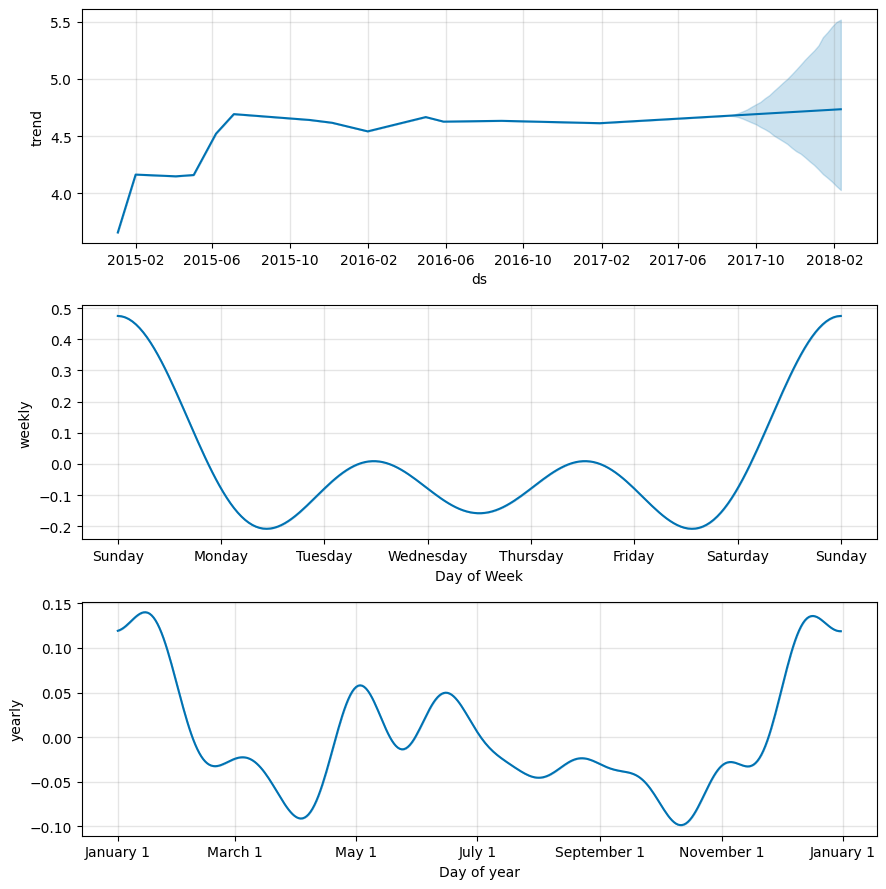

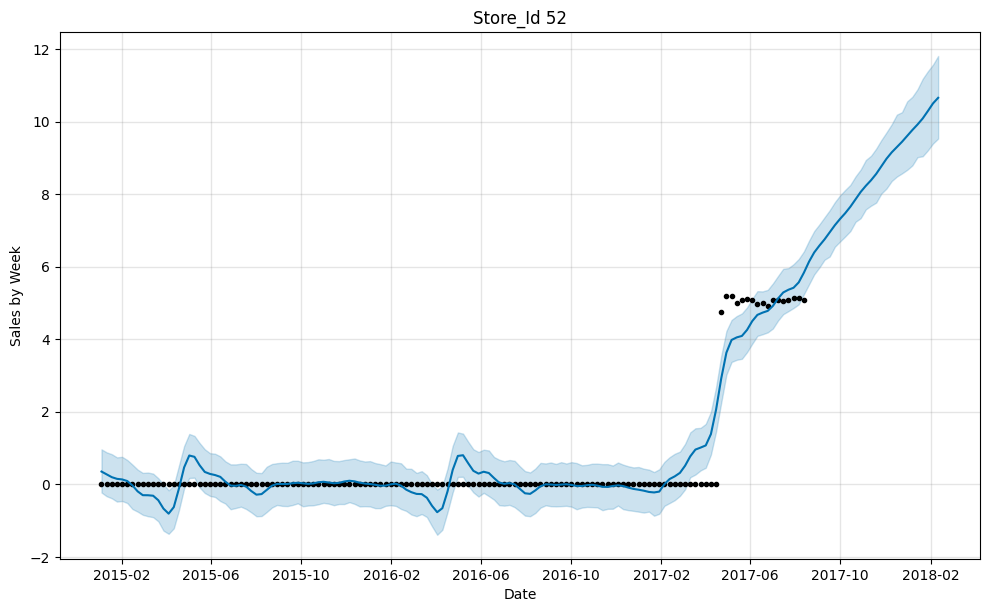

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/hl37qssr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/2spnre1e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85277', 'data', 'file=/tmp/tmplthkugb_/hl37qssr.json', 'init=/tmp/tmplthkugb_/2spnre1e.json', 'output', 'file=/tmp/tmplthkugb_/prophet_modelw6iag86v/prophet_model-20241112131144.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:11:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:11:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


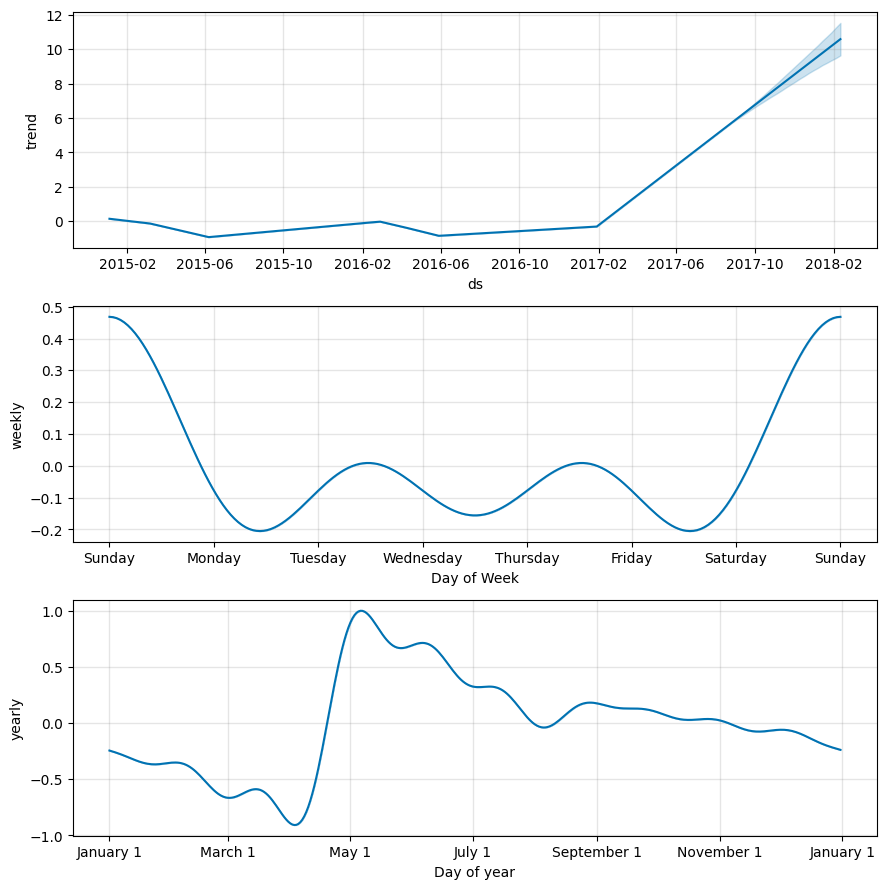

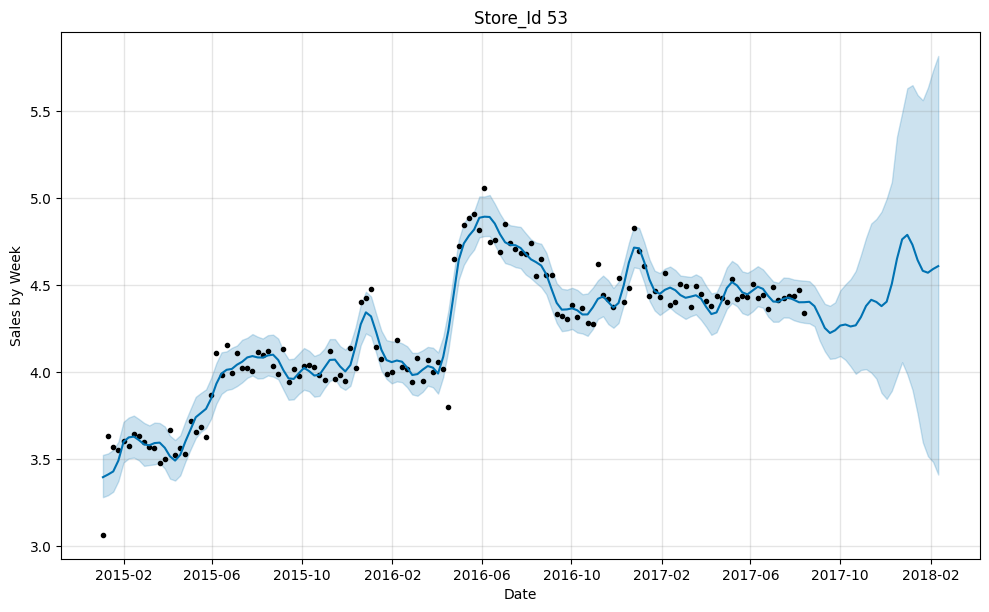

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/uhr7bf4k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplthkugb_/redkgm8h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98527', 'data', 'file=/tmp/tmplthkugb_/uhr7bf4k.json', 'init=/tmp/tmplthkugb_/redkgm8h.json', 'output', 'file=/tmp/tmplthkugb_/prophet_model97edrpwo/prophet_model-20241112131147.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:11:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


data desde 2015-01-04 00:00:00  2017-08-13 00:00:00


13:11:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


df_future: de 2015-01-04 00:00:00 hasta 2018-02-11 00:00:00


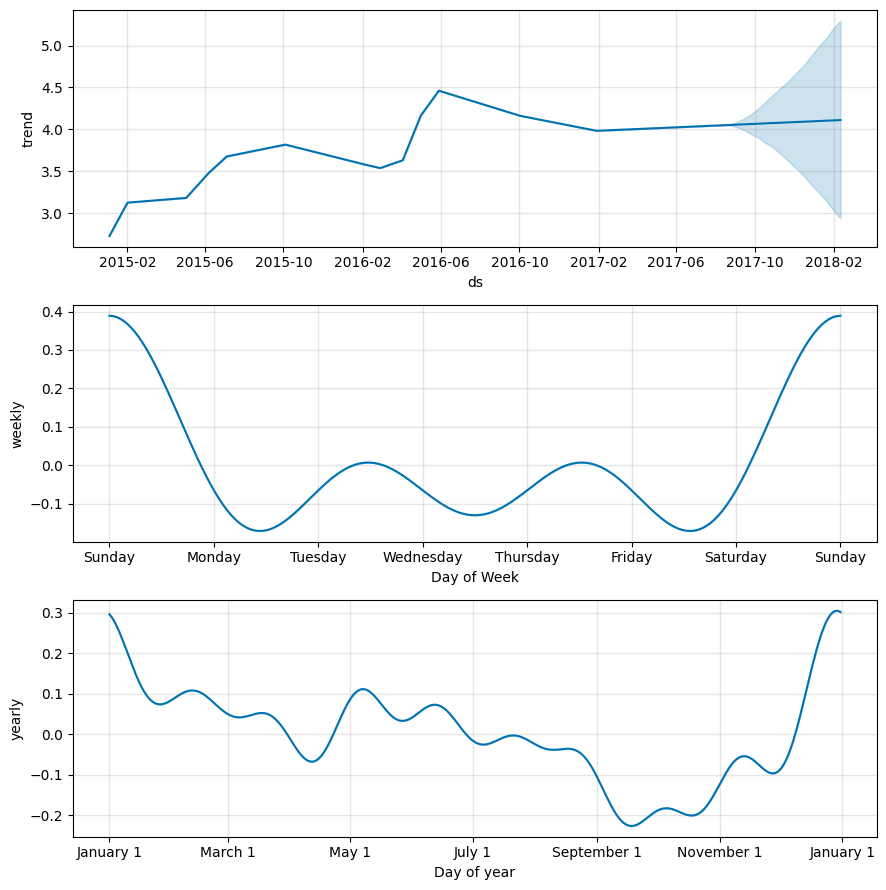

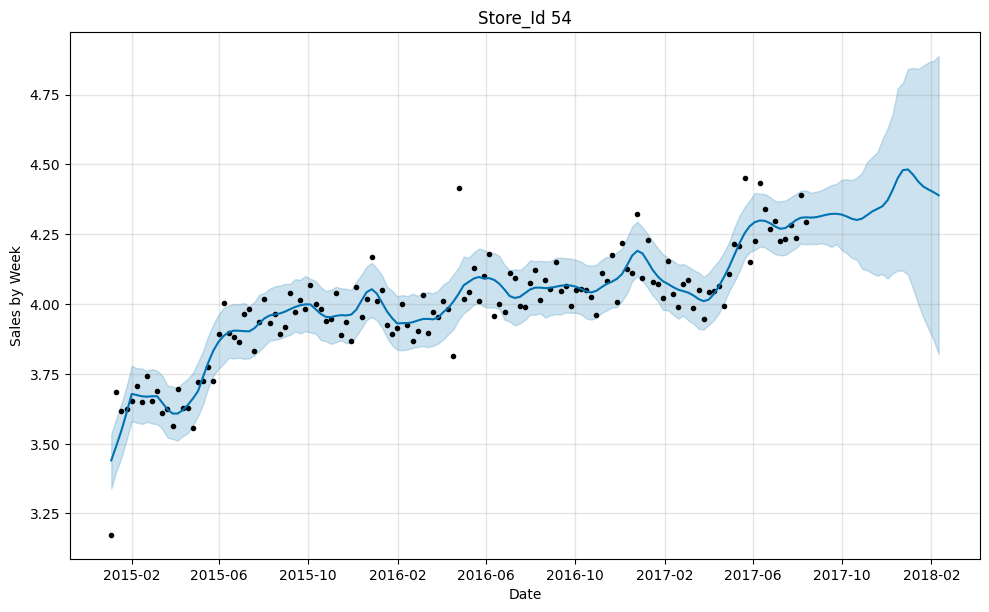

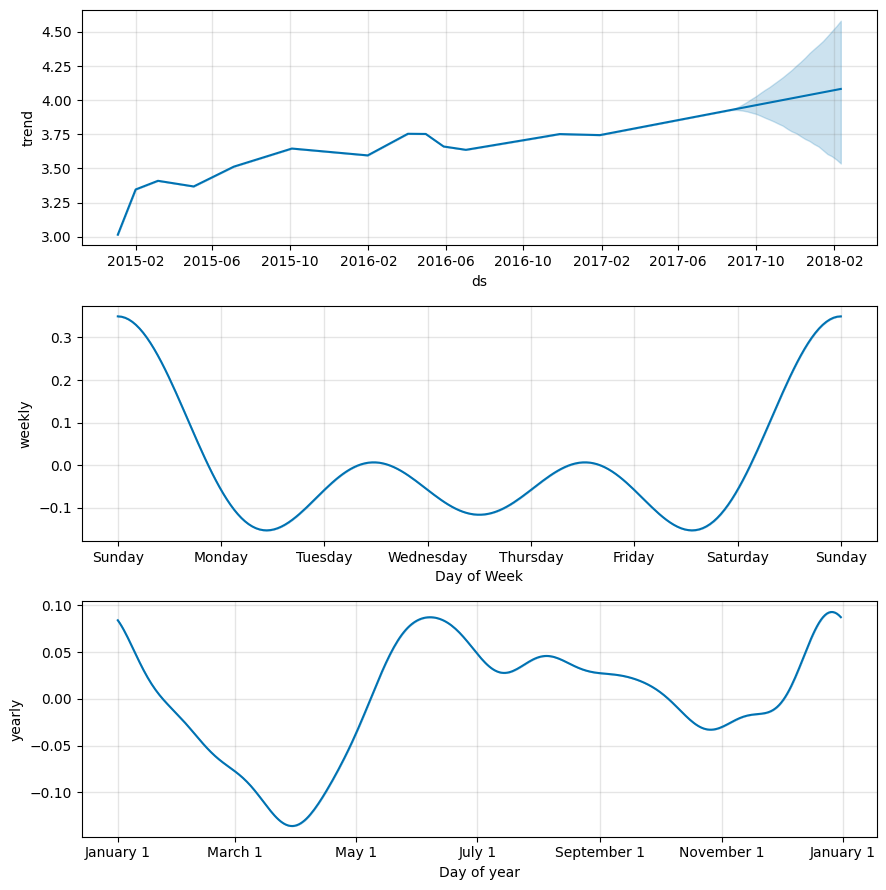

In [131]:
#Forecast final para cada store con el mejor modelo y todos los datos para la prediccion
weeks = 26
tmp = GetCompleteForecast(data_by_store, weeks, istrain=False)

In [140]:
growths = {'2017':[], '2016':[], '2015':[]}
for data_store in data_by_store:
  for year, growth in data_store.metrics['growths'].items():
    growths[str(year)].append(growth)
    print(f"Crecimiento histórico del store {data_store.id} para el año {year}: {round(growth,2)}%")
  print("\n")

Crecimiento histórico del store 1 para el año 2017: 5.08%
Crecimiento histórico del store 1 para el año 2016: 2.48%
Crecimiento histórico del store 1 para el año 2015: 1.05%


Crecimiento histórico del store 2 para el año 2017: 6.08%
Crecimiento histórico del store 2 para el año 2016: 3.61%
Crecimiento histórico del store 2 para el año 2015: 2.39%


Crecimiento histórico del store 3 para el año 2017: 4.52%
Crecimiento histórico del store 3 para el año 2016: 2.86%
Crecimiento histórico del store 3 para el año 2015: 0.86%


Crecimiento histórico del store 4 para el año 2017: 7.49%
Crecimiento histórico del store 4 para el año 2016: 3.67%
Crecimiento histórico del store 4 para el año 2015: 3.45%


Crecimiento histórico del store 5 para el año 2017: 14.43%
Crecimiento histórico del store 5 para el año 2016: 1.28%
Crecimiento histórico del store 5 para el año 2015: 0.33%


Crecimiento histórico del store 6 para el año 2017: 6.64%
Crecimiento histórico del store 6 para el año 2016: 3.95%
Cre

,2017,2016,2015
0,5.080104,2.484698,1.045475
1,6.080322,3.614635,2.391882
2,4.515261,2.862192,0.856021
3,7.486812,3.672071,3.451151
4,14.430103,1.284988,0.327712


In [153]:
df_growths = pd.DataFrame(growths)
df_growths = df_growths.replace([np.inf, -np.inf], np.nan)
df_growths.fillna(method='ffill', inplace=True)
df_growths.head()

<ipython-input-153-27f5c032bea6>:3: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_growths.fillna(method='ffill', inplace=True)


,2017,2016,2015
0,5.080104,2.484698,1.045475
1,6.080322,3.614635,2.391882
2,4.515261,2.862192,0.856021
3,7.486812,3.672071,3.451151
4,14.430103,1.284988,0.327712


In [158]:
print(f"Crecimiento aproximado el año 2017 {round(df_growths['2017'].mean(),2)}%")
print(f"Crecimiento aproximado el año 2016 {round(df_growths['2016'].mean(),2)}%")
print(f"Crecimiento aproximado el año 2015 {round(df_growths['2015'].mean(),2)}%")

Crecimiento aproximado el año 2017 10.02%
Crecimiento aproximado el año 2016 3.46%
Crecimiento aproximado el año 2015 1.81%


In [180]:
for df_store in data_by_store:
  sale = round((np.expm1(df_store.forecast[-26:].yhat)*1000).sum()/26, 2)
  print(f"store id {df_store.id} ventas promedio en el periodo ${sale}")

store id 1 ventas promedio en el periodo $78590.73
store id 2 ventas promedio en el periodo $118071.13
store id 3 ventas promedio en el periodo $292525.63
store id 4 ventas promedio en el periodo $102458.09
store id 5 ventas promedio en el periodo $96825.01
store id 6 ventas promedio en el periodo $144008.94
store id 7 ventas promedio en el periodo $156200.79
store id 8 ventas promedio en el periodo $174207.4
store id 9 ventas promedio en el periodo $143898.93
store id 10 ventas promedio en el periodo $66394.11
store id 11 ventas promedio en el periodo $152203.93
store id 12 ventas promedio en el periodo $55310.17
store id 13 ventas promedio en el periodo $57265.66
store id 14 ventas promedio en el periodo $71976.47
store id 15 ventas promedio en el periodo $58922.52
store id 16 ventas promedio en el periodo $57020.7
store id 17 ventas promedio en el periodo $107512.45
store id 18 ventas promedio en el periodo $72266.5
store id 19 ventas promedio en el periodo $88866.04
store id 20 ven

###En general se espera un crecimiento promedio entre los stores de un 10% aprox

In [106]:
#valida que se consideren las fechas correctas
tmp = forecast[-1*weeks:]
print(f"forecast desde {tmp.ds.min()} hasta {tmp.ds.max()}")
tmp = df_store.data[-1*weeks::]
print(f"df store desde {tmp.ds.min()} hasta {tmp.ds.max()}")

forecast desde 2017-05-28 00:00:00 hasta 2017-08-13 00:00:00
df store desde 2017-05-28 00:00:00 hasta 2017-08-13 00:00:00


### el store_nbr 52 tiene problemas ya que mayor parte de sus ventas son ceros, solo el 6% aprox son distintos de cero, debe realizarse un trabajo por separado

In [292]:
# Count the number of zeros in the 'sales' column
zero_sales_count = (df[df.store_nbr==52]['sales'] == 0).sum()

# Count the number of non-zero values in the 'sales' column
non_zero_sales_count = (df[df.store_nbr==52]['sales'] != 0).sum()

print(f"Number of zero sales: {zero_sales_count}")
print(f"Number of non-zero sales: {non_zero_sales_count}")

Number of zero sales: 51982
Number of non-zero sales: 3590


**a.Monto a predecir: ¿Cuánto se estima que será el monto a vender, en los próximos 6 meses desde la última observación en los datos? Considere agregar semanalmente la serie y calcule además indicadores como % crecimiento proyectado en las ventas de este periodo y compárelo contra los crecimientos en los mismos periodos, pero en años anteriores**

R: el crecimiento promedio aumentara 10%

**b. Análisis del modelo: métricas de calidad, predicción, insights relevantes**

R: MAE=4500 aprox RMSE=5000

**c. Análisis de Tendencias: ¿Qué patrones estacionales o tendencias observaste en los datos de ventas a lo largo del tiempo?**

R:Las compras aumentan los fines de semana, en general julio registra los minimos anuales y dicimebre los maximos (dependiendo del store).

**d. Relación entre Promociones y Ventas: ¿Cómo influyen las promociones en el volumen de ventas? ¿Es este impacto constante a lo largo de todas las categorías de productos o varía en función de la categoría y la tienda?**
R:no se encuentra relacion directa en los datos proporcionados.

**e. Precio del Petróleo y Comportamiento del Consumidor: ¿Existe alguna correlación significativa entre el precio del petróleo y las ventas? Si es así, ¿cómo podrías justificar este hallazgo en términos de comportamiento del consumidor o costo operativo?**

R: Aunque hay una correlación negativa entre el precio del petróleo y las ventas, esta relación es débil y probablemente insuficiente para tomar decisiones operativas basadas exclusivamente en los cambios del precio del petróleo.

**f. Recomendaciones para el Negocio: Con base en tus hallazgos, ¿qué estrategias recomendarías para optimizar las ventas durante eventos especiales o en tiendas que muestran una mayor sensibilidad a variables externas?**

- Promociones segmentadas: Aumentar la frecuencia e intensidad de promociones en categorías con alta respuesta, como BEBIDAS y LACTEOS, especialmente en tiendas que han mostrado una mayor sensibilidad.

- Optimización basada en precios del petróleo: Cuando el precio del petróleo sube, se podrían promover productos de categorías menos sensibles a los costos operativos para mitigar el impacto.

- Planificación estacional: Aprovechar los patrones estacionales identificados, como los picos de demanda en ciertos meses, para maximizar la disponibilidad de inventario y ajustar las estrategias de promoción en esos periodos.

- Monitoreo de tiendas sensibles: Implementar estrategias específicas para tiendas que han mostrado alta variabilidad en ventas, adaptando las promociones y los productos en función de las necesidades locales y eventos especiales.